In [1]:
import pandas as pd
import numpy as np
import itertools
from itertools import chain
import csv
import re
import nltk
from tqdm import tqdm
import random
from sklearn.model_selection import KFold
import time
import matplotlib.pyplot as plt
import datetime
from sentence_transformers import SentenceTransformer
import pickle
import os
from tokenizers import BertWordPieceTokenizer
from transformers import BertTokenizer, BertConfig, BertForSequenceClassification, TrainingArguments, AutoModelForSequenceClassification, DataCollatorWithPadding, Trainer, AutoTokenizer, TFBertModel, BertModel
import torch
import torch.nn as nn
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import seaborn as sns
import statsmodels.api as sm
from scipy import stats
from collections import Counter
import spacy
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.metrics import classification_report
from gensim.models import Word2Vec
from gensim.models.keyedvectors import KeyedVectors
from datasets import Dataset, DatasetDict
from evaluate import load
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from wordcloud import WordCloud

nltk.download('averaged_perceptron_tagger_eng')

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\woute\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


True

In [2]:
def import_communication_data(path: str, preprocess:bool = True, remove_signoff:bool = True, newline:str = r'_/n_', reply_signs:list = None, code_words:list = None, remove_bots:bool = True, remove_names:bool = True, negation_preprocessing:bool = False, emoticon_preprocessing:bool = True, token_removal:bool = True) -> pd.DataFrame:
    print('Importing data...')
    raw_data = pd.read_csv(path, parse_dates=['reply_datetimetz']).dropna(axis = 0, subset = ['reply_from', 'reply_id', 'reply_subject', 'reply_body'])
    # Remove URLs
    raw_data['reply_body'] = raw_data['reply_body'].str.replace(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$\-_@.&+#]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', regex = True)

    if raw_data.dtypes['reply_datetimetz']=='object':
        raw_data['reply_datetimetz'] = pd.to_datetime(raw_data['reply_datetimetz'], format = 'mixed')
    raw_data.reply_datetimetz = raw_data.reply_datetimetz.dt.tz_localize(tz = 'UTC')

    regex_newline = newline.replace('/', r'\/')
    if not preprocess:
        raw_data['reply_body'] = raw_data['reply_body'].str.replace(regex_newline, ' ', regex = True)
        raw_data['reply_subject'] = raw_data['reply_subject'].str.replace(regex_newline, ' ', regex = True)
        raw_data['reply_body'] = raw_data['reply_body'].str.replace(r'\s\s+', ' ', regex = True)
        return raw_data
        
    
    # raw_data['reply_body'] = raw_data['reply_body'].str.replace(newline+'.*\(\).*'+newline, regex = True) # remove most code, as we remove all sentences where brackets do not contain any information --> Tekst over code willen we erin houden
    tqdm.pandas()
    print('Removing replies...')
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('(?:'+regex_newline+'\s*)+>.*?(?='+regex_newline+')', '', regex = True) # remove all replies, signified with > before the start of a sentence
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('(?:'+regex_newline+r'\s*)+\|.*?(?='+regex_newline+')', '', regex = True) # remove all replies signified with | before the start of a sentence
    print('Removing Unnecessary code-like text...')
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('-----BEGIN PGP SIGNED MESSAGE-----', '')
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('----- GICM -----', '')
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('----- SERVER -----.*$', '', regex = True)
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('----- CLIENT -----.*$', '', regex = True)
    raw_data['reply_body'] = raw_data['reply_body'].str.replace(r'-----+\s* logs follow -----.*$', '', regex = True)
    
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('-----cut here-----.*-----cut here-----', '', regex = True)
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('-----8<-----.*-----8<-----', '', regex = True)
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('-----BEGIN PGP SIGNATURE-----.*-----END PGP SIGNATURE-----', '', regex = True)
    raw_data['reply_body'] = raw_data['reply_body'].str.replace(r'(?:^|'+regex_newline+r')((?:(?!'+regex_newline+r').)*?[Ww]rote:)', '', regex = True)
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('----- start patch -----.*----- end patch -----', '', regex = True)
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('----- start -----.*----- end -----', '', regex = True)
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('-----+Build Errors-----.*error[^'+regex_newline+']*'+regex_newline, newline, regex = True)
    raw_data['reply_body'] = raw_data['reply_body'].str.replace(r'([+\-]*-----\+-----[+\-]*)'+regex_newline +r'.*([+\-]*-----\+-----[+\-]*)', r'\2', regex = True)
    raw_data['reply_body'].str.replace(r'([+\-]*-----+-----[+\-]*)', r'', regex = True)
    raw_data['reply_body'] = raw_data['reply_body'].str.replace('----- Forwarded [mM]essage -----.*----- End forwarded message -----', '', regex = True)
    
    
    if remove_signoff:
        print('Removing Sign-offs...')
        raw_data['reply_body'] = raw_data['reply_body'].str.replace(regex_newline+r'\s*-+[a-zA-Z ]*\s*'+regex_newline+r'[^\-]*-*([^\-]|(\d(-\d)+))*($|([Pp].[Ss].))', '\\4', regex = True)
    
    if reply_signs:
        print('Removing e-mail replies...')
        for reply in tqdm(reply_signs):
            raw_data['reply_body'] = raw_data['reply_body'].str.replace(reply+'.*$', '', regex = True)
            
    if code_words:
        print('Removing code words...')
        for word in tqdm(code_words):
            raw_data['reply_body'] = raw_data['reply_body'].str.replace(r'\s' + word + r'\s', '', regex = True)
    
    if remove_bots:
        print('Removing bots from entries...')
        raw_data = raw_data[~raw_data['reply_from'].str.contains(r'[\(\[\-]bot(?:[\)\]]|$)', case = False)]
        
    if remove_names:
        print('Removing Names...')
        # In order:
        # Remove quotation marks
        # Remove stuff between brackets (vaak email adressen)
        # Remove Email adresses still left in name
        # Remove dots from the name
        # Remove things added to the end of a name after - (often company of employment) (require whitespaces to make sure second names are not affected)
        # Remove entries which contain an x with a set of numbers succeeding it, as this is likely introduced by a unknown character
        # Retrieve nickname, which is usually posted between two backslashes (\...\)
        # If there is only one character (often one letter left from 2nd name/abbreviation at the start of the name), remove it
        # Remove the extra space surrounding a | token
        # Remove additional white spaces at the start/end of a token
        # Remove multiple white spaces after each other
        # Remove test and test account from the set of names
        names = set(itertools.chain(*raw_data.reply_from.str.replace('"', '').str.replace("[<(].*[>)]", '', regex = True).str.replace(r"[a-zA-Z0-9.\-_]+@\w+(.\w\w+)+", '', regex = True).str.replace('.', '').str.replace(r'\s-\s\w+($|\|)', '', regex = True).str.replace(r'(^|\|)\s*(.*),\s*(.*)($|\|)', '\\1\\3 \\2', regex = True).str.replace(r'x\d+', '', regex = True).str.replace(r'(^|\|)([^|]*)\\([^\\]+)\\([^|]*)(\||$)', '\\1\\2 \\4|\\3\\5', regex = True).str.replace(r'(^|\s)[^\|](\s|$)', ' ', regex = True).str.replace(r'\s+\|\s+', '|', regex = True).str.strip().str.replace(r'\s\s+', ' ', regex = True).str.split('|').to_list())).difference({'Test', 'Test Account', 'test', 'test account'})
        
        first_names = {name.split(' ')[0] for name in names}
        
        for name in tqdm(names):
            raw_data['reply_body'] = raw_data['reply_body'].str.replace(r'\s+'+name+r'\s+', '', regex = True, case = False)
            
        for name in tqdm(first_names):
            raw_data['reply_body'] = raw_data['reply_body'].str.replace(r'\s+'+name+r'\s+', '', regex = True, case = False)
        
    with open("SentiCR/SentiCR/Contractions.txt","r") as contractions,\
     open("SentiCR/SentiCR/EmoticonLookupTable.txt","r") as emotable:
        contractions_reader=csv.reader(contractions, delimiter='\t')
        emoticon_reader=csv.reader(emotable,delimiter='\t')
    
        #Hash words from dictionary with their values
        contractions_dict = {rows[0]:rows[1] for rows in contractions_reader}
        emodict={rows[0]:rows[1] for rows in emoticon_reader}
    
        contractions.close()
        emotable.close()
        
    print('Removing contractions...')
    contractions_regex = re.compile('(%s)' % '|'.join(contractions_dict.keys()))
    raw_data['reply_body'] = raw_data['reply_body'].progress_apply(lambda x: expand_contractions(x, contractions_dict, contractions_regex))
    
    if emoticon_preprocessing:
        print('Removing emoticons...')
        for emoticon in tqdm(emodict):
            raw_data['reply_body'] = raw_data['reply_body'].str.replace(emoticon, emodict[emoticon])
            
    if negation_preprocessing:
        print('Negating text...')
        raw_data['reply_body'] = raw_data['reply_body'].progress_apply(lambda x: handle_negation(x))
        
    
    print('Removing infrequent words...')

    # split words into lists
    v = raw_data['reply_body'].str.split().tolist() # [s.split() for s in df['Col2'].tolist()]
    # compute global word frequency
    c = Counter(chain.from_iterable(v))
    # filter, join, and re-assign
    raw_data['reply_body'] = [' '.join([j for j in i if c[j] > 5]) for i in v]
        
    raw_data['reply_body'] = raw_data['reply_body'].str.replace(regex_newline, ' ', regex = True)
    raw_data['reply_subject'] = raw_data['reply_subject'].str.replace(regex_newline, ' ', regex = True)
    raw_data['reply_body'] = raw_data['reply_body'].str.replace(r'\s\s+', ' ', regex = True)
    return raw_data
    
   
def import_dev_data(path:str, communication_data:pd.DataFrame = None, model = None, tokenizer = None, LR:bool = False, bert_messages:pd.DataFrame = None) -> pd.DataFrame:
    tqdm.pandas()
    print('Importing dev data')
    data = pd.read_csv(path, parse_dates=['From','To'])
    
    dates = data.From.unique()
    data.set_index(['Alias', 'From'], inplace = True)
    data['Messages Sent'] = data['Messages Sent'].fillna(0)
    
    print('Calculating Seasonality...')
    monthly_average = data.groupby(data.index.get_level_values('From').month)['Workload'].mean()
    mapped_monthly_average = data.index.get_level_values('From').map(lambda x: monthly_average.loc[x.month])
    
    data['standardized_workload'] = data['Workload']/mapped_monthly_average
    
    
    data['burnout'] = np.nan
    print('Calculating burnout per dev...')
    for developer in tqdm(data.index.levels[0].unique()):
        data = calculate_burnout(developer, data)
       
    print('Calculating lagged burnouts...')
    data['lagged_burnout'] = data.groupby(level=0)['burnout'].shift(periods = -1)
    data['burnout_t+1'] = data.apply(lambda x: calculate_lagged_burnout(x), axis = 1)
    data['burnout_t+3'] = (data.groupby(level=0)['burnout'].shift(periods = -3)) | (data.groupby(level=0)['burnout'].shift(periods = -2)) | (data['burnout_t+1']) 
    data['burnout_t+12'] = (data.groupby(level=0)['burnout'].shift(periods = -12)) | (data.groupby(level=0)['burnout'].shift(periods = -11)) | (data.groupby(level=0)['burnout'].shift(periods = -10)) |(data.groupby(level=0)['burnout'].shift(periods = -9)) | (data.groupby(level=0)['burnout'].shift(periods = -8)) |(data.groupby(level=0)['burnout'].shift(periods = -7)) | (data.groupby(level=0)['burnout'].shift(periods = -6)) |(data.groupby(level=0)['burnout'].shift(periods = -5)) | (data.groupby(level=0)['burnout'].shift(periods = -4)) | (data['burnout_t+3']) 
    
    print('Calculating Black Cloud...')
    data['black_cloud'] = (data['Radio Silence']) & (data.groupby(level = 0)['Radio Silence'].shift(periods = 1))
    
    if communication_data is None:
        # If we have not provided any communication_data, we only need the dev data
        return data
    
    print('Calculating quitting months')
    data['working_months'] = True # Indicate which months originally are worked in
    retrieved_dates = pd.Series(data.index.get_level_values(1).rename('Temp')).set_axis(data.index)
    # Quit happens when there are 3 consecutive months in which no work is performed or after the final month of work (which is not equivalent to the final month in the df)
    data['quit'] = (((data.Workload.isna()) &
                     (((data.groupby(level=0)['Workload'].shift(periods = -1).isna()) & (data.groupby(level=0)['Workload'].shift(periods = -2).isna())) |
                      ((data.groupby(level=0)['Workload'].shift(periods = -1).isna()) & (data.groupby(level=0)['Workload'].shift(periods = 1).isna())) |
                      ((data.groupby(level=0)['Workload'].shift(periods = 1).isna()) & (data.groupby(level=0)['Workload'].shift(periods = 2))))) | 
                    ((data.groupby(level=0)['working_months'].shift(periods = -1).isna()) & (retrieved_dates < max(retrieved_dates))) | 
                    ((data.groupby(level=0)['Workload'].shift(periods = -1).isna()) & (data.groupby(level=0)['Workload'].shift(periods = -2).isna()) & (data.groupby(level=0)['Workload'].shift(periods = -3).isna())))
    
    data['first_quit_month'] = ((data['quit']) & (~data.Workload.isna()))
    
    print('Calculating ragequit...')
    if bert_messages is None:
        data['ragequit_t+1'] = data.progress_apply(lambda x: detect_ragequit(x, communication_data, model, tokenizer), axis = 1)
    else:
        data['ragequit_t+1'] = data.progress_apply(lambda x: detect_ragequit(x, bert_messages, model, tokenizer), axis = 1)
    print('Calculating lagged ragequits...')
    data['ragequit_t+3'] = (data.groupby(level=0)['ragequit_t+1'].shift(periods = -2)) | (data.groupby(level=0)['ragequit_t+1'].shift(periods = -1)) | (data['ragequit_t+1']) 
    data['ragequit_t+12'] = (data.groupby(level=0)['ragequit_t+1'].shift(periods = -11)) | (data.groupby(level=0)['ragequit_t+1'].shift(periods = -10)) | (data.groupby(level=0)['ragequit_t+1'].shift(periods = -9)) |(data.groupby(level=0)['ragequit_t+1'].shift(periods = -8)) | (data.groupby(level=0)['ragequit_t+1'].shift(periods = -7)) |(data.groupby(level=0)['ragequit_t+1'].shift(periods = -6)) | (data.groupby(level=0)['ragequit_t+1'].shift(periods = -5)) |(data.groupby(level=0)['ragequit_t+1'].shift(periods = -4)) | (data.groupby(level=0)['ragequit_t+1'].shift(periods = -3)) | (data['ragequit_t+3']) 
    
    if LR:
        return data
    
    print('Reformatting communication dates')
    communication_data['reply_datetimetz'] = pd.to_datetime(communication_data['reply_datetimetz'], utc = True)
    communication_data['start_month'] = communication_data.progress_apply(lambda x: return_closest_date(x, dates), axis = 1)
    return communication_data.merge(data, how = 'left', left_on= ['reply_from', 'start_month'], right_index = True)

def import_network_data(path:str, communication_data:pd.DataFrame, communication:bool = True):
    print('Retrieving and combining network data...')
    network_data = pd.read_csv(path, parse_dates = ['start_datetime', 'end_datetime'])
    if communication:
        return communication_data.merge(network_data, how = 'left', left_on = 'start_month', right_on = 'start_datetime')
    else:
        communication_data.reset_index(inplace = True)
        return communication_data.merge(network_data, how = 'left', left_on = 'From', right_on = 'start_datetime')
    
    
def calculate_burnout(developer: str, all_dev_data: pd.DataFrame, decrease_percentage:float = 0.2, range = 3):
    all_days = pd.date_range(
        min(all_dev_data[all_dev_data.index.get_level_values('Alias') == developer].index.get_level_values('From')), 
        max(all_dev_data[all_dev_data.index.get_level_values('Alias') == developer].index.get_level_values('From')), 
        freq='30d')
    res_lst = []
    min_date = min(all_dev_data[all_dev_data.index.get_level_values('Alias') == developer].index.get_level_values('From'))+datetime.timedelta(days = range*30)
    for date in all_days:
        try:
            # Use try-except loop to include dates where there is no workload
            if date < min_date:
                # Cannot check the previous month for burnout, nor calculate it following the given definition of burnout, return NaN
                is_burnt_out = np.nan
            elif date == min_date:
                # For the fourth month, we simply have to calculate whether the deviation holds
                burnout_data = all_dev_data[(all_dev_data.index.get_level_values('Alias') == developer) & (all_dev_data.index.get_level_values('From') < date)]
                # Calculating the deviation, If there are too little entries, return NaN
                if len(burnout_data) < (2/3)*range:
                    is_burnt_out = np.nan
                else:
                    is_burnt_out = all_dev_data.at[(developer, date), 'standardized_workload'] < burnout_data.standardized_workload.median() * (1-decrease_percentage)
            else:
                # We first have to retrieve the last of the previous months which were not burnt-out to find the baseline
                if False in res_lst:
                    no_burnout_month = len(res_lst) - 1 - res_lst[::-1].index(False)
                    burnout_data = all_dev_data[(all_dev_data.index.get_level_values('Alias') == developer) & (all_days[no_burnout_month] < all_dev_data.index.get_level_values('From'))& (all_dev_data.index.get_level_values('From') < all_days[no_burnout_month+range])]
                    # Calculating the deviation, If there are too little entries, return NaN
                    if len(burnout_data) < (2/3)*range:
                        is_burnt_out = np.nan
                    else:
                        is_burnt_out = all_dev_data.at[(developer, date), 'standardized_workload'] < burnout_data.standardized_workload.median() * (1-decrease_percentage)
                    
                else:
                    # We need to compare the workload level of this month to the first 3 in accordance with date == min_date
                    burnout_data = all_dev_data[(all_dev_data.index.get_level_values('Alias') == developer) & (all_dev_data.index.get_level_values('From') < min_date)]
                    # Calculating the deviation, If there are too little entries, return NaN
                    if len(burnout_data) < (2/3)*range:
                        is_burnt_out = np.nan
                    else:
                        is_burnt_out = all_dev_data.at[(developer, date), 'standardized_workload'] < burnout_data.standardized_workload.median() * (1-decrease_percentage)
        except:
            # Happens when there is no workload in a given month
            is_burnt_out = np.nan
                        
        res_lst.append(is_burnt_out)
            
    res_df = pd.DataFrame({'burnout':res_lst, 'extra':res_lst}, index = pd.MultiIndex.from_tuples(itertools.product([developer], all_days), names = ['Alias', 'From']))
    # Create the rows with the new months 
    all_dev_data = all_dev_data.merge(res_df[['extra']], how = 'outer', left_index = True, right_index=True).drop('extra', axis = 1)
    # Fill the burnout of the all_dev_data
    return all_dev_data.combine_first(res_df).drop('extra', axis = 1)

def calculate_lagged_burnout(data: pd.Series) -> bool:
    if np.isnan(data.burnout):
        return data.lagged_burnout
    elif np.isnan(data.lagged_burnout):
        return data.burnout
    else: 
        return data.burnout or data.lagged_burnout
        

def detect_ragequit(dev_data: pd.Series, communication_data: pd.DataFrame, model, tokenizer):
    if not dev_data.quit:
        # Can never be ragequit if dev hasn't quit
        return False
    elif dev_data.first_quit_month:
        # Dev will quit somewhere in this time period, therefore, we will need to retrieve the closest message to the end of the month to analyse
        last_date = dev_data.To
    else:
        # Not accurate if there is still communication months after the work has stopped, but feels like necessary evil to reduce calculation times and to refrain from having to go through the entire dataframe to search for the first_quit_month
        last_date = dev_data.name[1]
        
    
    dev_name = dev_data.name[0]
    try:
        dev_communication = communication_data[(communication_data.reply_from == dev_name) & (pd.to_datetime(communication_data.reply_datetimetz) < last_date)]
        last_message = dev_communication[dev_communication['reply_datetimetz'] == max(dev_communication.reply_datetimetz)].iloc[0]['reply_body']
        inputs = tokenizer(last_message, return_tensors = 'pt')
        softmax = torch.nn.functional.softmax(model(**inputs)['logits'], dim=-1)
        return softmax[0,2].item() > softmax[0,1].item() and softmax[0,2].item() > 0.15
    
    except:
        # If the developer has no messages (before the quitting date), the previous code would return an error, therefore, these developers do not rage quit, but rather silently quit
        return False
    
# def calculate_future_burnout_3(observation: pd.Series, data: pd.DataFrame) -> bool:
#     if 
        

def return_closest_date(reply: pd.Series, date_range: list):
    return date_range[pd.Series([reply.reply_datetimetz - date if (reply.reply_datetimetz - date) > datetime.timedelta(seconds = 0) else datetime.timedelta(days = 50) for date in date_range]).idxmin()]

def expand_contractions(s, contractions_dict, contractions_regex):
     def replace(match):
         return contractions_dict[match.group(0)]
     return contractions_regex.sub(replace, s.lower())

def handle_negation(comments):
    grammar= r"""
    NegP: {<VERB>?<ADV>+<VERB|ADJ>?<PRT|ADV><VERB>}
    {<VERB>?<ADV>+<VERB|ADJ>*<ADP|DET>?<ADJ>?<NOUN>?<ADV>?}
    
    """
    chunk_parser = nltk.RegexpParser(grammar)
    sentences = nltk.sent_tokenize(comments)
    modified_st=[]
    for st in sentences:
        allwords = nltk.word_tokenize(st)
        modified_words=[]
        if negated(allwords):
            part_of_speech = nltk.tag.pos_tag(allwords,tagset='universal')
            chunked = chunk_parser.parse(part_of_speech)
            #print("---------------------------")
            #print(st)
            for n in chunked:
                if isinstance(n, nltk.tree.Tree):
                    words = [pair[0] for pair in n.leaves()]
                    #print(words)

                    if n.label() == 'NegP' and negated(words):
                        for i, (word, pos) in enumerate(n.leaves()):
                            if (pos=="ADV" or pos=="ADJ" or pos=="VERB") and (word!="not"):
                                modified_words.append(prepend_not(word))
                            else:
                                modified_words.append(word)
                    else:
                         modified_words.extend(words)
                else:
                    modified_words.append(n[0])
            newst =' '.join(modified_words)
            #print(newst)
            modified_st.append(newst)
        else:
            modified_st.append(st)
    return ". ".join(modified_st)

def negated(input_words):
    """
    Determine if input contains negation words
    """
    negation_words =['not', 'never', 'none', 'nobody', 'nowhere', 'neither', 'barely', 'hardly',
                     'nothing', 'rarely', 'seldom', 'despite' ]

    emoticon_words=['PositiveSentiment','NegativeSentiment']

    neg_words = []
    neg_words.extend(negation_words)
    for word in neg_words:
        if word in input_words:
            return True
    return False

def prepend_not(word):
    negation_words =['not', 'never', 'none', 'nobody', 'nowhere', 'neither', 'barely', 'hardly',
                     'nothing', 'rarely', 'seldom', 'despite' ]

    emoticon_words=['PositiveSentiment','NegativeSentiment']
    if word in emoticon_words:
        return word
    elif word in negation_words:
        return word
    return "NOT_"+word



In [3]:
geronimo_emails = ['----- Mensaje Original -----',
 '----- Methods required by DeploymentManager -----',
 '----- Methods required to populate Property Editors -----',
 '----- Oorspronkelijk bericht -----',
 '----- Original Message -----',
'-----Email-----',
 '-----Mensagem original-----',
 '-----Mensaje original-----',
 '-----Oorspronkelijk bericht-----',
 '-----Original Email-----',
 '-----Original Message-----',
 '-----Ursprungliche Nachricht-----',
 '-----Ursprungligt meddelande-----',
 '-----UrsprÃ¼ngliche Nachricht-----',
 '----- Forwarded Message -----',
 '----- Forwarded message -----']

code_words = ['while', 'case', 'switch','def', 'abstract','byte','continue','native','private','synchronized',
 'if', 'do', 'include', 'each', 'than', 'finally', 'class', 'double', 'float', 'int','else','instanceof',
 'long', 'super', 'import', 'short', 'default', 'catch', 'try', 'new', 'final', 'extends', 'implements',
 'public', 'protected', 'static', 'this', 'return', 'char', 'const', 'break', 'boolean', 'bool', 'package',
 'byte', 'assert', 'raise', 'global', 'with', 'or', 'yield', 'in', 'out', 'except', 'and', 'enum', 'signed',
 'void', 'virtual', 'union', 'goto', 'var', 'function', 'require', 'print', 'echo', 'foreach', 'elseif', 'namespace',
 'delegate', 'event', 'override', 'struct', 'readonly', 'explicit', 'interface', 'get', 'set','elif','for',
 'throw','throws','lambda','endfor','endforeach','endif','endwhile','clone']

In [11]:
csv_path = "dev-sentiment/train_df_final.csv"
text_column = "Text"  # Change this if your column is named differently

# Output paths
output_txt = "train_corpus.txt"
tokenizer_dir = "custom-bert-tokenizer"
vocab_size = 28996  # MUST match the vocab size expected by your model

print("Reading CSV...")
df = pd.read_csv(csv_path)
df[text_column] = df[text_column].astype(str)
df[text_column].dropna().to_csv(output_txt, index=False, header=False)

print(f"Extracted {len(df)} lines of text to {output_txt}...")

# === Step 3: Train the Tokenizer ===

print("Training WordPiece tokenizer...")
tokenizer = BertWordPieceTokenizer(lowercase=True)

tokenizer.train(
    files=output_txt,
    vocab_size=vocab_size,
    min_frequency=2,
    limit_alphabet=1000,
    special_tokens=["[PAD]", "[UNK]", "[CLS]", "[SEP]", "[MASK]"]
)

# Save the trained tokenizer
os.makedirs(tokenizer_dir, exist_ok=True)
tokenizer.save_model(tokenizer_dir)

# Save in Hugging Face format
hf_tokenizer = BertTokenizer.from_pretrained(tokenizer_dir)
hf_tokenizer.save_pretrained(tokenizer_dir)

print(f"Tokenizer saved to: {tokenizer_dir}")


Reading CSV...
Extracted 4068 lines of text to train_corpus.txt...
Training WordPiece tokenizer...
Tokenizer saved to: custom-bert-tokenizer


In [17]:
tokenizer = BertTokenizer.from_pretrained("custom-bert-tokenizer")

config = BertConfig.from_pretrained("bert-base-uncased", num_labels=3)
config.vocab_size = 28996  # important!

# Initialize the model with the updated config
model = BertForSequenceClassification(config)

# Load the checkpoint
state_dict = torch.load("dev-sentiment/bert_model.pt", map_location="cpu")
model.load_state_dict(state_dict)

communication_geronimo = import_communication_data("Test/data/geronimo_communication_2003-2007.csv", reply_signs=geronimo_emails, remove_names=True, negation_preprocessing=False, code_words=code_words)
dev_geronimo = import_dev_data('Test/data/dev_data_geronimo.csv', communication_geronimo, model, tokenizer)
all_geronimo = import_network_data('Test/data/network_data_geronimo.csv', dev_geronimo)

communication_ambari = import_communication_data("Test/data/ambari_communication_2018-2020.csv", reply_signs=geronimo_emails, remove_names=True, negation_preprocessing=False, code_words=code_words)
dev_ambari = import_dev_data('Test/data/dev_data_ambari.csv', communication_ambari, model, tokenizer)
all_ambari = import_network_data('Test/data/network_data_ambari.csv', dev_ambari)

communication_apex = import_communication_data("Test/data/apexcore_communication_2015-2017.csv", reply_signs=geronimo_emails, remove_names=True, negation_preprocessing=False, code_words=code_words)
dev_apex = import_dev_data('Test/data/dev_data_apexcore.csv', communication_apex, model, tokenizer)
all_apex = import_network_data('Test/data/network_data_apexcore.csv', dev_apex)

communication_helix = import_communication_data("Test/data/helix_communication_2015-2020.csv", reply_signs=geronimo_emails, remove_names=True, negation_preprocessing=False, code_words=code_words)
dev_helix = import_dev_data('Test/data/dev_data_helix.csv', communication_helix, model, tokenizer)
all_helix = import_network_data('Test/data/network_data_helix.csv', dev_helix)

communication_thrift = import_communication_data("Test/data/thrift_communication_2016-2018.csv", reply_signs=geronimo_emails, remove_names=True, negation_preprocessing=False, code_words=code_words)
dev_thrift = import_dev_data('Test/data/dev_data_thrift.csv', communication_thrift, model, tokenizer)
all_thrift = import_network_data('Test/data/network_data_thrift.csv', dev_thrift)


communication_bookkeeper= import_communication_data("Test/data/bookkeeper_communication_2012-2015.csv", reply_signs=geronimo_emails, remove_names=True, negation_preprocessing=False, code_words=code_words)
dev_bookkeeper = import_dev_data('Test/data/dev_data_bookkeeper.csv', communication_bookkeeper, model, tokenizer)
all_bookkeeper = import_network_data('Test/data/network_data_bookkeeper.csv', dev_bookkeeper)

pd.concat([all_geronimo, all_ambari, all_apex, all_helix, all_thrift, all_bookkeeper]).to_csv('Test/data/all_communication_data.csv')

Importing data...
Removing replies...
Removing Unnecessary code-like text...
Removing Sign-offs...
Removing e-mail replies...


100%|██████████| 16/16 [00:00<00:00, 24.27it/s]


Removing code words...


100%|██████████| 88/88 [00:25<00:00,  3.48it/s]


Removing bots from entries...
Removing Names...


100%|██████████| 766/766 [05:58<00:00,  2.13it/s]


Removing contractions...


100%|██████████| 41693/41693 [00:03<00:00, 10447.39it/s]


Removing emoticons...


100%|██████████| 96/96 [00:02<00:00, 39.80it/s]


Removing infrequent words...
Importing dev data
Calculating Seasonality...
Calculating burnout per dev...


100%|██████████| 44/44 [00:01<00:00, 35.41it/s]


Calculating lagged burnouts...
Calculating Black Cloud...
Calculating quitting months
Calculating ragequit...


100%|██████████| 1029/1029 [00:48<00:00, 21.06it/s]


Calculating lagged ragequits...
Reformatting communication dates


100%|██████████| 41693/41693 [00:46<00:00, 898.59it/s] 


Retrieving and combining network data...
Importing data...
Removing replies...
Removing Unnecessary code-like text...
Removing Sign-offs...
Removing e-mail replies...


100%|██████████| 16/16 [00:00<00:00, 173.13it/s]


Removing code words...


100%|██████████| 88/88 [00:02<00:00, 31.49it/s]


Removing bots from entries...
Removing Names...


100%|██████████| 325/325 [00:16<00:00, 19.20it/s]


Removing contractions...


100%|██████████| 3704/3704 [00:00<00:00, 8291.63it/s]


Removing emoticons...


100%|██████████| 96/96 [00:00<00:00, 370.70it/s]


Removing infrequent words...
Importing dev data
Calculating Seasonality...
Calculating burnout per dev...


100%|██████████| 95/95 [00:01<00:00, 74.43it/s]


Calculating lagged burnouts...
Calculating Black Cloud...
Calculating quitting months
Calculating ragequit...


100%|██████████| 551/551 [00:15<00:00, 36.70it/s]


Calculating lagged ragequits...
Reformatting communication dates


100%|██████████| 3704/3704 [00:02<00:00, 1473.60it/s]


Retrieving and combining network data...
Importing data...
Removing replies...
Removing Unnecessary code-like text...
Removing Sign-offs...
Removing e-mail replies...


100%|██████████| 16/16 [00:00<00:00, 61.90it/s]


Removing code words...


100%|██████████| 88/88 [00:14<00:00,  6.16it/s]


Removing bots from entries...
Removing Names...


100%|██████████| 170/170 [00:41<00:00,  4.13it/s]


Removing contractions...


100%|██████████| 15873/15873 [00:01<00:00, 8593.80it/s]


Removing emoticons...


100%|██████████| 96/96 [00:01<00:00, 93.03it/s] 


Removing infrequent words...
Importing dev data
Calculating Seasonality...
Calculating burnout per dev...


100%|██████████| 50/50 [00:00<00:00, 64.65it/s]


Calculating lagged burnouts...
Calculating Black Cloud...
Calculating quitting months
Calculating ragequit...


100%|██████████| 412/412 [00:14<00:00, 28.48it/s]


Calculating lagged ragequits...
Reformatting communication dates


100%|██████████| 15873/15873 [00:11<00:00, 1361.48it/s]


Retrieving and combining network data...
Importing data...


ValueError: time data "2019-07-24" doesn't match format "%Y-%m-%d %H:%M:%S", at position 7202. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

In [30]:
dev_geronimo = import_dev_data('Test/data/dev_data_geronimo.csv', communication_geronimo, model, tokenizer, LR = True)
logistic_geronimo = import_network_data('Test/data/network_data_geronimo.csv', dev_geronimo, communication=False).dropna(axis = 0, subset = ['Radio Silence', 'Organisational Silo', 'Lone Wolf'])

dev_ambari = import_dev_data('Test/data/dev_data_ambari.csv', communication_ambari, model, tokenizer, LR = True)
logistic_ambari = import_network_data('Test/data/network_data_ambari.csv', dev_ambari, communication=False).dropna(axis = 0, subset = ['Radio Silence', 'Organisational Silo', 'Lone Wolf'])

dev_apex = import_dev_data('Test/data/dev_data_apexcore.csv', communication_apex, model, tokenizer, LR = True)
logistic_apex = import_network_data('Test/data/network_data_apexcore.csv', dev_apex, communication=False).dropna(axis = 0, subset = ['Radio Silence', 'Organisational Silo', 'Lone Wolf'])

dev_helix = import_dev_data('Test/data/dev_data_helix.csv', communication_helix, model, tokenizer, LR = True)
logistic_helix = import_network_data('Test/data/network_data_helix.csv', dev_helix, communication=False).dropna(axis = 0, subset = ['Radio Silence', 'Organisational Silo', 'Lone Wolf'])

dev_thrift = import_dev_data('Test/data/dev_data_thrift.csv', communication_thrift, model, tokenizer, LR = True)
logistic_thrift = import_network_data('Test/data/network_data_thrift.csv', dev_thrift, communication=False).dropna(axis = 0, subset = ['Radio Silence', 'Organisational Silo', 'Lone Wolf'])

dev_bookkeeper = import_dev_data('Test/data/dev_data_bookkeeper.csv', communication_bookkeeper, model, tokenizer, LR = True)
logistic_bookkeeper = import_network_data('Test/data/network_data_bookkeeper.csv', dev_bookkeeper, communication=False).dropna(axis = 0, subset = ['Radio Silence', 'Organisational Silo', 'Lone Wolf'])

pd.concat([logistic_geronimo, logistic_ambari, logistic_apex, logistic_helix, logistic_thrift, logistic_bookkeeper]).to_csv('Test/data/all_logistic_data.csv')

Importing dev data
Calculating Seasonality...
Calculating burnout per dev...


100%|██████████| 44/44 [00:01<00:00, 37.79it/s]


Calculating lagged burnouts...
Calculating Black Cloud...
Calculating quitting months
Calculating ragequit...


100%|██████████| 1029/1029 [00:43<00:00, 23.67it/s]


Calculating lagged ragequits...
Retrieving and combining network data...
Importing dev data
Calculating Seasonality...
Calculating burnout per dev...


100%|██████████| 95/95 [00:01<00:00, 72.41it/s]


Calculating lagged burnouts...
Calculating Black Cloud...
Calculating quitting months
Calculating ragequit...


100%|██████████| 551/551 [00:15<00:00, 34.89it/s]


Calculating lagged ragequits...
Retrieving and combining network data...
Importing dev data
Calculating Seasonality...
Calculating burnout per dev...


100%|██████████| 50/50 [00:00<00:00, 66.67it/s]


Calculating lagged burnouts...
Calculating Black Cloud...
Calculating quitting months
Calculating ragequit...


100%|██████████| 412/412 [00:15<00:00, 26.63it/s]


Calculating lagged ragequits...
Retrieving and combining network data...
Importing dev data
Calculating Seasonality...
Calculating burnout per dev...


100%|██████████| 44/44 [00:00<00:00, 55.09it/s]


Calculating lagged burnouts...
Calculating Black Cloud...
Calculating quitting months
Calculating ragequit...


100%|██████████| 511/511 [00:18<00:00, 27.47it/s] 


Calculating lagged ragequits...
Retrieving and combining network data...
Importing dev data
Calculating Seasonality...
Calculating burnout per dev...


100%|██████████| 208/208 [00:02<00:00, 80.55it/s]


Calculating lagged burnouts...
Calculating Black Cloud...
Calculating quitting months
Calculating ragequit...


100%|██████████| 706/706 [01:00<00:00, 11.74it/s]


Calculating lagged ragequits...
Retrieving and combining network data...
Importing dev data
Calculating Seasonality...
Calculating burnout per dev...


100%|██████████| 4/4 [00:00<00:00, 22.97it/s]


Calculating lagged burnouts...
Calculating Black Cloud...
Calculating quitting months
Calculating ragequit...


100%|██████████| 129/129 [00:01<00:00, 72.92it/s]


Calculating lagged ragequits...
Retrieving and combining network data...


# Geronimo Analysis

In [3]:
all_test = pd.read_csv('Test/data/all_communication_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)
all_test

,identity_id,reply_from,reply_id,in_reply_to_id,reply_datetimetz,reply_to,reply_cc,reply_subject,reply_body,reply_tz,...,end_datetime,st_congruence,reply_degree,reply_close,reply_between,git_degree,git_close,git_between,reply_density,git_density
0,1,Geir Magnusson Jr <geirm@apache.org> | Geir Ma...,<43CC0458.3020803@pobox.com>,<43CBE61D.5070705@Golux.Com>,2006-01-16 20:38:48+00:00,dev@geronimo.apache.org,NaN,Re: -1 on checkin of 368344 was Re: [wadi-dev]...,i believe that most apache projects are funda...,-0500,...,2006-01-22 20:27:26+00:00,0.354839,0.389039,NaN,0.081224,0.584559,NaN,0.493924,0.154170,0.227941
1,1,Geir Magnusson Jr <geirm@apache.org> | Geir Ma...,<44E0D131.7090004@pobox.com>,<44E0BD85.9080504@hogstrom.org>,2006-08-14 19:38:25+00:00,dev@geronimo.apache.org,NaN,Re: [WELCOME] Please welcome alan Cabrera as t...,NaN,-0400,...,2006-08-20 20:27:26+00:00,0.592593,0.354451,NaN,0.089655,0.352941,NaN,0.246107,0.167288,0.176471
2,1,Geir Magnusson Jr <geirm@apache.org> | Geir Ma...,<43E3DEEF.2030506@pobox.com>,<43E37150.6090509@Golux.Com>,2006-02-03 22:53:35+00:00,dev@geronimo.apache.org,NaN,Re: [VOTE] accept donation of a business proce...,i do not think you need much to believe that ...,-0500,...,2006-02-21 20:27:26+00:00,0.592593,0.418052,NaN,0.083791,0.350000,0.452999,0.205795,0.159268,0.450000
3,1,Geir Magnusson Jr <geirm@apache.org> | Geir Ma...,<43BBCFA5.5090009@pobox.com>,<1b5bfeb50601040500j5c5ec33ck@mail.gmail.com>,2006-01-04 13:37:41+00:00,dev@geronimo.apache.org,NaN,Re: javamail InternetAddress parsing.,i was dead serious PositiveSentiment right no...,-0500,...,2006-01-22 20:27:26+00:00,0.354839,0.389039,NaN,0.081224,0.584559,NaN,0.493924,0.154170,0.227941
4,1,Geir Magnusson Jr <geirm@apache.org> | Geir Ma...,<444912EC.60109@pobox.com>,<4447F2D0.8020609@hogstrom.org>,2006-04-21 17:14:20+00:00,dev@geronimo.apache.org,NaN,Re: [VOTE] 1.1 Code Freeze to start Monday 060...,i agreeaaron about being flexible about ship at,-0400,...,2006-04-22 20:27:26+00:00,0.275000,0.385368,NaN,0.105399,0.237179,0.311912,0.220118,0.107590,0.512821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79824,51,Hadoop QA,13650592,NaN,2013-05-07 08:13:44+00:00,NaN,NaN,BOOKKEEPER-577,testing jira at the patch does not introduce a...,0.0,...,2013-05-26 11:28:40+00:00,0.000000,0.000000,NaN,0.000000,0.000000,NaN,NaN,0.000000,1.000000
79825,51,Hadoop QA,13584505,NaN,2013-02-22 18:21:25+00:00,NaN,NaN,BOOKKEEPER-574,testing jira at the patch does not introduce a...,0.0,...,2013-02-25 11:28:40+00:00,0.000000,0.119048,NaN,0.000000,0.000000,0.000000,0.000000,0.047619,1.000000
79826,52,Hudson,13411781,NaN,2012-07-11 18:03:00+00:00,NaN,NaN,BOOKKEEPER-329,provide stop server = : :,0.0,...,2012-07-30 11:28:40+00:00,0.000000,0.088889,NaN,0.000000,0.000000,0.000000,0.000000,0.022222,1.000000
79827,53,jiraposter@reviews.apache.org,13194815,NaN,2012-01-27 14:54:09+00:00,NaN,NaN,BOOKKEEPER-137,is an automatically generated to the creation ...,0.0,...,2012-02-01 11:28:40+00:00,0.000000,0.000000,NaN,0.000000,0.000000,NaN,NaN,0.000000,1.000000


In [4]:
all_test[['burnout', 'burnout_t+1', 'burnout_t+3', 'burnout_t+12', 'ragequit_t+1', 'ragequit_t+3', 'ragequit_t+12']].mean()

burnout          0.304532
burnout_t+1      0.501761
burnout_t+3      0.298145
burnout_t+12      0.36267
ragequit_t+1     0.016616
ragequit_t+3     0.036908
ragequit_t+12     0.12603
dtype: object

In [138]:
logistic_data['ragequit_t+1'].mean()

0.016483516483516484

In [3]:
logistic_data = pd.read_csv('Test/data/all_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)
logistic_data

,Alias,From,Avg. distance,Lone Wolf,Messages Sent,Organisational Silo,Radio Silence,To,Workload,burnout,...,end_datetime,st_congruence,reply_degree,reply_close,reply_between,git_degree,git_close,git_between,reply_density,git_density
0,Aaron Mulder <ammulder@apache.org> | Aaron Mul...,2003-09-05 20:27:26+00:00,2.000000,True,64.0,True,False,2003-10-05 20:27:26+00:00,4537.0,True,...,2003-10-05 20:27:26+00:00,0.600000,0.310623,NaN,0.086449,0.321429,0.442635,0.174603,0.073993,0.535714
1,Aaron Mulder <ammulder@apache.org> | Aaron Mul...,2003-10-05 20:27:26+00:00,1.000000,False,35.0,False,True,2003-11-04 20:27:26+00:00,4323.0,True,...,2003-11-04 20:27:26+00:00,0.571429,0.288854,NaN,0.145026,0.321429,NaN,0.183673,0.152172,0.250000
2,Aaron Mulder <ammulder@apache.org> | Aaron Mul...,2003-11-04 20:27:26+00:00,2.200000,True,21.0,False,False,2003-12-04 20:27:26+00:00,2709.0,True,...,2003-12-04 20:27:26+00:00,0.500000,0.296677,NaN,0.054947,0.285714,0.489352,0.299320,0.072255,0.714286
3,Aaron Mulder <ammulder@apache.org> | Aaron Mul...,2004-02-02 20:27:26+00:00,3.000000,True,10.0,False,False,2004-03-03 20:27:26+00:00,614.0,True,...,2004-03-03 20:27:26+00:00,0.333333,0.402516,NaN,0.145110,0.355556,0.494880,0.191358,0.088050,0.533333
4,Aaron Mulder <ammulder@apache.org> | Aaron Mul...,2004-09-29 20:27:26+00:00,1.555556,True,124.0,True,True,2004-10-29 20:27:26+00:00,14785.0,False,...,2004-10-29 20:27:26+00:00,0.525000,0.374411,NaN,0.156966,0.212121,NaN,0.152066,0.107071,0.606061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,Sijie Guo <sijie@apache.org> | Sijie Guo,2015-08-14 11:28:40+00:00,NaN,False,0.0,False,False,2015-09-13 11:28:40+00:00,117.0,True,...,2015-09-13 11:28:40+00:00,1.000000,0.000000,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN
2180,Sijie Guo <sijie@apache.org> | Sijie Guo,2015-09-13 11:28:40+00:00,NaN,False,2.0,False,True,2015-10-13 11:28:40+00:00,1563.0,True,...,2015-10-13 11:28:40+00:00,1.000000,0.000000,NaN,0.000000,NaN,NaN,NaN,0.000000,NaN
2181,Sijie Guo <sijie@apache.org> | Sijie Guo,2015-10-13 11:28:40+00:00,NaN,False,3.0,False,True,2015-11-12 11:28:40+00:00,850.0,True,...,2015-11-12 11:28:40+00:00,1.000000,0.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
2182,Uma Maheswara Rao G <umamahesh@apache.org> | U...,2013-01-26 11:28:40+00:00,2.000000,True,1.0,True,True,2013-02-25 11:28:40+00:00,362.0,True,...,2013-02-25 11:28:40+00:00,0.000000,0.119048,NaN,0.000000,0.000000,0.000000,0.000000,0.047619,1.000000


# Modeling

### Burnout - LR

In [19]:
burnout_logistic_data = logistic_data[~logistic_data.burnout.isna()].drop(['burnout_t+1', 'burnout_t+3', 'burnout_t+12', 'ragequit_t+1', 'ragequit_t+3', 'ragequit_t+12', 'git_close', 'Workload'], axis = 1).drop_duplicates().drop(['Alias', 'From', 'To', 'start_datetime', 'end_datetime', 'lagged_burnout', 'reply_close', 'working_months', 'quit', 'first_quit_month', 'git_degree'], axis = 1).dropna().astype({'burnout':bool})
logistic_train_data, logistic_test_data = train_test_split(burnout_logistic_data, test_size = 0.2, random_state = 404, stratify = burnout_logistic_data['burnout'])

In [20]:
logistic_train_data.describe(include = 'all')

,Avg. distance,Lone Wolf,Messages Sent,Organisational Silo,Radio Silence,burnout,standardized_workload,black_cloud,st_congruence,reply_degree,reply_between,git_between,reply_density,git_density
count,940.000000,940,940.000000,940,940,940,940.000000,940,940.000000,940.000000,940.000000,940.000000,940.000000,940.000000
unique,NaN,2,NaN,2,2,2,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,True,NaN,True,True,True,NaN,False,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,809,NaN,507,650,748,NaN,612,NaN,NaN,NaN,NaN,NaN,NaN
mean,2.353227,NaN,24.274468,NaN,NaN,NaN,1.294329,NaN,0.313888,0.279665,0.096931,0.245094,0.120207,0.359706
std,1.107609,NaN,32.630261,NaN,NaN,NaN,3.068438,NaN,0.238463,0.137465,0.093147,0.186692,0.099123,0.240732
min,1.000000,NaN,1.000000,NaN,NaN,NaN,0.000069,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.022222
25%,1.500000,NaN,5.000000,NaN,NaN,NaN,0.049440,NaN,0.090909,0.151572,0.020408,0.117284,0.023860,0.166667
50%,2.000000,NaN,13.000000,NaN,NaN,NaN,0.294241,NaN,0.307692,0.320856,0.083791,0.198980,0.107071,0.333333
75%,3.000000,NaN,30.000000,NaN,NaN,NaN,1.150911,NaN,0.461538,0.381944,0.135609,0.336938,0.184332,0.503268


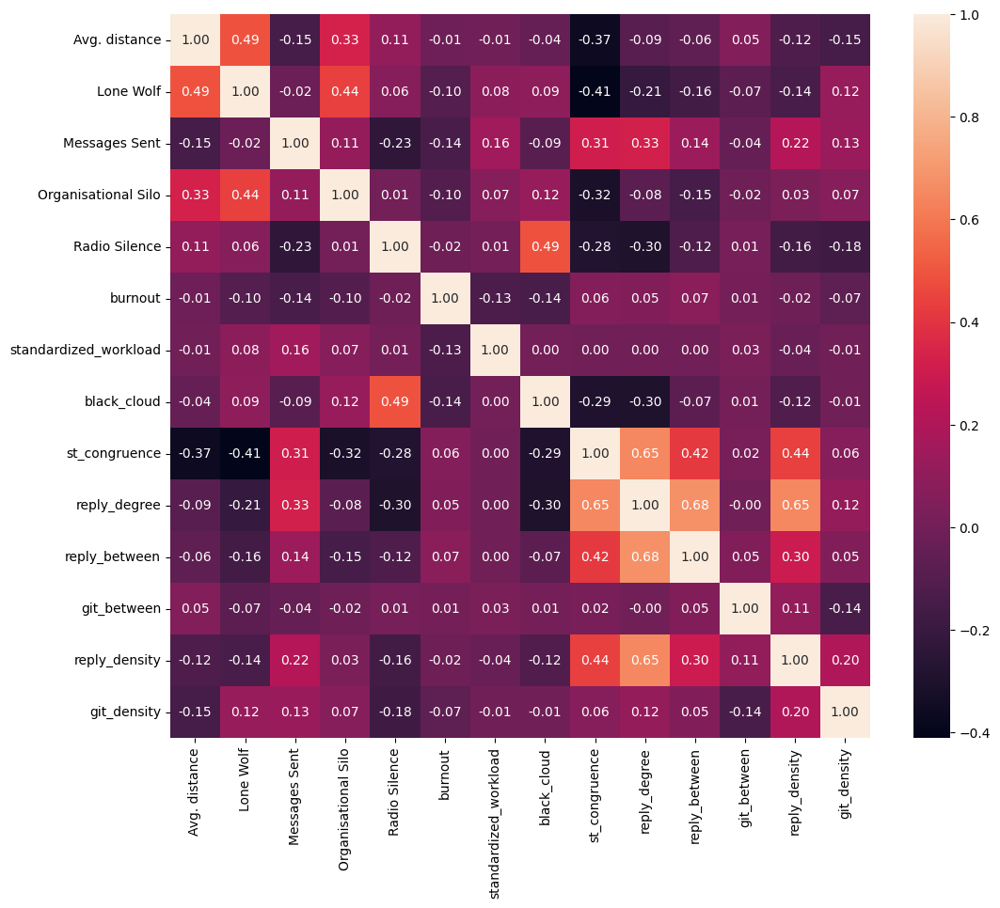

In [21]:
fig = plt.figure(figsize=(12,10))
ax= plt.subplot()
sns.heatmap(logistic_train_data.astype(float).corr(), annot=True, ax = ax, fmt = '.2f');
# fig.savefig('correlations_all.png')

In [22]:
lr_model = LogisticRegressionCV(max_iter = 1000000).fit(logistic_train_data.drop('burnout', axis = 1), logistic_train_data['burnout'])

Text(45.722222222222214, 0.5, 'True class')

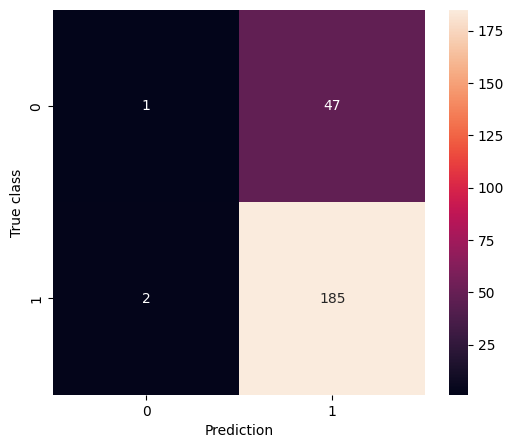

In [23]:
cm = confusion_matrix(logistic_test_data['burnout'], lr_model.predict(logistic_test_data.drop(['burnout'], axis = 1)))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

statsmodels

In [24]:
stat_model = sm.Logit(logistic_train_data['burnout'].astype(float), sm.add_constant(logistic_train_data.drop('burnout', axis = 1)).astype(float)).fit(disp = 0)
stat_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                burnout   No. Observations:                  940
Model:                          Logit   Df Residuals:                      926
Method:                           MLE   Df Model:                           13
Date:                Wed, 28 May 2025   Pseudo R-squ.:                 0.06651
Time:                        19:40:40   Log-Likelihood:                -444.22
converged:                       True   LL-Null:                       -475.87
Covariance Type:            nonrobust   LLR p-value:                 1.342e-08
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     2.3922      0.490      4.881      0.000       1.432       3.353
Avg. distance            -0.0208      0.102     -0.205      0.838      -0.220       0.179
Lone Wolf                -0.4977      0.363     -1.373      0.170      -1.208       0.213
Messages Sent            -0.0092      0.003     -3.307      0.001      -0.015      -0.004
Organisational Silo      -0.0947      0.202     -0.469      0.639      -0.490       0.301
Radio Silence             0.2578      0.237      1.087      0.277      -0.207       0.723
standardized_workload    -0.0733      0.026     -2.861      0.004      -0.124      -0.023
black_cloud              -0.8323      0.223     -3.739      0.000      -1.269      -0.396
st_congruence             0.2395      0.590      0.406      0.685      -0.916       1.395
reply_degree              0.1840      1.359      0.135      0.892      -2.480       2.848
reply_between             2.2456      1.442      1.558      0.119      -0.580       5.071
git_between              -0.0324      0.467     -0.069      0.945      -0.948       0.883
reply_density            -1.2028      1.193     -1.008      0.313      -3.541       1.135
git_density              -0.4182      0.368     -1.137      0.255      -1.139       0.303
=========================================================================================
"""

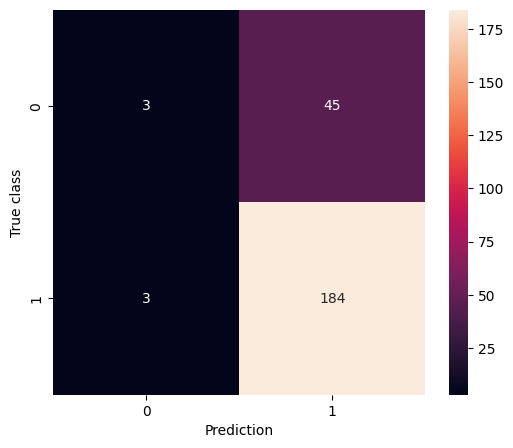

In [25]:
cm = confusion_matrix(logistic_test_data['burnout'], round(stat_model.predict(sm.add_constant(logistic_test_data.drop('burnout', axis = 1)).astype(float))).astype(int))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')
fig.savefig('results/all_data/burnout_unbal_LR.png')

### Burnout NB

In [6]:
message_data = all_test[['reply_body', 'burnout']].dropna()

nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

message_data['lemmas'] = message_data.reply_body.progress_apply(lambda x: [token.lemma_ for token in nlp(handle_negation(x)) if not token.is_stop and token.is_alpha])
message_data['burnout'] = message_data['burnout'].astype(bool)
message_data

100%|██████████| 11390/11390 [03:09<00:00, 60.21it/s] 


,reply_body,burnout,lemmas
255,"jetty, openejb, servicemix are all using it as...",True,"[jetty, openejb, servicemix, configuration, wa..."
257,+1 good,True,[good]
259,we were first voting to seethe servicemix wer...,True,"[vote, seethe, servicemix, willing, accept, gi..."
265,we kinda voted already on but changes so to c...,True,"[kinda, vote, change, clear, thing, open, arri..."
268,i have just applied 2 trivial bug fixes to the...,True,"[apply, trivial, bug, fix, xbean, spring, modu..."
...,...,...,...
79407,we had a metadata & we need a metadata manager...,True,"[metadata, need, metadata, manager, implementa..."
79415,"currently, due to the scan mechanism by garbag...",True,"[currently, scan, mechanism, garbage, thread, ..."
79426,per it would be better to mechanism currently ...,True,"[well, mechanism, currently, client, avoid]"
79440,currently we load all into memory when the top...,False,"[currently, load, memory, topic, load, subscri..."


In [7]:
message_data = message_data[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 0]

message_train, message_test = train_test_split(message_data, test_size=0.15, random_state=404, stratify = message_data['burnout'])
message_train, message_val = train_test_split(message_train, test_size=(0.15/0.85), random_state=404, stratify = message_train['burnout'])

print(f'length of train set: {len(message_train)}\nlength of validation set: {len(message_val)}\nlength of test set: {len(message_test)}')
message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages

# Oversample on the True cases in the train set
if 2*message_train["burnout"].sum()<len(message_train):
   # True is the minority class
    if 3*message_train["burnout"].sum()<len(message_train):
        # We need to over- and undersample to create balance
        message_train = pd.concat([message_train.loc[message_train[message_train['burnout']==1].index], message_train])
        print(f'Positive cases: {message_train["burnout"].sum()}')

        if 3*message_train["burnout"].sum()<len(message_train):
            # Check for massive imbalance
            message_train = pd.concat([message_train.loc[message_train[message_train['burnout']==1].index], message_train])
            print(f'Positive cases: {message_train["burnout"].sum()}')

        nMax = message_train["burnout"].sum()
        message_train = message_train.groupby('burnout').apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')
    else:
        nMax = message_train["burnout"].sum()
        # Only undersampling will do
        print(f'Positive cases: {message_train["burnout"].sum()}')
        message_train = message_train.groupby('burnout').apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')


else:
    if message_train["burnout"].sum()>0.67*len(message_train):
        # False is the minority class and we need to over- and undersample
        message_train = pd.concat([message_train.loc[message_train[message_train['burnout']==0].index], message_train])
        print(f'Positive cases: {message_train["burnout"].sum()}')

        if message_train["burnout"].sum()>0.67*len(message_train):
            # Check for massive imbalance (mainly ragequit case)
            message_train = pd.concat([message_train.loc[message_train[message_train['burnout']==0].index], message_train])
            print(f'Positive cases: {message_train["burnout"].sum()}')

        nMax = len(message_train) - message_train["burnout"].sum()
        message_train = message_train.groupby('burnout').apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

    else:
        nMax = len(message_train) - message_train["burnout"].sum()
        print(f'Positive cases: {message_train["burnout"].sum()}')
        message_train = message_train.groupby('burnout').apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

length of train set: 7714
length of validation set: 1654
length of test set: 1654
Positive cases: 3812
New length of train set: 7624


C:\Users\woute\AppData\Local\Temp\ipykernel_2648\1081622227.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages
C:\Users\woute\AppData\Local\Temp\ipykernel_2648\1081622227.py:23: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  message_train = message_train.groupby('burnout').apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)


In [15]:
pos_labels, pos_values = zip(*Counter(itertools.chain(*message_data[message_data['burnout']].lemmas.tolist())).items())
neg_labels, neg_values = zip(*Counter(itertools.chain(*message_data[~message_data['burnout']].lemmas.tolist())).items())

importance_df = pd.DataFrame(index = list(set(pos_labels + neg_labels)), data = {'pos_occur': pd.Series(pos_values, index = pos_labels), 'neg_occur': pd.Series(neg_values, index = neg_labels)})
importance_df.fillna(0, inplace = True)
importance_df['total_appearances'] = importance_df['pos_occur'] + importance_df['neg_occur']

for i in range(0,125,25):
    p = i
    importance_df['pos_importance'] = (importance_df['pos_occur'] + p)/(importance_df['total_appearances']+2*p)
    importance_df['neg_importance'] = (importance_df['neg_occur'] + p)/(importance_df['total_appearances']+2*p)
    print(f'positive {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'pos_importance', ascending = False)[['pos_importance', 'pos_occur', 'total_appearances']].head(20))
    print(f'negative {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'neg_importance', ascending = False)[['neg_importance', 'neg_occur', 'total_appearances']].head(20))
    print('----------------------------------------------------------------------------------------------------------------------------------------------')

positive 0:
             pos_importance  pos_occur  total_appearances
alert              0.922581      143.0              155.0
event              0.824074       89.0              108.0
invalid            0.809091       89.0              110.0
unable             0.642857      144.0              224.0
debug              0.592920       67.0              113.0
repository         0.550000      198.0              360.0
setup              0.548611       79.0              144.0
approach           0.528302       56.0              106.0
host               0.521073      136.0              261.0
pm                 0.490909       81.0              165.0
community          0.481481       78.0              162.0
folk               0.480769       75.0              156.0
control            0.475806       59.0              124.0
database           0.474576       56.0              118.0
recommend          0.464567       59.0              127.0
ambari             0.464363      215.0              463.0
tr

In [16]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = MultinomialNB()
classifier.fit(train_tf, message_train['burnout'])

classification_report(message_val['burnout'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.75      0.66      0.70      1148\n        True       0.40      0.51      0.45       506\n\n    accuracy                           0.61      1654\n   macro avg       0.57      0.58      0.57      1654\nweighted avg       0.64      0.61      0.62      1654\n'

Text(45.722222222222214, 0.5, 'True class')

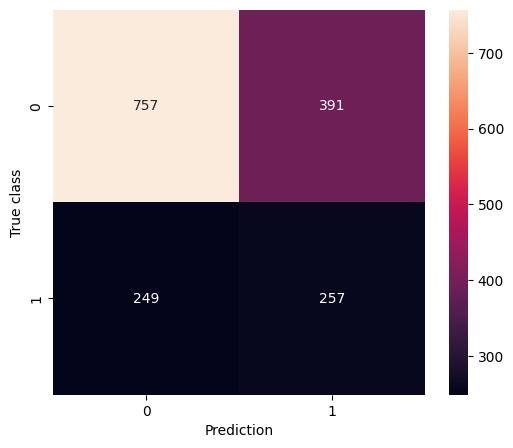

In [17]:
cm = confusion_matrix(message_val['burnout'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [18]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout'])

classification_report(message_val['burnout'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.71      0.61      0.66      1148\n        True       0.33      0.43      0.37       506\n\n    accuracy                           0.56      1654\n   macro avg       0.52      0.52      0.51      1654\nweighted avg       0.59      0.56      0.57      1654\n'

Text(45.722222222222214, 0.5, 'True class')

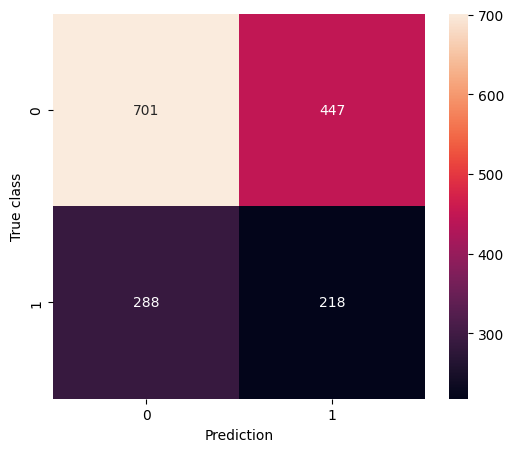

In [19]:
cm = confusion_matrix(message_val['burnout'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [9]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout'])

classification_report(message_val['burnout'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.72      0.60      0.65      1148\n        True       0.34      0.47      0.40       506\n\n    accuracy                           0.56      1654\n   macro avg       0.53      0.54      0.53      1654\nweighted avg       0.60      0.56      0.58      1654\n'

Text(45.722222222222214, 0.5, 'True class')

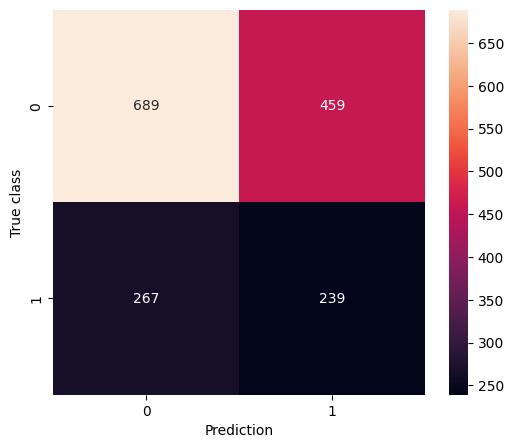

In [10]:
cm = confusion_matrix(message_val['burnout'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

# RF models

In [11]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(train_tf, message_train['burnout'])

classification_report(message_val['burnout'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.73      0.76      0.75      1148\n        True       0.40      0.36      0.38       506\n\n    accuracy                           0.64      1654\n   macro avg       0.57      0.56      0.56      1654\nweighted avg       0.63      0.64      0.64      1654\n'

Text(45.722222222222214, 0.5, 'True class')

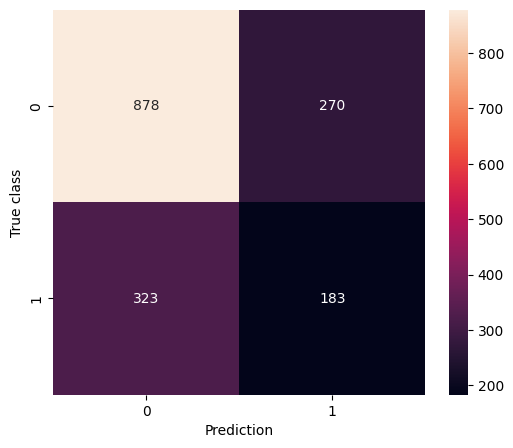

In [12]:
cm = confusion_matrix(message_val['burnout'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [13]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout'])

classification_report(message_val['burnout'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.71      0.90      0.80      1148\n        True       0.44      0.18      0.26       506\n\n    accuracy                           0.68      1654\n   macro avg       0.58      0.54      0.53      1654\nweighted avg       0.63      0.68      0.63      1654\n'

Text(45.722222222222214, 0.5, 'True class')

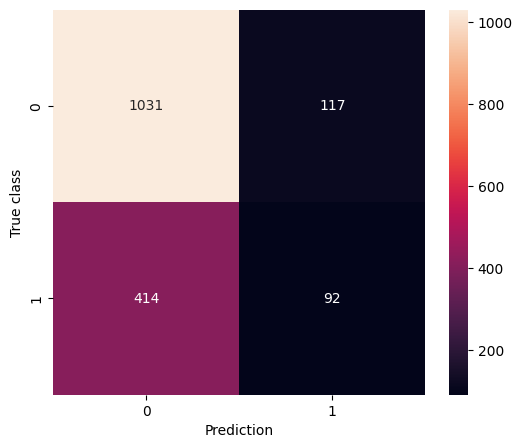

In [14]:
cm = confusion_matrix(message_val['burnout'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [15]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout'])

classification_report(message_val['burnout'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.71      0.96      0.81      1148\n        True       0.52      0.09      0.16       506\n\n    accuracy                           0.70      1654\n   macro avg       0.61      0.53      0.49      1654\nweighted avg       0.65      0.70      0.61      1654\n'

Text(45.722222222222214, 0.5, 'True class')

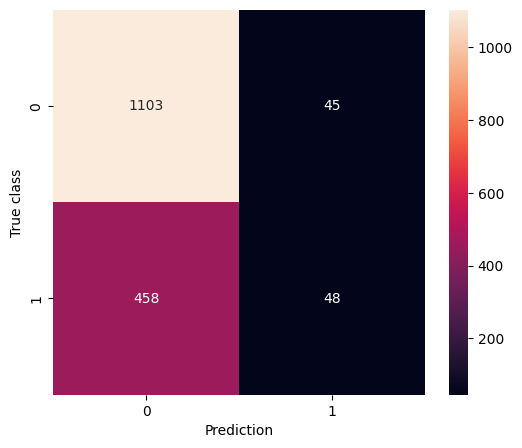

In [16]:
cm = confusion_matrix(message_val['burnout'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

# Ragequit - LR

sklearn

In [11]:
burnout_logistic_data = logistic_data[~logistic_data['ragequit_t+1'].isna()].drop(['burnout_t+1', 'burnout_t+3', 'burnout_t+12', 'burnout', 'ragequit_t+3', 'ragequit_t+12', 'git_close'], axis = 1).drop_duplicates().drop(['Alias', 'From', 'To', 'start_datetime', 'end_datetime', 'lagged_burnout', 'reply_close', 'working_months', 'quit', 'first_quit_month', 'git_degree', 'Workload'], axis = 1).dropna().astype({'ragequit_t+1':bool})
logistic_train_data, logistic_test_data = train_test_split(burnout_logistic_data, test_size = 0.2, random_state = 404, stratify = burnout_logistic_data['ragequit_t+1'])

In [12]:
burnout_logistic_data.describe(include = 'all')

,Avg. distance,Lone Wolf,Messages Sent,Organisational Silo,Radio Silence,standardized_workload,black_cloud,ragequit_t+1,st_congruence,reply_degree,reply_between,git_between,reply_density,git_density
count,1175.000000,1175,1175.000000,1175,1175,1175.000000,1175,1175,1175.000000,1175.000000,1175.000000,1175.000000,1175.000000,1175.000000
unique,NaN,2,NaN,2,2,NaN,2,2,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,True,NaN,True,True,NaN,False,False,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,1013,NaN,644,806,NaN,775,1155,NaN,NaN,NaN,NaN,NaN,NaN
mean,2.372213,NaN,24.728511,NaN,NaN,1.249753,NaN,NaN,0.318706,0.281946,0.097214,0.242035,0.120597,0.356925
std,1.115210,NaN,34.814872,NaN,NaN,3.039404,NaN,NaN,0.238606,0.137623,0.092267,0.181697,0.098327,0.236743
min,1.000000,NaN,1.000000,NaN,NaN,0.000069,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.022222
25%,1.571429,NaN,5.000000,NaN,NaN,0.045950,NaN,NaN,0.090909,0.157190,0.028998,0.117284,0.023860,0.166667
50%,2.000000,NaN,13.000000,NaN,NaN,0.270698,NaN,NaN,0.315789,0.320856,0.083791,0.198980,0.107590,0.320513
75%,3.000000,NaN,30.500000,NaN,NaN,1.078703,NaN,NaN,0.472953,0.381944,0.136480,0.333333,0.181818,0.500000


In [13]:
lr_model = LogisticRegressionCV(max_iter = 1000000).fit(logistic_train_data.drop('ragequit_t+1', axis = 1), logistic_train_data['ragequit_t+1'])

Text(45.722222222222214, 0.5, 'True class')

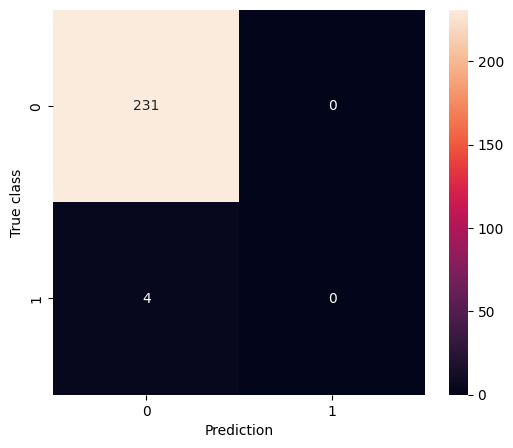

In [14]:
cm = confusion_matrix(logistic_test_data['ragequit_t+1'], lr_model.predict(logistic_test_data.drop('ragequit_t+1', axis = 1)))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

statsmodels

In [15]:
stat_model = sm.Logit(logistic_train_data['ragequit_t+1'].astype(float), sm.add_constant(logistic_train_data.drop('ragequit_t+1', axis = 1)).astype(float)).fit(disp = 0)
stat_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:           ragequit_t+1   No. Observations:                  940
Model:                          Logit   Df Residuals:                      926
Method:                           MLE   Df Model:                           13
Date:                Wed, 28 May 2025   Pseudo R-squ.:                 0.09173
Time:                        19:39:22   Log-Likelihood:                -73.603
converged:                       True   LL-Null:                       -81.036
Covariance Type:            nonrobust   LLR p-value:                    0.3158
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -3.8848      1.395     -2.785      0.005      -6.619      -1.150
Avg. distance            -0.5186      0.345     -1.505      0.132      -1.194       0.157
Lone Wolf                 0.7640      0.969      0.788      0.430      -1.135       2.663
Messages Sent            -0.0504      0.025     -1.995      0.046      -0.100      -0.001
Organisational Silo       0.4746      0.620      0.765      0.444      -0.741       1.690
Radio Silence             0.7899      0.703      1.124      0.261      -0.588       2.168
standardized_workload    -0.0169      0.095     -0.178      0.859      -0.203       0.169
black_cloud              -0.7239      0.650     -1.113      0.266      -1.999       0.551
st_congruence            -0.6539      1.630     -0.401      0.688      -3.849       2.541
reply_degree              2.5900      3.745      0.692      0.489      -4.750       9.930
reply_between             0.3706      3.778      0.098      0.922      -7.035       7.776
git_between               0.1180      1.476      0.080      0.936      -2.775       3.011
reply_density             2.9959      3.165      0.946      0.344      -3.208       9.200
git_density              -1.4773      1.390     -1.063      0.288      -4.202       1.247
=========================================================================================
"""

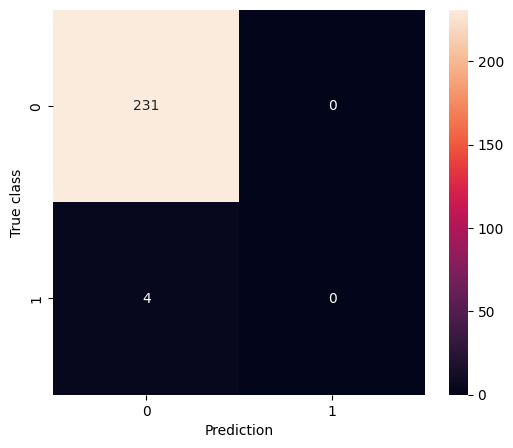

In [17]:
cm = confusion_matrix(logistic_test_data['ragequit_t+1'], round(stat_model.predict(sm.add_constant(logistic_test_data.drop('ragequit_t+1', axis = 1)).astype(float))).astype(int))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')
fig.savefig('results/all_data/ragequit_unbal_LR.png')

### Burnout NB

In [23]:
message_data = all_test[['reply_body', 'ragequit_t+1']].dropna()

nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

message_data['lemmas'] = message_data.reply_body.progress_apply(lambda x: [token.lemma_ for token in nlp(handle_negation(x)) if not token.is_stop and token.is_alpha])
message_data['ragequit_t+1'] = message_data['ragequit_t+1'].astype(bool)
message_data

100%|██████████| 34404/34404 [09:02<00:00, 63.44it/s] 


,reply_body,ragequit_t+1,lemmas
6,appliedcommitted,False,[appliedcommitte]
7,proxy server received an invalid response from...,False,"[proxy, server, receive, invalid, response, up..."
8,"we actually could use that, as we have a trad...",False,"[actually, use, trademark, asf, want, add, sur..."
10,my vote would be m5 so we out.,False,[vote]
11,that is the beautiful part of is not Positive...,False,"[beautiful, PositiveSentiment]"
...,...,...,...
79485,"currently, bookkeeper client still write ledge...",False,"[currently, bookkeeper, client, write, ledger,..."
79486,we changed ledgers to let consumed messages be...,False,"[change, ledger, let, consume, message, garbag..."
79487,if there are lots of pending topic we should h...,False,"[lot, pende, topic, hub, pende, request, acces..."
79488,currently use same ledger metadata during ledg...,False,"[currently, use, ledger, metadata, ledger, wri..."


In [24]:
message_data = message_data[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 0]

message_train, message_test = train_test_split(message_data, test_size=0.15, random_state=404, stratify = message_data['ragequit_t+1'])
message_train, message_val = train_test_split(message_train, test_size=(0.15/0.85), random_state=404, stratify = message_train['ragequit_t+1'])

print(f'length of train set: {len(message_train)}\nlength of validation set: {len(message_val)}\nlength of test set: {len(message_test)}')
message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages

# Oversample on the True cases in the train set
if 2*message_train["ragequit_t+1"].sum()<len(message_train):
   # True is the minority class
    if 3*message_train["ragequit_t+1"].sum()<len(message_train):
        # We need to over- and undersample to create balance
        message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+1"]==1].index], message_train])
        print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')

        if 3*message_train["ragequit_t+1"].sum()<len(message_train):
            # Check for massive imbalance
            message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+1"]==1].index], message_train])
            print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')

        nMax = message_train["ragequit_t+1"].sum()
        message_train = message_train.groupby("ragequit_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')
    else:
        nMax = message_train["ragequit_t+1"].sum()
        # Only undersampling will do
        print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')
        message_train = message_train.groupby("ragequit_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')


else:
    if message_train["ragequit_t+1"].sum()>0.67*len(message_train):
        # False is the minority class and we need to over- and undersample
        message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+1"]==0].index], message_train])
        print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')

        if message_train["ragequit_t+1"].sum()>0.67*len(message_train):
            # Check for massive imbalance (mainly ragequit case)
            message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+1"]==0].index], message_train])
            print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')

        nMax = len(message_train) - message_train["ragequit_t+1"].sum()
        message_train = message_train.groupby("ragequit_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

    else:
        nMax = len(message_train) - message_train["ragequit_t+1"].sum()
        print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')
        message_train = message_train.groupby("ragequit_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

length of train set: 23264
length of validation set: 4986
length of test set: 4986
Positive cases: 590
Positive cases: 1770
New length of train set: 3540


C:\Users\woute\AppData\Local\Temp\ipykernel_2648\1360335003.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages
C:\Users\woute\AppData\Local\Temp\ipykernel_2648\1360335003.py:23: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  message_train = message_train.groupby("ragequit_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)


In [25]:
pos_labels, pos_values = zip(*Counter(itertools.chain(*message_data[message_data['ragequit_t+1']].lemmas.tolist())).items())
neg_labels, neg_values = zip(*Counter(itertools.chain(*message_data[~message_data['ragequit_t+1']].lemmas.tolist())).items())

importance_df = pd.DataFrame(index = list(set(pos_labels + neg_labels)), data = {'pos_occur': pd.Series(pos_values, index = pos_labels), 'neg_occur': pd.Series(neg_values, index = neg_labels)})
importance_df.fillna(0, inplace = True)
importance_df['total_appearances'] = importance_df['pos_occur'] + importance_df['neg_occur']

for i in range(0,125,25):
    p = i
    importance_df['pos_importance'] = (importance_df['pos_occur'] + p)/(importance_df['total_appearances']+2*p)
    importance_df['neg_importance'] = (importance_df['neg_occur'] + p)/(importance_df['total_appearances']+2*p)
    print(f'positive {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'pos_importance', ascending = False)[['pos_importance', 'pos_occur', 'total_appearances']].head(20))
    print(f'negative {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'neg_importance', ascending = False)[['neg_importance', 'neg_occur', 'total_appearances']].head(20))
    print('----------------------------------------------------------------------------------------------------------------------------------------------')

positive 0:
                     pos_importance  pos_occur  total_appearances
checkingtask               1.000000      167.0              167.0
startmbeaninstance         1.000000      107.0              107.0
deploymentplan             1.000000      475.0              475.0
deploygeronimombean        1.000000      163.0              163.0
geronimombean              0.948454      184.0              194.0
trace                      0.792115      663.0              837.0
role                       0.581236      254.0              437.0
answer                     0.483240      173.0              358.0
perform                    0.397759      142.0              357.0
java                       0.367465      890.0             2422.0
parse                      0.356164       78.0              219.0
task                       0.325263      309.0              950.0
c                          0.318681      203.0              637.0
true                       0.293515      172.0              586.

In [26]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = MultinomialNB()
classifier.fit(train_tf, message_train['ragequit_t+1'])

classification_report(message_val['ragequit_t+1'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.99      0.80      0.89      4904\n        True       0.05      0.60      0.09        82\n\n    accuracy                           0.80      4986\n   macro avg       0.52      0.70      0.49      4986\nweighted avg       0.98      0.80      0.87      4986\n'

Text(45.722222222222214, 0.5, 'True class')

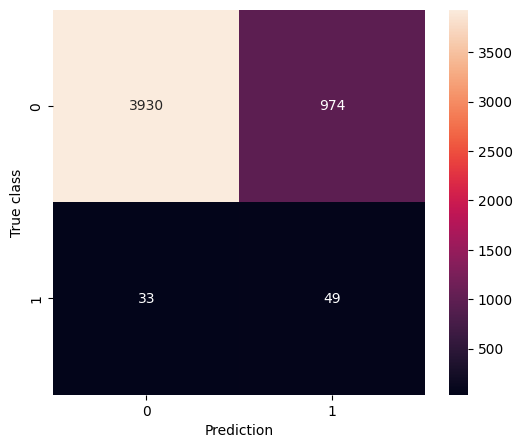

In [27]:
cm = confusion_matrix(message_val['ragequit_t+1'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [28]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_train.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+1'])

classification_report(message_val['ragequit_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.99      0.68      0.80      4904\n        True       0.03      0.59      0.06        82\n\n    accuracy                           0.67      4986\n   macro avg       0.51      0.63      0.43      4986\nweighted avg       0.97      0.67      0.79      4986\n'

Text(45.722222222222214, 0.5, 'True class')

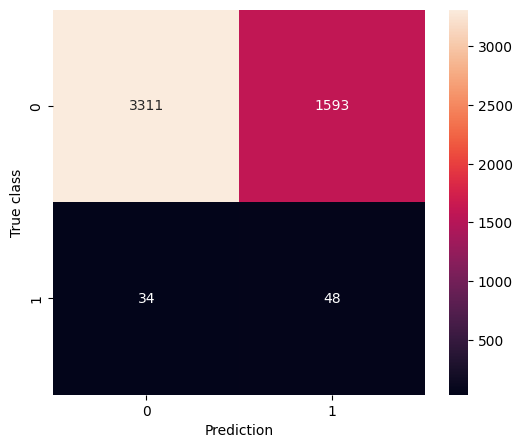

In [29]:
cm = confusion_matrix(message_val['ragequit_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [30]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+1'])

classification_report(message_val['ragequit_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.99      0.64      0.78      4904\n        True       0.03      0.61      0.05        82\n\n    accuracy                           0.64      4986\n   macro avg       0.51      0.63      0.42      4986\nweighted avg       0.97      0.64      0.77      4986\n'

Text(45.722222222222214, 0.5, 'True class')

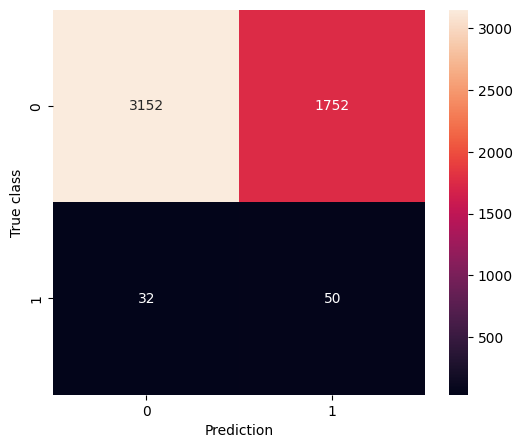

In [31]:
cm = confusion_matrix(message_val['ragequit_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

# RF models

In [32]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(train_tf, message_train['ragequit_t+1'])

classification_report(message_val['ragequit_t+1'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.99      0.98      0.99      4904\n        True       0.21      0.29      0.25        82\n\n    accuracy                           0.97      4986\n   macro avg       0.60      0.64      0.62      4986\nweighted avg       0.98      0.97      0.97      4986\n'

Text(45.722222222222214, 0.5, 'True class')

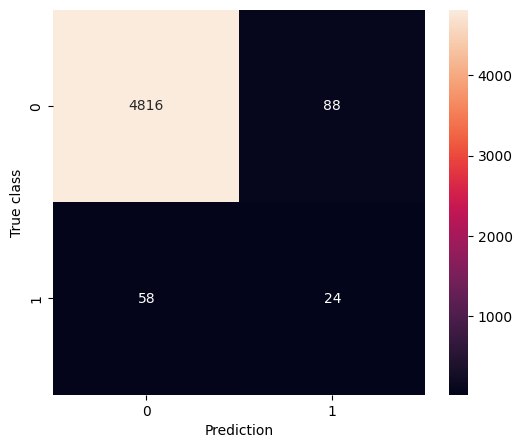

In [33]:
cm = confusion_matrix(message_val['ragequit_t+1'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [34]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_train.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+1'])

classification_report(message_val['ragequit_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.99      0.98      0.99      4904\n        True       0.16      0.17      0.16        82\n\n    accuracy                           0.97      4986\n   macro avg       0.57      0.58      0.57      4986\nweighted avg       0.97      0.97      0.97      4986\n'

Text(45.722222222222214, 0.5, 'True class')

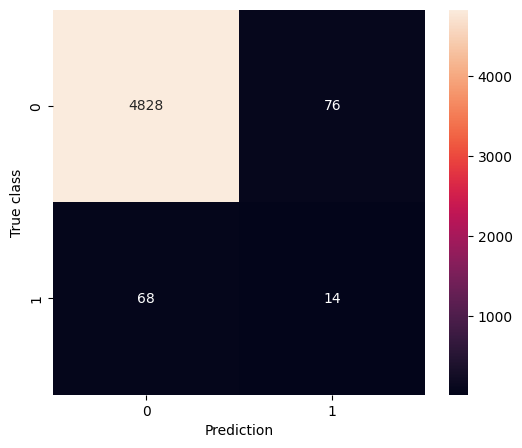

In [35]:
cm = confusion_matrix(message_val['ragequit_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [36]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+1'])

classification_report(message_val['ragequit_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.99      1.00      0.99      4904\n        True       0.42      0.10      0.16        82\n\n    accuracy                           0.98      4986\n   macro avg       0.70      0.55      0.57      4986\nweighted avg       0.98      0.98      0.98      4986\n'

Text(45.722222222222214, 0.5, 'True class')

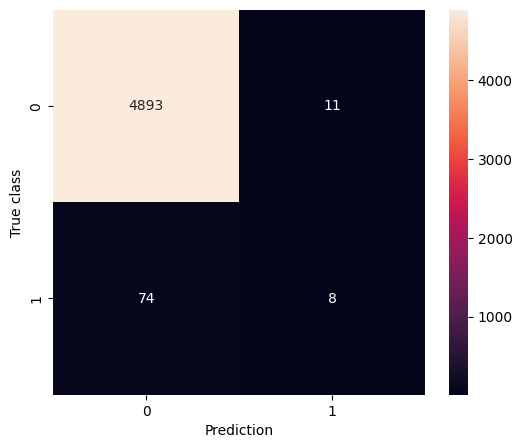

In [37]:
cm = confusion_matrix(message_val['ragequit_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

# Lagged variables

## Burnout t+1

In [26]:
burnout_logistic_data = logistic_data[~logistic_data.burnout.isna()].drop(['burnout', 'burnout_t+3', 'burnout_t+12', 'ragequit_t+1', 'ragequit_t+3', 'ragequit_t+12', 'git_close'], axis = 1).drop_duplicates().drop(['Alias', 'From', 'To', 'start_datetime', 'end_datetime', 'lagged_burnout', 'reply_close', 'working_months', 'quit', 'first_quit_month', 'git_degree', 'Workload'], axis = 1).dropna().astype({'burnout_t+1':bool})
logistic_train_data, logistic_test_data = train_test_split(burnout_logistic_data, test_size = 0.2, random_state = 404, stratify = burnout_logistic_data['burnout_t+1'])

In [27]:
lr_model = LogisticRegressionCV(max_iter = 1000000).fit(logistic_train_data.drop('burnout_t+1', axis = 1), logistic_train_data['burnout_t+1'])

Text(45.722222222222214, 0.5, 'True class')

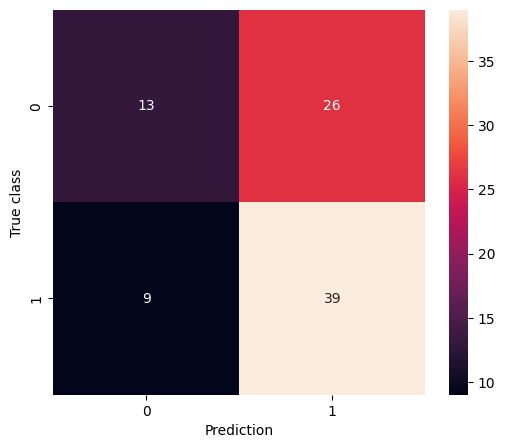

In [28]:
cm = confusion_matrix(logistic_test_data['burnout_t+1'], lr_model.predict(logistic_test_data.drop('burnout_t+1', axis = 1)))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

statsmodels

In [29]:
stat_model = sm.Logit(logistic_train_data['burnout_t+1'].astype(float), sm.add_constant(logistic_train_data.drop('burnout_t+1', axis = 1)).astype(float)).fit(disp = 0)
stat_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:            burnout_t+1   No. Observations:                  345
Model:                          Logit   Df Residuals:                      331
Method:                           MLE   Df Model:                           13
Date:                Wed, 28 May 2025   Pseudo R-squ.:                 0.05206
Time:                        19:41:05   Log-Likelihood:                -225.00
converged:                       True   LL-Null:                       -237.36
Covariance Type:            nonrobust   LLR p-value:                   0.02515
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     1.6511      0.695      2.375      0.018       0.288       3.014
Avg. distance            -0.0193      0.131     -0.147      0.883      -0.276       0.237
Lone Wolf                -1.1268      0.552     -2.040      0.041      -2.210      -0.044
Messages Sent            -0.0011      0.004     -0.298      0.766      -0.009       0.006
Organisational Silo      -0.0632      0.275     -0.230      0.818      -0.601       0.475
Radio Silence            -0.5516      0.325     -1.697      0.090      -1.188       0.085
standardized_workload    -0.1049      0.052     -2.031      0.042      -0.206      -0.004
black_cloud               0.4958      0.315      1.576      0.115      -0.121       1.112
st_congruence            -0.2398      0.858     -0.279      0.780      -1.922       1.443
reply_degree              1.4657      1.987      0.737      0.461      -2.430       5.361
reply_between            -5.6127      2.248     -2.497      0.013     -10.018      -1.207
git_between               0.6076      0.708      0.859      0.391      -0.780       1.995
reply_density            -0.7621      1.848     -0.412      0.680      -4.384       2.859
git_density               0.1928      0.533      0.362      0.718      -0.852       1.237
=========================================================================================
"""

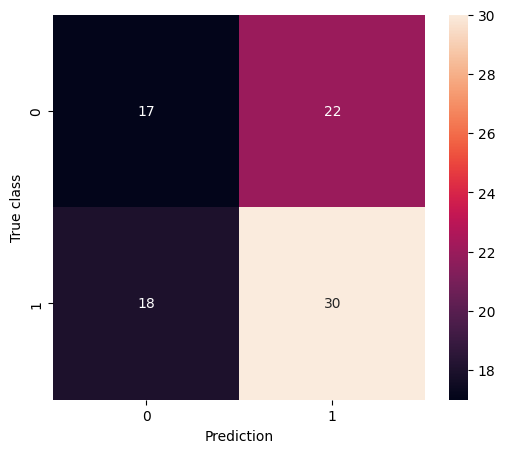

In [30]:
cm = confusion_matrix(logistic_test_data['burnout_t+1'], round(stat_model.predict(sm.add_constant(logistic_test_data.drop('burnout_t+1', axis = 1)).astype(float))).astype(int))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')
fig.savefig('results/all_data/burnout+1_unbal_LR.png')

### Burnout NB

In [43]:
message_data = all_test[['reply_body', 'burnout_t+1']].dropna()

nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

message_data['lemmas'] = message_data.reply_body.progress_apply(lambda x: [token.lemma_ for token in nlp(handle_negation(x)) if not token.is_stop and token.is_alpha])
message_data['burnout_t+1'] = message_data['burnout_t+1'].astype(bool)
message_data

100%|██████████| 12573/12573 [03:38<00:00, 57.54it/s] 


,reply_body,burnout_t+1,lemmas
255,"jetty, openejb, servicemix are all using it as...",True,"[jetty, openejb, servicemix, configuration, wa..."
256,+1,True,[]
257,+1 good,True,[good]
259,we were first voting to seethe servicemix wer...,True,"[vote, seethe, servicemix, willing, accept, gi..."
265,we kinda voted already on but changes so to c...,True,"[kinda, vote, change, clear, thing, open, arri..."
...,...,...,...
79415,"currently, due to the scan mechanism by garbag...",True,"[currently, scan, mechanism, garbage, thread, ..."
79426,per it would be better to mechanism currently ...,True,"[well, mechanism, currently, client, avoid]"
79440,currently we load all into memory when the top...,False,"[currently, load, memory, topic, load, subscri..."
79446,need a based active ledger server.,True,"[need, base, active, ledger, server]"


In [44]:
message_data = message_data[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 0]

message_train, message_test = train_test_split(message_data, test_size=0.15, random_state=404, stratify = message_data['burnout_t+1'])
message_train, message_val = train_test_split(message_train, test_size=(0.15/0.85), random_state=404, stratify = message_train['burnout_t+1'])

print(f'length of train set: {len(message_train)}\nlength of validation set: {len(message_val)}\nlength of test set: {len(message_test)}')
message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages

# Oversample on the True cases in the train set
if 2*message_train["burnout_t+1"].sum()<len(message_train):
   # True is the minority class
    if 3*message_train["burnout_t+1"].sum()<len(message_train):
        # We need to over- and undersample to create balance
        message_train = pd.concat([message_train.loc[message_train[message_train['burnout_t+1']==1].index], message_train])
        print(f'Positive cases: {message_train["burnout_t+1"].sum()}')

        if 3*message_train["burnout_t+1"].sum()<len(message_train):
            # Check for massive imbalance
            message_train = pd.concat([message_train.loc[message_train[message_train["burnout_t+1"]==1].index], message_train])
            print(f'Positive cases: {message_train["burnout_t+1"].sum()}')

        nMax = message_train["burnout_t+1"].sum()
        message_train = message_train.groupby("burnout_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')
    else:
        nMax = message_train["burnout_t+1"].sum()
        # Only undersampling will do
        print(f'Positive cases: {message_train["burnout_t+1"].sum()}')
        message_train = message_train.groupby("burnout_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')


else:
    if message_train["burnout_t+1"].sum()>0.67*len(message_train):
        # False is the minority class and we need to over- and undersample
        message_train = pd.concat([message_train.loc[message_train[message_train["burnout_t+1"]==0].index], message_train])
        print(f'Positive cases: {message_train["burnout_t+1"].sum()}')

        if message_train["burnout_t+1"].sum()>0.67*len(message_train):
            # Check for massive imbalance (mainly ragequit case)
            message_train = pd.concat([message_train.loc[message_train[message_train["burnout_t+1"]==0].index], message_train])
            print(f'Positive cases: {message_train["burnout_t+1"].sum()}')

        nMax = len(message_train) - message_train["burnout_t+1"].sum()
        message_train = message_train.groupby("burnout_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

    else:
        nMax = len(message_train) - message_train["burnout_t+1"].sum()
        print(f'Positive cases: {message_train["burnout_t+1"].sum()}')
        message_train = message_train.groupby("burnout_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

length of train set: 8519
length of validation set: 1826
length of test set: 1826
Positive cases: 3486
New length of train set: 6766


C:\Users\woute\AppData\Local\Temp\ipykernel_2648\995443566.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages
C:\Users\woute\AppData\Local\Temp\ipykernel_2648\995443566.py:54: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  message_train = message_train.groupby("burnout_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)


In [45]:
pos_labels, pos_values = zip(*Counter(itertools.chain(*message_data[message_data['burnout_t+1']].lemmas.tolist())).items())
neg_labels, neg_values = zip(*Counter(itertools.chain(*message_data[~message_data['burnout_t+1']].lemmas.tolist())).items())

importance_df = pd.DataFrame(index = list(set(pos_labels + neg_labels)), data = {'pos_occur': pd.Series(pos_values, index = pos_labels), 'neg_occur': pd.Series(neg_values, index = neg_labels)})
importance_df.fillna(0, inplace = True)
importance_df['total_appearances'] = importance_df['pos_occur'] + importance_df['neg_occur']

for i in range(0,125,25):
    p = i
    importance_df['pos_importance'] = (importance_df['pos_occur'] + p)/(importance_df['total_appearances']+2*p)
    importance_df['neg_importance'] = (importance_df['neg_occur'] + p)/(importance_df['total_appearances']+2*p)
    print(f'positive {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'pos_importance', ascending = False)[['pos_importance', 'pos_occur', 'total_appearances']].head(20))
    print(f'negative {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'neg_importance', ascending = False)[['neg_importance', 'neg_occur', 'total_appearances']].head(20))
    print('----------------------------------------------------------------------------------------------------------------------------------------------')

positive 0:
             pos_importance  pos_occur  total_appearances
alert              0.936709      148.0              158.0
invalid            0.894737      102.0              114.0
event              0.864000      108.0              125.0
table              0.796296       86.0              108.0
mar                0.758333       91.0              120.0
tck                0.750000       81.0              108.0
approach           0.731092       87.0              119.0
na                 0.720721       80.0              111.0
unable             0.718615      166.0              231.0
debug              0.717949       84.0              117.0
ambari             0.710443      449.0              632.0
entry              0.706422       77.0              109.0
compile            0.697987      104.0              149.0
completely         0.694444       75.0              108.0
folk               0.690476      116.0              168.0
transaction        0.681529      107.0              157.0
ex

In [46]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = MultinomialNB()
classifier.fit(train_tf, message_train['burnout_t+1'])

classification_report(message_val['burnout_t+1'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.55      0.58      0.56       907\n        True       0.56      0.54      0.55       919\n\n    accuracy                           0.56      1826\n   macro avg       0.56      0.56      0.56      1826\nweighted avg       0.56      0.56      0.56      1826\n'

Text(45.722222222222214, 0.5, 'True class')

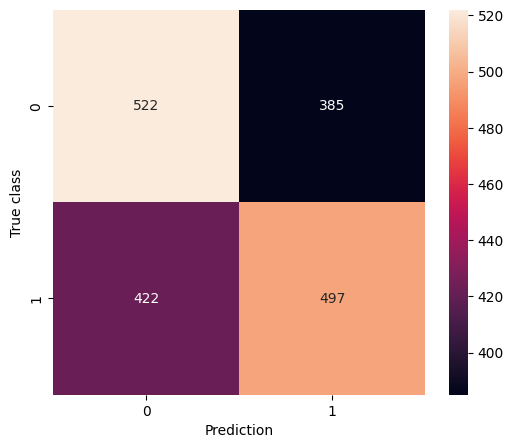

In [47]:
cm = confusion_matrix(message_val['burnout_t+1'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [48]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+1'])

classification_report(message_val['burnout_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.52      0.60      0.56       907\n        True       0.54      0.46      0.50       919\n\n    accuracy                           0.53      1826\n   macro avg       0.53      0.53      0.53      1826\nweighted avg       0.53      0.53      0.53      1826\n'

Text(45.722222222222214, 0.5, 'True class')

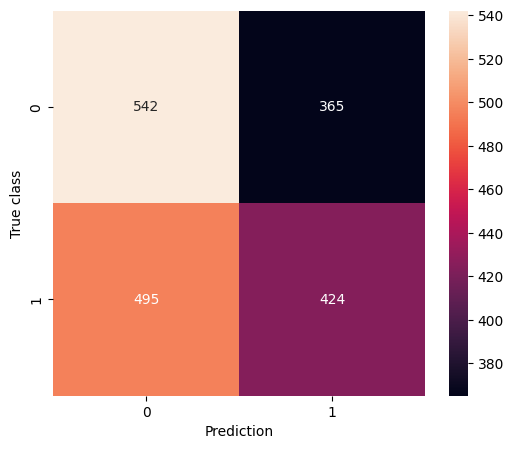

In [49]:
cm = confusion_matrix(message_val['burnout_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [50]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+1'])

classification_report(message_val['burnout_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.51      0.51      0.51       907\n        True       0.52      0.53      0.52       919\n\n    accuracy                           0.52      1826\n   macro avg       0.52      0.52      0.52      1826\nweighted avg       0.52      0.52      0.52      1826\n'

Text(45.722222222222214, 0.5, 'True class')

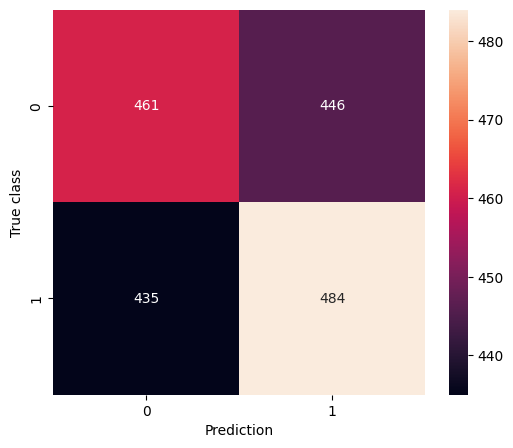

In [51]:
cm = confusion_matrix(message_val['burnout_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

# RF models

In [52]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(train_tf, message_train['burnout_t+1'])

classification_report(message_val['burnout_t+1'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.57      0.52      0.55       907\n        True       0.56      0.61      0.59       919\n\n    accuracy                           0.57      1826\n   macro avg       0.57      0.57      0.57      1826\nweighted avg       0.57      0.57      0.57      1826\n'

Text(45.722222222222214, 0.5, 'True class')

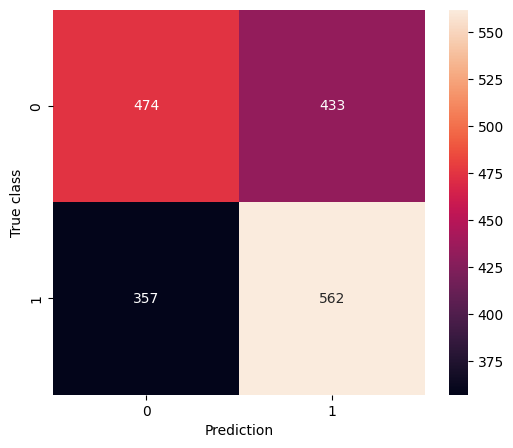

In [53]:
cm = confusion_matrix(message_val['burnout_t+1'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [54]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+1'])

classification_report(message_val['burnout_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.55      0.54      0.55       907\n        True       0.55      0.56      0.56       919\n\n    accuracy                           0.55      1826\n   macro avg       0.55      0.55      0.55      1826\nweighted avg       0.55      0.55      0.55      1826\n'

Text(45.722222222222214, 0.5, 'True class')

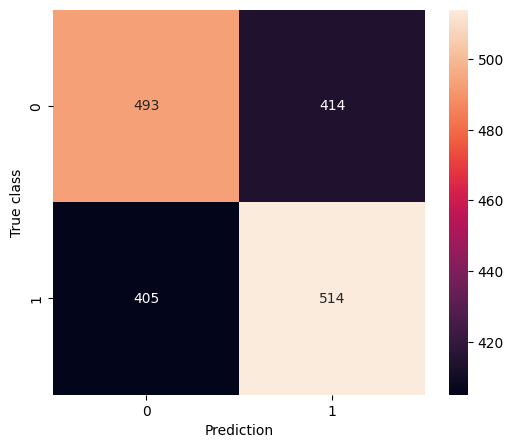

In [55]:
cm = confusion_matrix(message_val['burnout_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [56]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+1'])

classification_report(message_val['burnout_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.55      0.53      0.54       907\n        True       0.55      0.57      0.56       919\n\n    accuracy                           0.55      1826\n   macro avg       0.55      0.55      0.55      1826\nweighted avg       0.55      0.55      0.55      1826\n'

Text(45.722222222222214, 0.5, 'True class')

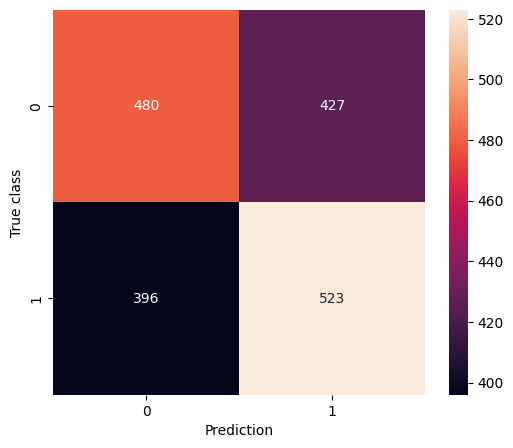

In [57]:
cm = confusion_matrix(message_val['burnout_t+1'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

## Burnout_t+3

In [31]:
burnout_logistic_data = logistic_data[~logistic_data.burnout.isna()].drop(['burnout_t+1', 'burnout', 'burnout_t+12', 'ragequit_t+1', 'ragequit_t+3', 'ragequit_t+12', 'git_close'], axis = 1).drop_duplicates().drop(['Alias', 'From', 'To', 'start_datetime', 'end_datetime', 'lagged_burnout', 'reply_close', 'working_months', 'quit', 'first_quit_month', 'git_degree', 'Workload'], axis = 1).dropna().astype({'burnout_t+3':bool})
logistic_train_data, logistic_test_data = train_test_split(burnout_logistic_data, test_size = 0.2, random_state = 404, stratify = burnout_logistic_data['burnout_t+3'])

In [32]:
lr_model = LogisticRegressionCV(max_iter = 1000000).fit(logistic_train_data.drop('burnout_t+3', axis = 1), logistic_train_data['burnout_t+3'])

Text(45.722222222222214, 0.5, 'True class')

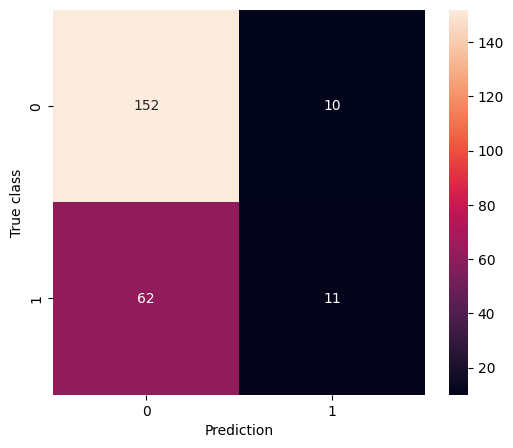

In [33]:
cm = confusion_matrix(logistic_test_data['burnout_t+3'], lr_model.predict(logistic_test_data.drop('burnout_t+3', axis = 1)))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

statsmodels

In [34]:
stat_model = sm.Logit(logistic_train_data['burnout_t+3'].astype(float), sm.add_constant(logistic_train_data.drop('burnout_t+3', axis = 1)).astype(float)).fit(disp = 0)
stat_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:            burnout_t+3   No. Observations:                  940
Model:                          Logit   Df Residuals:                      926
Method:                           MLE   Df Model:                           13
Date:                Wed, 28 May 2025   Pseudo R-squ.:                 0.06390
Time:                        19:41:36   Log-Likelihood:                -545.96
converged:                       True   LL-Null:                       -583.23
Covariance Type:            nonrobust   LLR p-value:                 1.164e-10
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.8693      0.406     -2.140      0.032      -1.665      -0.073
Avg. distance             0.0550      0.087      0.636      0.525      -0.115       0.225
Lone Wolf                -0.0375      0.294     -0.128      0.898      -0.613       0.538
Messages Sent             0.0051      0.002      2.261      0.024       0.001       0.009
Organisational Silo       0.2221      0.178      1.249      0.212      -0.126       0.571
Radio Silence            -0.4379      0.201     -2.183      0.029      -0.831      -0.045
standardized_workload     0.0307      0.023      1.339      0.181      -0.014       0.076
black_cloud               0.7311      0.191      3.829      0.000       0.357       1.105
st_congruence             0.2666      0.485      0.550      0.582      -0.684       1.217
reply_degree             -2.3511      1.169     -2.011      0.044      -4.643      -0.059
reply_between            -2.9071      1.282     -2.267      0.023      -5.420      -0.394
git_between               0.8916      0.425      2.098      0.036       0.059       1.724
reply_density             0.9662      1.031      0.937      0.349      -1.055       2.987
git_density               0.5789      0.340      1.700      0.089      -0.088       1.246
=========================================================================================
"""

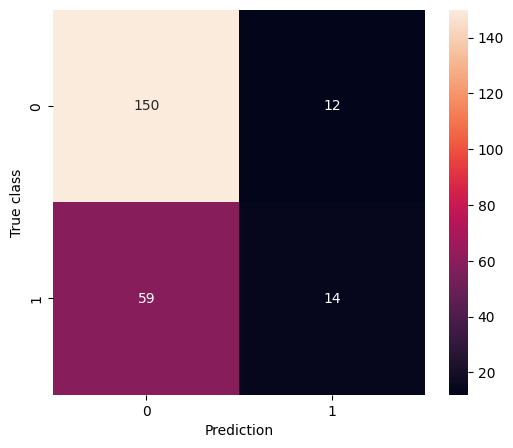

In [35]:
cm = confusion_matrix(logistic_test_data['burnout_t+3'], round(stat_model.predict(sm.add_constant(logistic_test_data.drop('burnout_t+3', axis = 1)).astype(float))).astype(int))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')
fig.savefig('results/all_data/burnout+3_unbal_LR.png')

### Burnout NB

In [63]:
message_data = all_test[['reply_body', 'burnout_t+3']].dropna()

nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

message_data['lemmas'] = message_data.reply_body.progress_apply(lambda x: [token.lemma_ for token in nlp(handle_negation(x)) if not token.is_stop and token.is_alpha])
message_data['burnout_t+3'] = message_data['burnout_t+3'].astype(bool)
message_data

100%|██████████| 34404/34404 [10:27<00:00, 54.82it/s] 


,reply_body,burnout_t+3,lemmas
6,appliedcommitted,False,[appliedcommitte]
7,proxy server received an invalid response from...,False,"[proxy, server, receive, invalid, response, up..."
8,"we actually could use that, as we have a trad...",False,"[actually, use, trademark, asf, want, add, sur..."
10,my vote would be m5 so we out.,False,[vote]
11,that is the beautiful part of is not Positive...,False,"[beautiful, PositiveSentiment]"
...,...,...,...
79485,"currently, bookkeeper client still write ledge...",False,"[currently, bookkeeper, client, write, ledger,..."
79486,we changed ledgers to let consumed messages be...,False,"[change, ledger, let, consume, message, garbag..."
79487,if there are lots of pending topic we should h...,False,"[lot, pende, topic, hub, pende, request, acces..."
79488,currently use same ledger metadata during ledg...,False,"[currently, use, ledger, metadata, ledger, wri..."


In [64]:
message_data = message_data[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 0]

message_train, message_test = train_test_split(message_data, test_size=0.15, random_state=404, stratify = message_data['burnout_t+3'])
message_train, message_val = train_test_split(message_train, test_size=(0.15/0.85), random_state=404, stratify = message_train['burnout_t+3'])

print(f'length of train set: {len(message_train)}\nlength of validation set: {len(message_val)}\nlength of test set: {len(message_test)}')
message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages

# Oversample on the True cases in the train set
if 2*message_train["burnout_t+3"].sum()<len(message_train):
   # True is the minority class
    if 3*message_train["burnout_t+3"].sum()<len(message_train):
        # We need to over- and undersample to create balance
        message_train = pd.concat([message_train.loc[message_train[message_train["burnout_t+3"]==1].index], message_train])
        print(f'Positive cases: {message_train["burnout_t+3"].sum()}')

        if 3*message_train["burnout_t+3"].sum()<len(message_train):
            # Check for massive imbalance
            message_train = pd.concat([message_train.loc[message_train[message_train["burnout_t+3"]==1].index], message_train])
            print(f'Positive cases: {message_train["burnout_t+3"].sum()}')

        nMax = message_train["burnout_t+3"].sum()
        message_train = message_train.groupby("burnout_t+3").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')
    else:
        nMax = message_train["burnout_t+3"].sum()
        # Only undersampling will do
        print(f'Positive cases: {message_train["burnout_t+3"].sum()}')
        message_train = message_train.groupby("burnout_t+3").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')


else:
    if message_train["burnout_t+3"].sum()>0.67*len(message_train):
        # False is the minority class and we need to over- and undersample
        message_train = pd.concat([message_train.loc[message_train[message_train["burnout_t+3"]==0].index], message_train])
        print(f'Positive cases: {message_train["burnout_t+3"].sum()}')

        if message_train["burnout_t+3"].sum()>0.67*len(message_train):
            # Check for massive imbalance (mainly ragequit case)
            message_train = pd.concat([message_train.loc[message_train[message_train["burnout_t+3"]==0].index], message_train])
            print(f'Positive cases: {message_train["burnout_t+3"].sum()}')

        nMax = len(message_train) - message_train["burnout_t+3"].sum()
        message_train = message_train.groupby("burnout_t+3").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

    else:
        nMax = len(message_train) - message_train["burnout_t+3"].sum()
        print(f'Positive cases: {message_train["burnout_t+3"].sum()}')
        message_train = message_train.groupby("burnout_t+3").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

length of train set: 23264
length of validation set: 4986
length of test set: 4986
Positive cases: 11234
New length of train set: 22468


C:\Users\woute\AppData\Local\Temp\ipykernel_2648\1913014158.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages
C:\Users\woute\AppData\Local\Temp\ipykernel_2648\1913014158.py:23: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  message_train = message_train.groupby("burnout_t+3").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)


In [65]:
pos_labels, pos_values = zip(*Counter(itertools.chain(*message_data[message_data['burnout_t+3']].lemmas.tolist())).items())
neg_labels, neg_values = zip(*Counter(itertools.chain(*message_data[~message_data['burnout_t+3']].lemmas.tolist())).items())

importance_df = pd.DataFrame(index = list(set(pos_labels + neg_labels)), data = {'pos_occur': pd.Series(pos_values, index = pos_labels), 'neg_occur': pd.Series(neg_values, index = neg_labels)})
importance_df.fillna(0, inplace = True)
importance_df['total_appearances'] = importance_df['pos_occur'] + importance_df['neg_occur']

for i in range(0,125,25):
    p = i
    importance_df['pos_importance'] = (importance_df['pos_occur'] + p)/(importance_df['total_appearances']+2*p)
    importance_df['neg_importance'] = (importance_df['neg_occur'] + p)/(importance_df['total_appearances']+2*p)
    print(f'positive {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'pos_importance', ascending = False)[['pos_importance', 'pos_occur', 'total_appearances']].head(20))
    print(f'negative {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'neg_importance', ascending = False)[['neg_importance', 'neg_occur', 'total_appearances']].head(20))
    print('----------------------------------------------------------------------------------------------------------------------------------------------')

positive 0:
            pos_importance  pos_occur  total_appearances
src               0.778465      629.0              808.0
na                0.777778      105.0              135.0
alert             0.766169      154.0              201.0
jenck             0.716930     1588.0             2215.0
trunk             0.687873      692.0             1006.0
webapp            0.675958      194.0              287.0
standard          0.638325      503.0              788.0
dec               0.626667       94.0              150.0
org               0.610959      223.0              365.0
ws                0.594595       66.0              111.0
adapter           0.593220       70.0              118.0
revision          0.582192      255.0              438.0
david             0.572451      320.0              559.0
codehaus          0.556291       84.0              151.0
rebalancer        0.551724      144.0              261.0
invalid           0.548077      114.0              208.0
supply            0

In [66]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = MultinomialNB()
classifier.fit(train_tf, message_train['burnout_t+3'])

classification_report(message_val['burnout_t+3'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.82      0.64      0.72      3494\n        True       0.44      0.66      0.53      1492\n\n    accuracy                           0.65      4986\n   macro avg       0.63      0.65      0.62      4986\nweighted avg       0.70      0.65      0.66      4986\n'

Text(45.722222222222214, 0.5, 'True class')

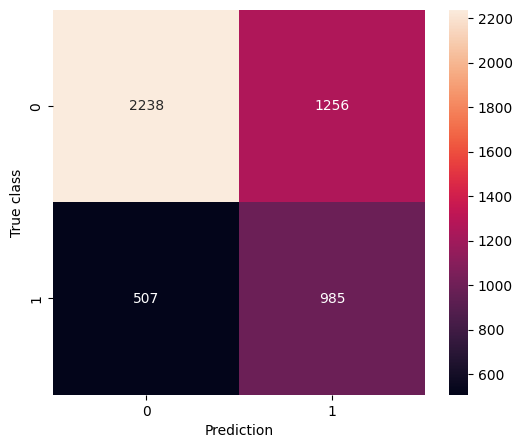

In [67]:
cm = confusion_matrix(message_val['burnout_t+3'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [68]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+3'])

classification_report(message_val['burnout_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.77      0.52      0.62      3494\n        True       0.36      0.63      0.46      1492\n\n    accuracy                           0.55      4986\n   macro avg       0.56      0.57      0.54      4986\nweighted avg       0.64      0.55      0.57      4986\n'

Text(45.722222222222214, 0.5, 'True class')

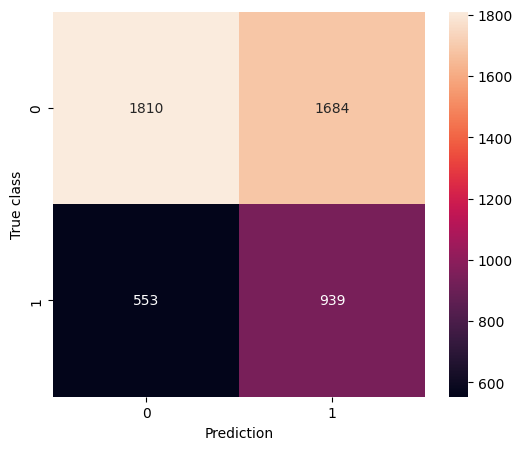

In [69]:
cm = confusion_matrix(message_val['burnout_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [70]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+3'])

classification_report(message_val['burnout_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.73      0.55      0.63      3494\n        True       0.34      0.54      0.41      1492\n\n    accuracy                           0.54      4986\n   macro avg       0.54      0.54      0.52      4986\nweighted avg       0.62      0.54      0.56      4986\n'

Text(45.722222222222214, 0.5, 'True class')

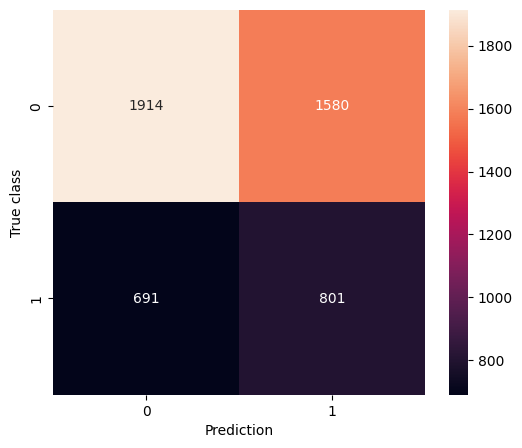

In [71]:
cm = confusion_matrix(message_val['burnout_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

# RF models

In [72]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(train_tf, message_train['burnout_t+3'])

classification_report(message_val['burnout_t+3'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.79      0.85      0.82      3494\n        True       0.57      0.45      0.51      1492\n\n    accuracy                           0.73      4986\n   macro avg       0.68      0.65      0.66      4986\nweighted avg       0.72      0.73      0.72      4986\n'

Text(45.722222222222214, 0.5, 'True class')

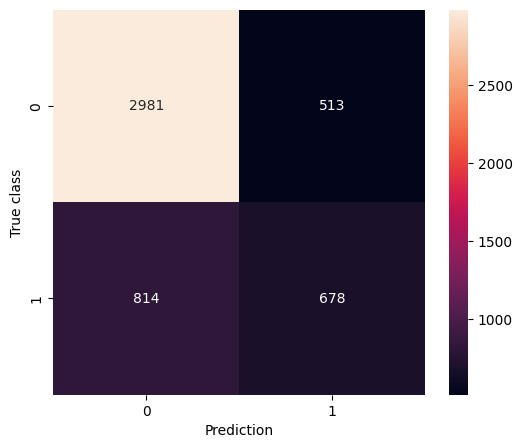

In [73]:
cm = confusion_matrix(message_val['burnout_t+3'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [74]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+3'])

classification_report(message_val['burnout_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.75      0.93      0.83      3494\n        True       0.62      0.27      0.38      1492\n\n    accuracy                           0.73      4986\n   macro avg       0.68      0.60      0.60      4986\nweighted avg       0.71      0.73      0.69      4986\n'

Text(45.722222222222214, 0.5, 'True class')

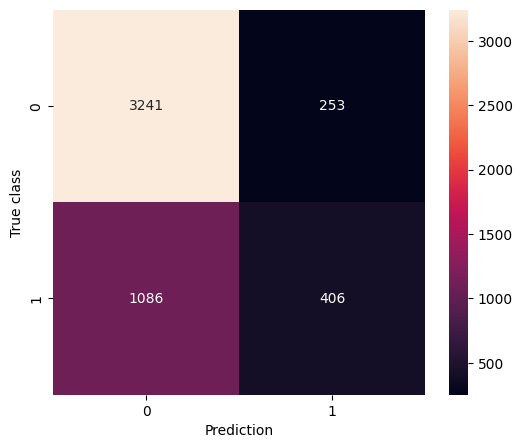

In [75]:
cm = confusion_matrix(message_val['burnout_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [76]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+3'])

classification_report(message_val['burnout_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.72      0.96      0.82      3494\n        True       0.59      0.14      0.23      1492\n\n    accuracy                           0.71      4986\n   macro avg       0.66      0.55      0.53      4986\nweighted avg       0.69      0.71      0.65      4986\n'

Text(45.722222222222214, 0.5, 'True class')

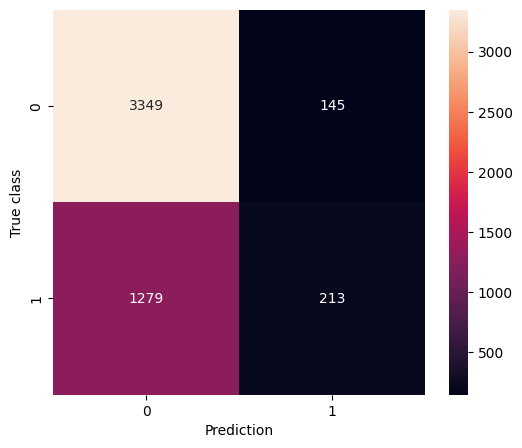

In [77]:
cm = confusion_matrix(message_val['burnout_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

## Burnout T+12

In [36]:
burnout_logistic_data = logistic_data[~logistic_data.burnout.isna()].drop(['burnout_t+1', 'burnout_t+3', 'burnout', 'ragequit_t+1', 'ragequit_t+3', 'ragequit_t+12', 'git_close'], axis = 1).drop_duplicates().drop(['Alias', 'From', 'To', 'start_datetime', 'end_datetime', 'lagged_burnout', 'reply_close', 'working_months', 'quit', 'first_quit_month', 'git_degree', 'Workload'], axis = 1).dropna().astype({'burnout_t+12':bool})
logistic_train_data, logistic_test_data = train_test_split(burnout_logistic_data, test_size = 0.2, random_state = 404, stratify = burnout_logistic_data['burnout_t+12'])

In [37]:
lr_model = LogisticRegressionCV(max_iter = 1000000).fit(logistic_train_data.drop('burnout_t+12', axis = 1), logistic_train_data['burnout_t+12'])

Text(45.722222222222214, 0.5, 'True class')

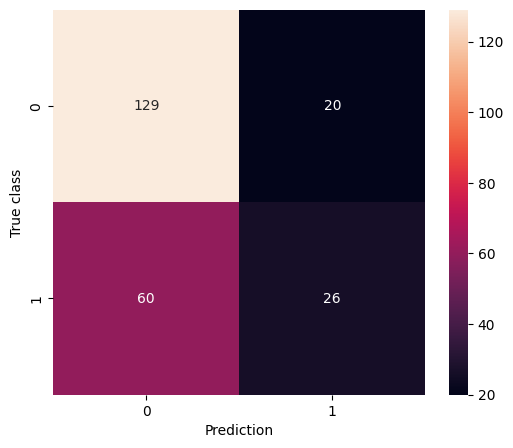

In [38]:
cm = confusion_matrix(logistic_test_data['burnout_t+12'], lr_model.predict(logistic_test_data.drop('burnout_t+12', axis = 1)))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

statsmodels

In [39]:
stat_model = sm.Logit(logistic_train_data['burnout_t+12'].astype(float), sm.add_constant(logistic_train_data.drop('burnout_t+12', axis = 1)).astype(float)).fit(disp = 0)
stat_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:           burnout_t+12   No. Observations:                  940
Model:                          Logit   Df Residuals:                      926
Method:                           MLE   Df Model:                           13
Date:                Wed, 28 May 2025   Pseudo R-squ.:                 0.08556
Time:                        19:42:03   Log-Likelihood:                -563.53
converged:                       True   LL-Null:                       -616.25
Covariance Type:            nonrobust   LLR p-value:                 1.445e-16
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.6326      0.393     -1.608      0.108      -1.404       0.139
Avg. distance             0.0998      0.083      1.198      0.231      -0.064       0.263
Lone Wolf                -0.4124      0.291     -1.419      0.156      -0.982       0.157
Messages Sent             0.0074      0.002      3.016      0.003       0.003       0.012
Organisational Silo       0.5793      0.178      3.263      0.001       0.231       0.927
Radio Silence            -0.2771      0.194     -1.431      0.152      -0.657       0.102
standardized_workload     0.0244      0.024      1.028      0.304      -0.022       0.071
black_cloud               0.6815      0.186      3.667      0.000       0.317       1.046
st_congruence             0.2694      0.473      0.569      0.569      -0.658       1.196
reply_degree             -1.1913      1.172     -1.016      0.309      -3.489       1.106
reply_between            -4.1760      1.325     -3.152      0.002      -6.773      -1.579
git_between               0.8500      0.411      2.070      0.038       0.045       1.655
reply_density            -1.7309      1.081     -1.602      0.109      -3.849       0.387
git_density               0.5530      0.331      1.672      0.095      -0.095       1.201
=========================================================================================
"""

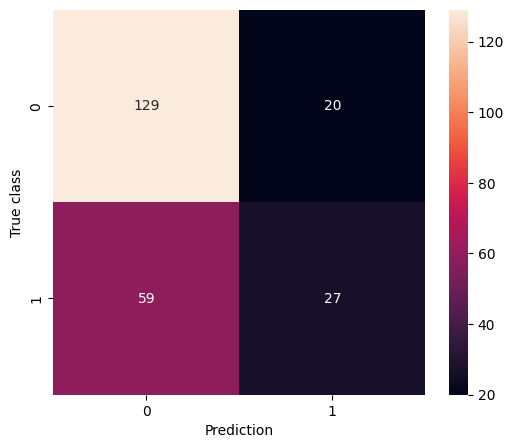

In [40]:
cm = confusion_matrix(logistic_test_data['burnout_t+12'], round(stat_model.predict(sm.add_constant(logistic_test_data.drop('burnout_t+12', axis = 1)).astype(float))).astype(int))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')
fig.savefig('results/all_data/burnout+12_unbal_LR.png')

### Burnout NB

In [83]:
message_data = all_test[['reply_body', 'burnout_t+12']].dropna()

nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

message_data['lemmas'] = message_data.reply_body.progress_apply(lambda x: [token.lemma_ for token in nlp(handle_negation(x)) if not token.is_stop and token.is_alpha])
message_data['burnout_t+12'] = message_data['burnout_t+12'].astype(bool)
message_data

100%|██████████| 34404/34404 [14:59<00:00, 38.25it/s] 


,reply_body,burnout_t+12,lemmas
6,appliedcommitted,False,[appliedcommitte]
7,proxy server received an invalid response from...,False,"[proxy, server, receive, invalid, response, up..."
8,"we actually could use that, as we have a trad...",False,"[actually, use, trademark, asf, want, add, sur..."
10,my vote would be m5 so we out.,False,[vote]
11,that is the beautiful part of is not Positive...,False,"[beautiful, PositiveSentiment]"
...,...,...,...
79485,"currently, bookkeeper client still write ledge...",False,"[currently, bookkeeper, client, write, ledger,..."
79486,we changed ledgers to let consumed messages be...,False,"[change, ledger, let, consume, message, garbag..."
79487,if there are lots of pending topic we should h...,False,"[lot, pende, topic, hub, pende, request, acces..."
79488,currently use same ledger metadata during ledg...,False,"[currently, use, ledger, metadata, ledger, wri..."


In [84]:
message_data = message_data[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 0]

message_train, message_test = train_test_split(message_data, test_size=0.15, random_state=404, stratify = message_data['burnout_t+12'])
message_train, message_val = train_test_split(message_train, test_size=(0.15/0.85), random_state=404, stratify = message_train['burnout_t+12'])

print(f'length of train set: {len(message_train)}\nlength of validation set: {len(message_val)}\nlength of test set: {len(message_test)}')
message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages

# Oversample on the True cases in the train set
if 2*message_train["burnout_t+12"].sum()<len(message_train):
   # True is the minority class
    if 3*message_train["burnout_t+12"].sum()<len(message_train):
        # We need to over- and undersample to create balance
        message_train = pd.concat([message_train.loc[message_train[message_train["burnout_t+12"]==1].index], message_train])
        print(f'Positive cases: {message_train["burnout_t+12"].sum()}')

        if 3*message_train["burnout_t+12"].sum()<len(message_train):
            # Check for massive imbalance
            message_train = pd.concat([message_train.loc[message_train[message_train["burnout_t+12"]==1].index], message_train])
            print(f'Positive cases: {message_train["burnout_t+12"].sum()}')

        nMax = message_train["burnout_t+12"].sum()
        message_train = message_train.groupby("burnout_t+12").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')
    else:
        nMax = message_train["burnout_t+12"].sum()
        # Only undersampling will do
        print(f'Positive cases: {message_train["burnout_t+12"].sum()}')
        message_train = message_train.groupby("burnout_t+12").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')


else:
    if message_train["burnout_t+12"].sum()>0.67*len(message_train):
        # False is the minority class and we need to over- and undersample
        message_train = pd.concat([message_train.loc[message_train[message_train["burnout_t+12"]==0].index], message_train])
        print(f'Positive cases: {message_train["burnout_t+12"].sum()}')

        if message_train["burnout_t+12"].sum()>0.67*len(message_train):
            # Check for massive imbalance (mainly ragequit case)
            message_train = pd.concat([message_train.loc[message_train[message_train["burnout_t+12"]==0].index], message_train])
            print(f'Positive cases: {message_train["burnout_t+12"].sum()}')

        nMax = len(message_train) - message_train["burnout_t+12"].sum()
        message_train = message_train.groupby("burnout_t+12").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

    else:
        nMax = len(message_train) - message_train["burnout_t+12"].sum()
        print(f'Positive cases: {message_train["burnout_t+12"].sum()}')
        message_train = message_train.groupby("burnout_t+12").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

length of train set: 23264
length of validation set: 4986
length of test set: 4986
Positive cases: 6854
New length of train set: 13708


C:\Users\woute\AppData\Local\Temp\ipykernel_2648\188543492.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages
C:\Users\woute\AppData\Local\Temp\ipykernel_2648\188543492.py:30: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  message_train = message_train.groupby("burnout_t+12").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)


In [85]:
pos_labels, pos_values = zip(*Counter(itertools.chain(*message_data[message_data['burnout_t+12']].lemmas.tolist())).items())
neg_labels, neg_values = zip(*Counter(itertools.chain(*message_data[~message_data['burnout_t+12']].lemmas.tolist())).items())

importance_df = pd.DataFrame(index = list(set(pos_labels + neg_labels)), data = {'pos_occur': pd.Series(pos_values, index = pos_labels), 'neg_occur': pd.Series(neg_values, index = neg_labels)})
importance_df.fillna(0, inplace = True)
importance_df['total_appearances'] = importance_df['pos_occur'] + importance_df['neg_occur']

for i in range(0,125,25):
    p = i
    importance_df['pos_importance'] = (importance_df['pos_occur'] + p)/(importance_df['total_appearances']+2*p)
    importance_df['neg_importance'] = (importance_df['neg_occur'] + p)/(importance_df['total_appearances']+2*p)
    print(f'positive {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'pos_importance', ascending = False)[['pos_importance', 'pos_occur', 'total_appearances']].head(20))
    print(f'negative {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'neg_importance', ascending = False)[['neg_importance', 'neg_occur', 'total_appearances']].head(20))
    print('----------------------------------------------------------------------------------------------------------------------------------------------')

positive 0:
            pos_importance  pos_occur  total_appearances
jenck             0.855079     1894.0             2215.0
na                0.837037      113.0              135.0
alert             0.796020      160.0              201.0
src               0.779703      630.0              808.0
trunk             0.727634      732.0             1006.0
ws                0.720721       80.0              111.0
adapter           0.720339       85.0              118.0
inot              0.709091       78.0              110.0
mbean             0.708155      165.0              233.0
webapp            0.707317      203.0              287.0
standard          0.701777      553.0              788.0
david             0.692308      387.0              559.0
supply            0.688312      106.0              154.0
regard            0.686567       92.0              134.0
xmlbean           0.669355       83.0              124.0
xmlbeans          0.648810      109.0              168.0
dec               0

In [86]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = MultinomialNB()
classifier.fit(train_tf, message_train['burnout_t+12'])

classification_report(message_val['burnout_t+12'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.77      0.61      0.68      3170\n        True       0.50      0.69      0.58      1816\n\n    accuracy                           0.64      4986\n   macro avg       0.64      0.65      0.63      4986\nweighted avg       0.68      0.64      0.65      4986\n'

Text(45.722222222222214, 0.5, 'True class')

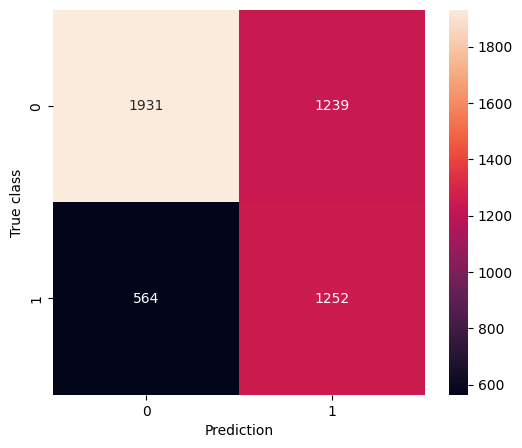

In [87]:
cm = confusion_matrix(message_val['burnout_t+12'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [88]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+12'])

classification_report(message_val['burnout_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.68      0.50      0.57      3170\n        True       0.40      0.60      0.48      1816\n\n    accuracy                           0.53      4986\n   macro avg       0.54      0.55      0.53      4986\nweighted avg       0.58      0.53      0.54      4986\n'

Text(45.722222222222214, 0.5, 'True class')

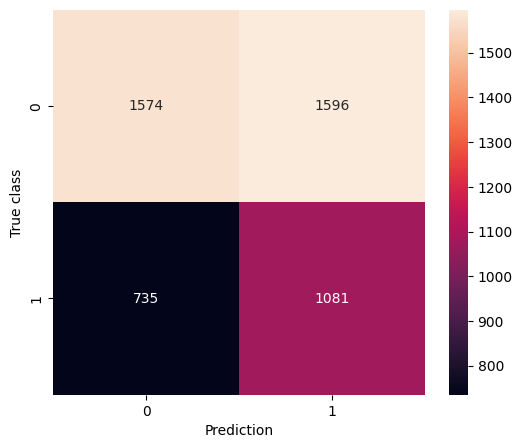

In [89]:
cm = confusion_matrix(message_val['burnout_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [90]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+12'])

classification_report(message_val['burnout_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.68      0.54      0.61      3170\n        True       0.41      0.56      0.48      1816\n\n    accuracy                           0.55      4986\n   macro avg       0.55      0.55      0.54      4986\nweighted avg       0.59      0.55      0.56      4986\n'

Text(45.722222222222214, 0.5, 'True class')

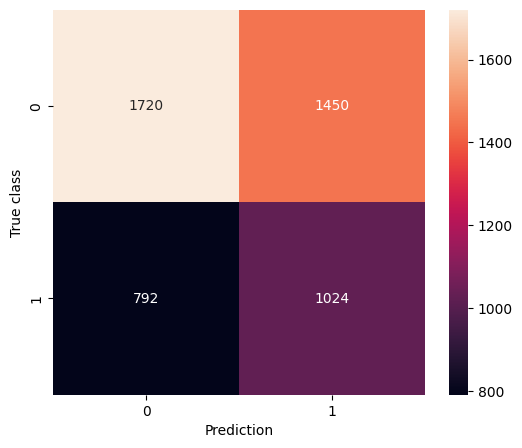

In [91]:
cm = confusion_matrix(message_val['burnout_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

# RF models

In [92]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(train_tf, message_train['burnout_t+12'])

classification_report(message_val['burnout_t+12'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.77      0.72      0.74      3170\n        True       0.56      0.62      0.59      1816\n\n    accuracy                           0.68      4986\n   macro avg       0.66      0.67      0.67      4986\nweighted avg       0.69      0.68      0.69      4986\n'

Text(45.722222222222214, 0.5, 'True class')

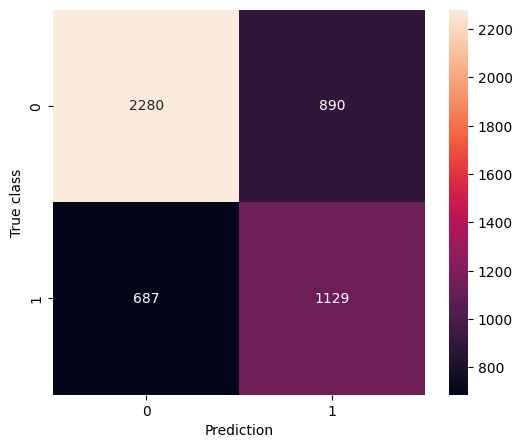

In [93]:
cm = confusion_matrix(message_val['burnout_t+12'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [94]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+12'])

classification_report(message_val['burnout_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.74      0.68      0.71      3170\n        True       0.52      0.59      0.55      1816\n\n    accuracy                           0.65      4986\n   macro avg       0.63      0.64      0.63      4986\nweighted avg       0.66      0.65      0.65      4986\n'

Text(45.722222222222214, 0.5, 'True class')

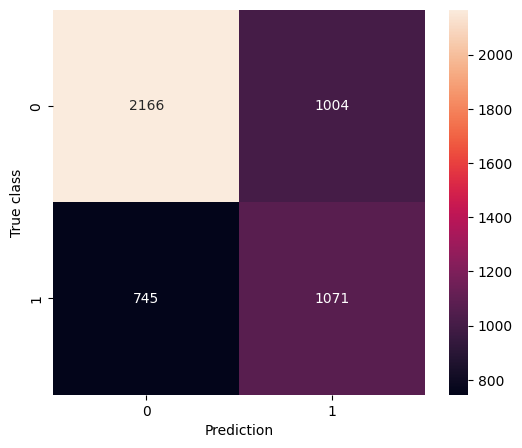

In [95]:
cm = confusion_matrix(message_val['burnout_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [96]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['burnout_t+12'])

classification_report(message_val['burnout_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.73      0.63      0.67      3170\n        True       0.47      0.59      0.53      1816\n\n    accuracy                           0.61      4986\n   macro avg       0.60      0.61      0.60      4986\nweighted avg       0.64      0.61      0.62      4986\n'

Text(45.722222222222214, 0.5, 'True class')

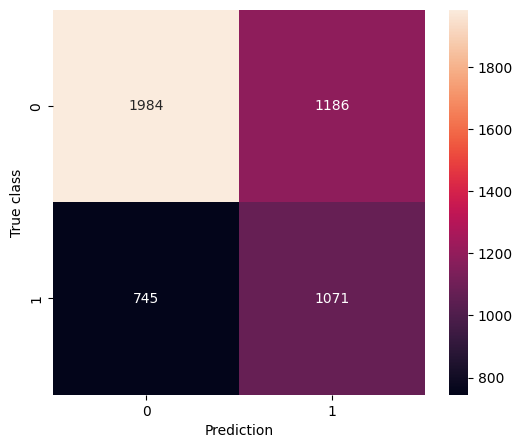

In [97]:
cm = confusion_matrix(message_val['burnout_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

## Ragequit T+3

In [41]:
burnout_logistic_data = logistic_data[~logistic_data.burnout.isna()].drop(['burnout_t+1', 'burnout_t+3', 'burnout_t+12', 'ragequit_t+1', 'burnout', 'ragequit_t+12', 'git_close'], axis = 1).drop_duplicates().drop(['Alias', 'From', 'To', 'start_datetime', 'end_datetime', 'lagged_burnout', 'reply_close', 'working_months', 'quit', 'first_quit_month', 'git_degree', 'Workload'], axis = 1).dropna().astype({'ragequit_t+3':bool})
logistic_train_data, logistic_test_data = train_test_split(burnout_logistic_data, test_size = 0.2, random_state = 404, stratify = burnout_logistic_data['ragequit_t+3'])

In [42]:
lr_model = LogisticRegressionCV(max_iter = 1000000).fit(logistic_train_data.drop('ragequit_t+3', axis = 1), logistic_train_data['ragequit_t+3'])

Text(45.722222222222214, 0.5, 'True class')

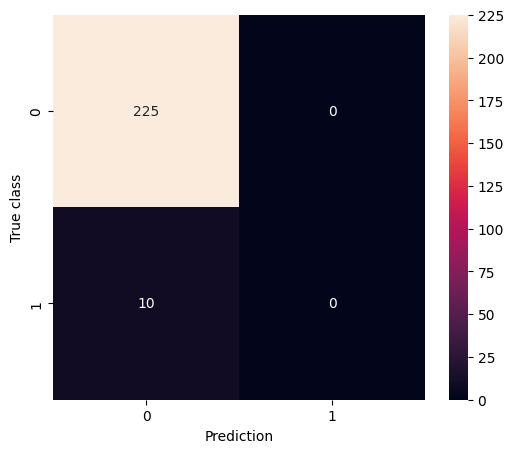

In [43]:
cm = confusion_matrix(logistic_test_data['ragequit_t+3'], lr_model.predict(logistic_test_data.drop('ragequit_t+3', axis = 1)))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

statsmodels

In [44]:
stat_model = sm.Logit(logistic_train_data['ragequit_t+3'].astype(float), sm.add_constant(logistic_train_data.drop('ragequit_t+3', axis = 1)).astype(float)).fit(disp = 0)
stat_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:           ragequit_t+3   No. Observations:                  940
Model:                          Logit   Df Residuals:                      926
Method:                           MLE   Df Model:                           13
Date:                Wed, 28 May 2025   Pseudo R-squ.:                 0.06763
Time:                        19:42:36   Log-Likelihood:                -159.99
converged:                       True   LL-Null:                       -171.59
Covariance Type:            nonrobust   LLR p-value:                   0.03923
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -2.2917      0.848     -2.704      0.007      -3.953      -0.631
Avg. distance            -0.2849      0.204     -1.395      0.163      -0.685       0.115
Lone Wolf                 0.2861      0.596      0.480      0.631      -0.882       1.454
Messages Sent            -0.0220      0.010     -2.138      0.033      -0.042      -0.002
Organisational Silo       0.4549      0.391      1.165      0.244      -0.311       1.220
Radio Silence             0.3035      0.402      0.756      0.450      -0.484       1.091
standardized_workload     0.0126      0.045      0.276      0.783      -0.077       0.102
black_cloud              -0.9425      0.425     -2.216      0.027      -1.776      -0.109
st_congruence             0.1180      1.070      0.110      0.912      -1.979       2.215
reply_degree             -2.3519      2.486     -0.946      0.344      -7.224       2.521
reply_between            -0.5149      2.658     -0.194      0.846      -5.724       4.694
git_between              -0.0480      0.923     -0.052      0.959      -1.856       1.760
reply_density             6.0181      1.878      3.204      0.001       2.336       9.700
git_density              -0.7903      0.830     -0.952      0.341      -2.417       0.836
=========================================================================================
"""

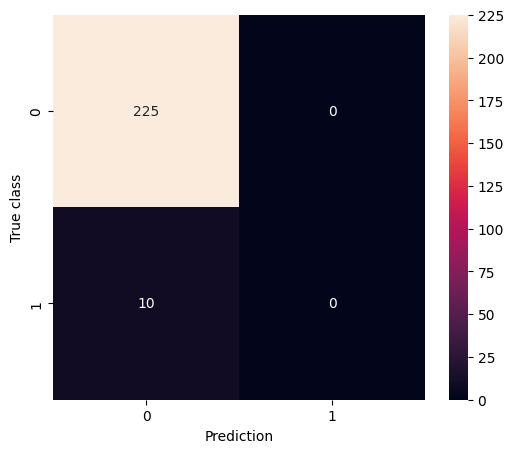

In [45]:
cm = confusion_matrix(logistic_test_data['ragequit_t+3'], round(stat_model.predict(sm.add_constant(logistic_test_data.drop('ragequit_t+3', axis = 1)).astype(float))).astype(int))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')
fig.savefig('results/all_data/ragequit+3_unbal_LR.png')

### Burnout NB

In [103]:
message_data = all_test[['reply_body', 'ragequit_t+3']].dropna()

nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

message_data['lemmas'] = message_data.reply_body.progress_apply(lambda x: [token.lemma_ for token in nlp(handle_negation(x)) if not token.is_stop and token.is_alpha])
message_data['ragequit_t+3'] = message_data['ragequit_t+3'].astype(bool)
message_data

100%|██████████| 34404/34404 [12:55<00:00, 44.38it/s] 


,reply_body,ragequit_t+3,lemmas
6,appliedcommitted,False,[appliedcommitte]
7,proxy server received an invalid response from...,False,"[proxy, server, receive, invalid, response, up..."
8,"we actually could use that, as we have a trad...",False,"[actually, use, trademark, asf, want, add, sur..."
10,my vote would be m5 so we out.,False,[vote]
11,that is the beautiful part of is not Positive...,False,"[beautiful, PositiveSentiment]"
...,...,...,...
79485,"currently, bookkeeper client still write ledge...",False,"[currently, bookkeeper, client, write, ledger,..."
79486,we changed ledgers to let consumed messages be...,False,"[change, ledger, let, consume, message, garbag..."
79487,if there are lots of pending topic we should h...,False,"[lot, pende, topic, hub, pende, request, acces..."
79488,currently use same ledger metadata during ledg...,False,"[currently, use, ledger, metadata, ledger, wri..."


In [104]:
message_data = message_data[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 0]

message_train, message_test = train_test_split(message_data, test_size=0.15, random_state=404, stratify = message_data['ragequit_t+3'])
message_train, message_val = train_test_split(message_train, test_size=(0.15/0.85), random_state=404, stratify = message_train['ragequit_t+3'])

print(f'length of train set: {len(message_train)}\nlength of validation set: {len(message_val)}\nlength of test set: {len(message_test)}')
message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages

# Oversample on the True cases in the train set
if 2*message_train["ragequit_t+3"].sum()<len(message_train):
   # True is the minority class
    if 3*message_train["ragequit_t+3"].sum()<len(message_train):
        # We need to over- and undersample to create balance
        message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+3"]==1].index], message_train])
        print(f'Positive cases: {message_train["ragequit_t+3"].sum()}')

        if 3*message_train["ragequit_t+3"].sum()<len(message_train):
            # Check for massive imbalance
            message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+3"]==1].index], message_train])
            print(f'Positive cases: {message_train["ragequit_t+3"].sum()}')

        nMax = message_train["ragequit_t+3"].sum()
        message_train = message_train.groupby("ragequit_t+3").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')
    else:
        nMax = message_train["ragequit_t+3"].sum()
        # Only undersampling will do
        print(f'Positive cases: {message_train["ragequit_t+3"].sum()}')
        message_train = message_train.groupby("ragequit_t+3").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')


else:
    if message_train["ragequit_t+3"].sum()>0.67*len(message_train):
        # False is the minority class and we need to over- and undersample
        message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+3"]==0].index], message_train])
        print(f'Positive cases: {message_train["ragequit_t+3"].sum()}')

        if message_train["ragequit_t+3"].sum()>0.67*len(message_train):
            # Check for massive imbalance (mainly ragequit case)
            message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+3"]==0].index], message_train])
            print(f'Positive cases: {message_train["ragequit_t+3"].sum()}')

        nMax = len(message_train) - message_train["ragequit_t+3"].sum()
        message_train = message_train.groupby("ragequit_t+3").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

    else:
        nMax = len(message_train) - message_train["ragequit_t+3"].sum()
        print(f'Positive cases: {message_train["ragequit_t+3"].sum()}')
        message_train = message_train.groupby("ragequit_t+3").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

length of train set: 23264
length of validation set: 4986
length of test set: 4986
Positive cases: 1336
Positive cases: 4008
New length of train set: 8016


C:\Users\woute\AppData\Local\Temp\ipykernel_2648\3232222597.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages
C:\Users\woute\AppData\Local\Temp\ipykernel_2648\3232222597.py:23: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  message_train = message_train.groupby("ragequit_t+3").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)


In [105]:
pos_labels, pos_values = zip(*Counter(itertools.chain(*message_data[message_data['ragequit_t+3']].lemmas.tolist())).items())
neg_labels, neg_values = zip(*Counter(itertools.chain(*message_data[~message_data['ragequit_t+3']].lemmas.tolist())).items())

importance_df = pd.DataFrame(index = list(set(pos_labels + neg_labels)), data = {'pos_occur': pd.Series(pos_values, index = pos_labels), 'neg_occur': pd.Series(neg_values, index = neg_labels)})
importance_df.fillna(0, inplace = True)
importance_df['total_appearances'] = importance_df['pos_occur'] + importance_df['neg_occur']

for i in range(0,125,25):
    p = i
    importance_df['pos_importance'] = (importance_df['pos_occur'] + p)/(importance_df['total_appearances']+2*p)
    importance_df['neg_importance'] = (importance_df['neg_occur'] + p)/(importance_df['total_appearances']+2*p)
    print(f'positive {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'pos_importance', ascending = False)[['pos_importance', 'pos_occur', 'total_appearances']].head(20))
    print(f'negative {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'neg_importance', ascending = False)[['neg_importance', 'neg_occur', 'total_appearances']].head(20))
    print('----------------------------------------------------------------------------------------------------------------------------------------------')

positive 0:
                     pos_importance  pos_occur  total_appearances
startmbeaninstance         1.000000      107.0              107.0
deploygeronimombean        1.000000      163.0              163.0
checkingtask               1.000000      167.0              167.0
deploymentplan             1.000000      475.0              475.0
snapshotproject            1.000000      199.0              199.0
roject                     0.973451      110.0              113.0
geronimombean              0.948454      184.0              194.0
om                         0.890323      138.0              155.0
retrieve                   0.878683      507.0              577.0
disabled                   0.836991      267.0              319.0
debug                      0.828939     1352.0             1631.0
trace                      0.796894      667.0              837.0
parent                     0.694575      589.0              848.0
pom                        0.583716      509.0              872.

In [106]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = MultinomialNB()
classifier.fit(train_tf, message_train['ragequit_t+3'])

classification_report(message_val['ragequit_t+3'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.98      0.74      0.84      4802\n        True       0.08      0.55      0.13       184\n\n    accuracy                           0.73      4986\n   macro avg       0.53      0.65      0.49      4986\nweighted avg       0.94      0.73      0.82      4986\n'

Text(45.722222222222214, 0.5, 'True class')

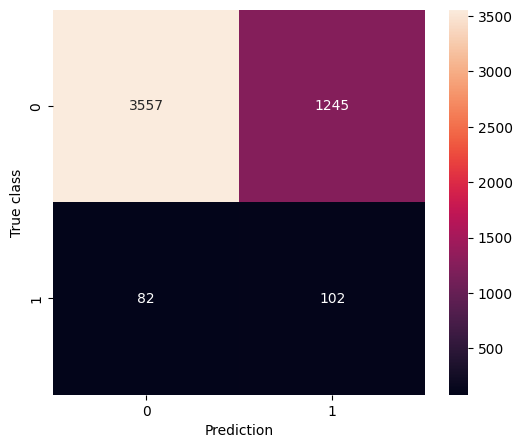

In [107]:
cm = confusion_matrix(message_val['ragequit_t+3'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [108]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+3'])

classification_report(message_val['ragequit_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.97      0.70      0.81      4802\n        True       0.06      0.48      0.10       184\n\n    accuracy                           0.69      4986\n   macro avg       0.51      0.59      0.46      4986\nweighted avg       0.94      0.69      0.79      4986\n'

Text(45.722222222222214, 0.5, 'True class')

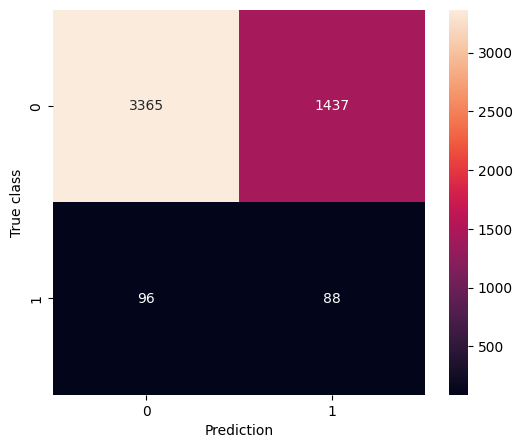

In [109]:
cm = confusion_matrix(message_val['ragequit_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [110]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+3'])

classification_report(message_val['ragequit_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.97      0.56      0.71      4802\n        True       0.04      0.52      0.08       184\n\n    accuracy                           0.55      4986\n   macro avg       0.51      0.54      0.39      4986\nweighted avg       0.93      0.55      0.68      4986\n'

Text(45.722222222222214, 0.5, 'True class')

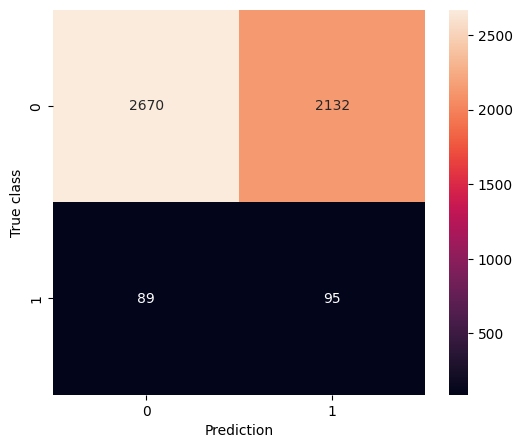

In [111]:
cm = confusion_matrix(message_val['ragequit_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

# RF models

In [112]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(train_tf, message_train['ragequit_t+3'])

classification_report(message_val['ragequit_t+3'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.97      0.97      0.97      4802\n        True       0.18      0.18      0.18       184\n\n    accuracy                           0.94      4986\n   macro avg       0.57      0.58      0.57      4986\nweighted avg       0.94      0.94      0.94      4986\n'

Text(45.722222222222214, 0.5, 'True class')

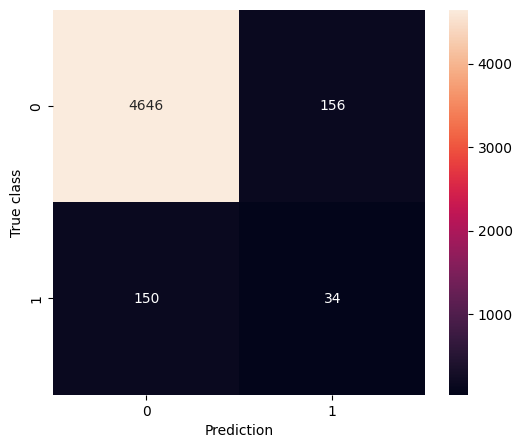

In [113]:
cm = confusion_matrix(message_val['ragequit_t+3'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [114]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+3'])

classification_report(message_val['ragequit_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.97      0.99      0.98      4802\n        True       0.25      0.08      0.12       184\n\n    accuracy                           0.96      4986\n   macro avg       0.61      0.53      0.55      4986\nweighted avg       0.94      0.96      0.95      4986\n'

Text(45.722222222222214, 0.5, 'True class')

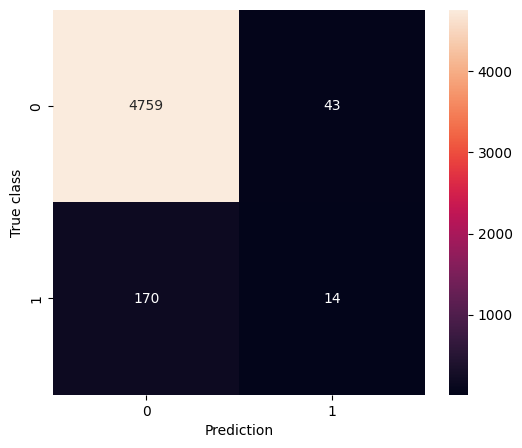

In [115]:
cm = confusion_matrix(message_val['ragequit_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [116]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+3'])

classification_report(message_val['ragequit_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.96      1.00      0.98      4802\n        True       0.44      0.02      0.04       184\n\n    accuracy                           0.96      4986\n   macro avg       0.70      0.51      0.51      4986\nweighted avg       0.94      0.96      0.95      4986\n'

Text(45.722222222222214, 0.5, 'True class')

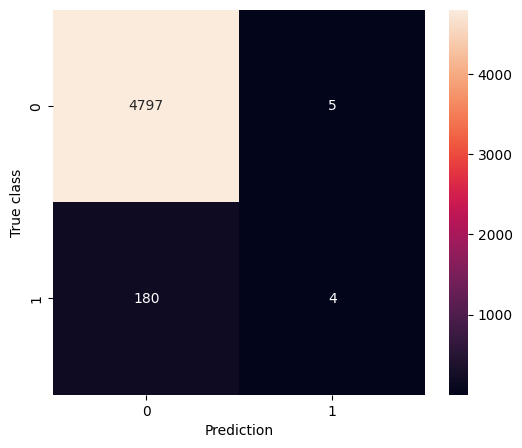

In [117]:
cm = confusion_matrix(message_val['ragequit_t+3'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

## Ragequit T+12

In [46]:
burnout_logistic_data = logistic_data[~logistic_data.burnout.isna()].drop(['burnout_t+1', 'burnout_t+3', 'burnout_t+12', 'ragequit_t+1', 'ragequit_t+3', 'burnout', 'git_close'], axis = 1).drop_duplicates().drop(['Alias', 'From', 'To', 'start_datetime', 'end_datetime', 'lagged_burnout', 'reply_close', 'working_months', 'quit', 'first_quit_month', 'git_degree', 'Workload'], axis = 1).dropna().astype({'ragequit_t+12':bool})
logistic_train_data, logistic_test_data = train_test_split(burnout_logistic_data, test_size = 0.2, random_state = 404, stratify = burnout_logistic_data['ragequit_t+12'])

In [47]:
lr_model = LogisticRegressionCV(max_iter = 1000000).fit(logistic_train_data.drop('ragequit_t+12', axis = 1), logistic_train_data['ragequit_t+12'])

Text(45.722222222222214, 0.5, 'True class')

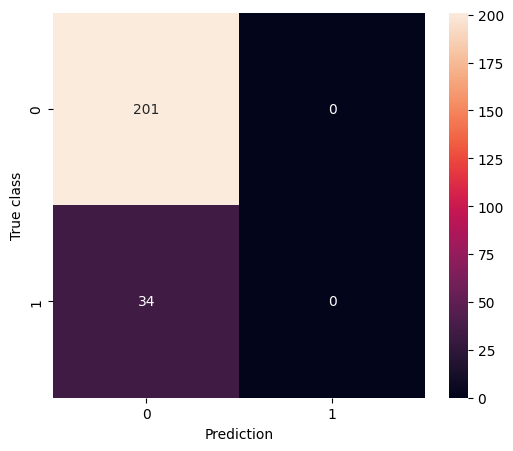

In [48]:
cm = confusion_matrix(logistic_test_data['ragequit_t+12'], lr_model.predict(logistic_test_data.drop('ragequit_t+12', axis = 1)))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

statsmodels

In [49]:
stat_model = sm.Logit(logistic_train_data['ragequit_t+12'].astype(float), sm.add_constant(logistic_train_data.drop('ragequit_t+12', axis = 1)).astype(float)).fit(disp = 0)
stat_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:          ragequit_t+12   No. Observations:                  940
Model:                          Logit   Df Residuals:                      926
Method:                           MLE   Df Model:                           13
Date:                Wed, 28 May 2025   Pseudo R-squ.:                 0.05077
Time:                        19:43:00   Log-Likelihood:                -367.15
converged:                       True   LL-Null:                       -386.79
Covariance Type:            nonrobust   LLR p-value:                 0.0001806
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.9272      0.500     -1.856      0.064      -1.907       0.052
Avg. distance            -0.0739      0.111     -0.663      0.508      -0.292       0.145
Lone Wolf                -0.3766      0.371     -1.014      0.311      -1.105       0.352
Messages Sent            -0.0194      0.006     -3.422      0.001      -0.030      -0.008
Organisational Silo       0.5683      0.242      2.350      0.019       0.094       1.042
Radio Silence            -0.1453      0.249     -0.583      0.560      -0.634       0.344
standardized_workload    -0.0571      0.044     -1.297      0.195      -0.143       0.029
black_cloud              -0.0265      0.244     -0.109      0.913      -0.504       0.451
st_congruence             0.0037      0.600      0.006      0.995      -1.172       1.179
reply_degree              2.0906      1.596      1.310      0.190      -1.038       5.220
reply_between            -4.7269      1.935     -2.443      0.015      -8.519      -0.935
git_between              -0.1603      0.559     -0.287      0.774      -1.255       0.935
reply_density             0.3622      1.382      0.262      0.793      -2.346       3.071
git_density              -0.8975      0.499     -1.798      0.072      -1.876       0.081
=========================================================================================
"""

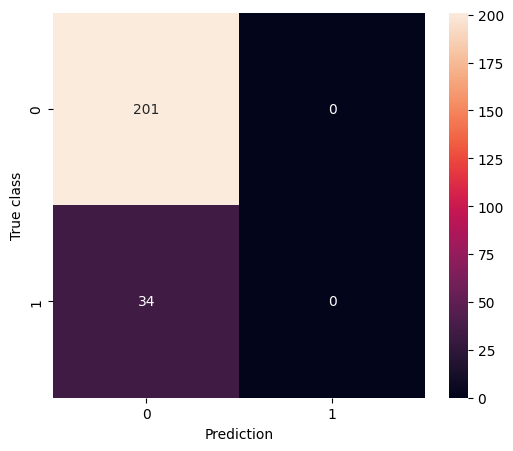

In [50]:
cm = confusion_matrix(logistic_test_data['ragequit_t+12'], round(stat_model.predict(sm.add_constant(logistic_test_data.drop('ragequit_t+12', axis = 1)).astype(float))).astype(int))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')
fig.savefig('results/all_data/ragequit+12_unbal_LR.png')

### Burnout NB

In [123]:
message_data = all_test[['reply_body', 'ragequit_t+12']].dropna()

nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

message_data['lemmas'] = message_data.reply_body.progress_apply(lambda x: [token.lemma_ for token in nlp(handle_negation(x)) if not token.is_stop and token.is_alpha])
message_data['ragequit_t+12'] = message_data['ragequit_t+12'].astype(bool)
message_data

100%|██████████| 34404/34404 [11:57<00:00, 47.98it/s]  


,reply_body,ragequit_t+12,lemmas
6,appliedcommitted,False,[appliedcommitte]
7,proxy server received an invalid response from...,False,"[proxy, server, receive, invalid, response, up..."
8,"we actually could use that, as we have a trad...",False,"[actually, use, trademark, asf, want, add, sur..."
10,my vote would be m5 so we out.,False,[vote]
11,that is the beautiful part of is not Positive...,False,"[beautiful, PositiveSentiment]"
...,...,...,...
79485,"currently, bookkeeper client still write ledge...",False,"[currently, bookkeeper, client, write, ledger,..."
79486,we changed ledgers to let consumed messages be...,False,"[change, ledger, let, consume, message, garbag..."
79487,if there are lots of pending topic we should h...,False,"[lot, pende, topic, hub, pende, request, acces..."
79488,currently use same ledger metadata during ledg...,False,"[currently, use, ledger, metadata, ledger, wri..."


In [124]:
message_data = message_data[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 0]

message_train, message_test = train_test_split(message_data, test_size=0.15, random_state=404, stratify = message_data['ragequit_t+12'])
message_train, message_val = train_test_split(message_train, test_size=(0.15/0.85), random_state=404, stratify = message_train['ragequit_t+12'])

print(f'length of train set: {len(message_train)}\nlength of validation set: {len(message_val)}\nlength of test set: {len(message_test)}')
message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages

# Oversample on the True cases in the train set
if 2*message_train["ragequit_t+12"].sum()<len(message_train):
   # True is the minority class
    if 3*message_train["ragequit_t+12"].sum()<len(message_train):
        # We need to over- and undersample to create balance
        message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+12"]==1].index], message_train])
        print(f'Positive cases: {message_train["ragequit_t+12"].sum()}')

        if 3*message_train["ragequit_t+12"].sum()<len(message_train):
            # Check for massive imbalance
            message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+12"]==1].index], message_train])
            print(f'Positive cases: {message_train["ragequit_t+12"].sum()}')

        nMax = message_train["ragequit_t+12"].sum()
        message_train = message_train.groupby("ragequit_t+12").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')
    else:
        nMax = message_train["ragequit_t+12"].sum()
        # Only undersampling will do
        print(f'Positive cases: {message_train["ragequit_t+12"].sum()}')
        message_train = message_train.groupby("ragequit_t+12").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')


else:
    if message_train["ragequit_t+12"].sum()>0.67*len(message_train):
        # False is the minority class and we need to over- and undersample
        message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+12"]==0].index], message_train])
        print(f'Positive cases: {message_train["ragequit_t+12"].sum()}')

        if message_train["ragequit_t+12"].sum()>0.67*len(message_train):
            # Check for massive imbalance (mainly ragequit case)
            message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+12"]==0].index], message_train])
            print(f'Positive cases: {message_train["ragequit_t+12"].sum()}')

        nMax = len(message_train) - message_train["ragequit_t+12"].sum()
        message_train = message_train.groupby("ragequit_t+12").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

    else:
        nMax = len(message_train) - message_train["ragequit_t+12"].sum()
        print(f'Positive cases: {message_train["ragequit_t+12"].sum()}')
        message_train = message_train.groupby("ragequit_t+12").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

length of train set: 23264
length of validation set: 4986
length of test set: 4986


C:\Users\woute\AppData\Local\Temp\ipykernel_2648\2668262174.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages
C:\Users\woute\AppData\Local\Temp\ipykernel_2648\2668262174.py:23: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  message_train = message_train.groupby("ragequit_t+12").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)


Positive cases: 4578
Positive cases: 13734
New length of train set: 27468


In [125]:
pos_labels, pos_values = zip(*Counter(itertools.chain(*message_data[message_data['ragequit_t+12']].lemmas.tolist())).items())
neg_labels, neg_values = zip(*Counter(itertools.chain(*message_data[~message_data['ragequit_t+12']].lemmas.tolist())).items())

importance_df = pd.DataFrame(index = list(set(pos_labels + neg_labels)), data = {'pos_occur': pd.Series(pos_values, index = pos_labels), 'neg_occur': pd.Series(neg_values, index = neg_labels)})
importance_df.fillna(0, inplace = True)
importance_df['total_appearances'] = importance_df['pos_occur'] + importance_df['neg_occur']

for i in range(0,125,25):
    p = i
    importance_df['pos_importance'] = (importance_df['pos_occur'] + p)/(importance_df['total_appearances']+2*p)
    importance_df['neg_importance'] = (importance_df['neg_occur'] + p)/(importance_df['total_appearances']+2*p)
    print(f'positive {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'pos_importance', ascending = False)[['pos_importance', 'pos_occur', 'total_appearances']].head(20))
    print(f'negative {i}:')
    print(importance_df[importance_df['total_appearances']>100].sort_values(by = 'neg_importance', ascending = False)[['neg_importance', 'neg_occur', 'total_appearances']].head(20))
    print('----------------------------------------------------------------------------------------------------------------------------------------------')

positive 0:
                     pos_importance  pos_occur  total_appearances
deploygeronimombean        1.000000      163.0              163.0
checkingtask               1.000000      167.0              167.0
snapshotproject            1.000000      199.0              199.0
startmbeaninstance         1.000000      107.0              107.0
deploymentplan             1.000000      475.0              475.0
band                       0.981132      104.0              106.0
roject                     0.973451      110.0              113.0
geronimombean              0.948454      184.0              194.0
om                         0.903226      140.0              155.0
retrieve                   0.896014      517.0              577.0
disabled                   0.843260      269.0              319.0
debug                      0.839362     1369.0             1631.0
trace                      0.818399      685.0              837.0
parent                     0.707547      600.0              848.

In [126]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = MultinomialNB()
classifier.fit(train_tf, message_train['ragequit_t+12'])

classification_report(message_val['ragequit_t+12'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.93      0.69      0.80      4356\n        True       0.23      0.65      0.34       630\n\n    accuracy                           0.69      4986\n   macro avg       0.58      0.67      0.57      4986\nweighted avg       0.84      0.69      0.74      4986\n'

Text(45.722222222222214, 0.5, 'True class')

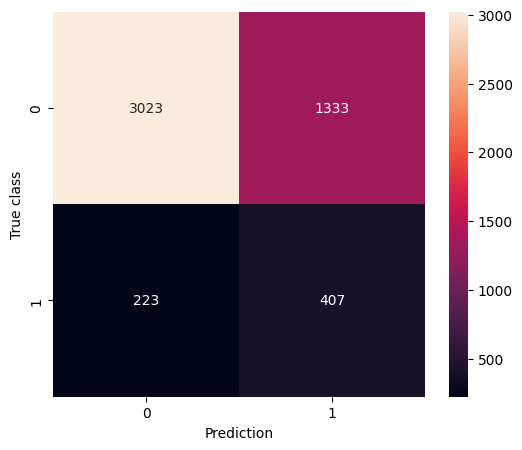

In [127]:
cm = confusion_matrix(message_val['ragequit_t+12'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [128]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+12'])

classification_report(message_val['ragequit_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.91      0.62      0.74      4356\n        True       0.17      0.55      0.26       630\n\n    accuracy                           0.61      4986\n   macro avg       0.54      0.59      0.50      4986\nweighted avg       0.81      0.61      0.68      4986\n'

Text(45.722222222222214, 0.5, 'True class')

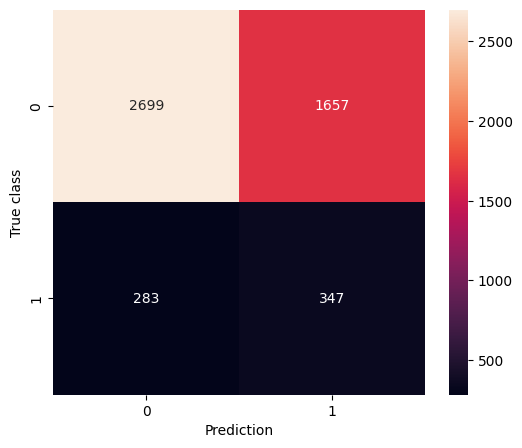

In [129]:
cm = confusion_matrix(message_val['ragequit_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [130]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = GaussianNB()
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+12'])

classification_report(message_val['ragequit_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.89      0.57      0.69      4356\n        True       0.15      0.51      0.23       630\n\n    accuracy                           0.56      4986\n   macro avg       0.52      0.54      0.46      4986\nweighted avg       0.80      0.56      0.63      4986\n'

Text(45.722222222222214, 0.5, 'True class')

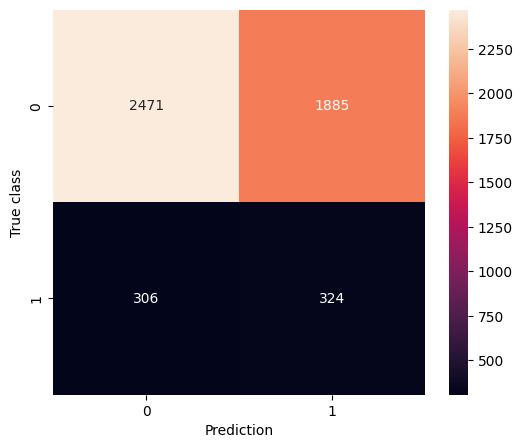

In [131]:
cm = confusion_matrix(message_val['ragequit_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

# RF models

In [132]:
def identity_tokenizer(text):
    return text

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['lemmas'])
validate_tf = tfidf.transform(message_val['lemmas'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(train_tf, message_train['ragequit_t+12'])

classification_report(message_val['ragequit_t+12'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.90      0.96      0.93      4356\n        True       0.49      0.29      0.36       630\n\n    accuracy                           0.87      4986\n   macro avg       0.70      0.62      0.65      4986\nweighted avg       0.85      0.87      0.86      4986\n'

Text(45.722222222222214, 0.5, 'True class')

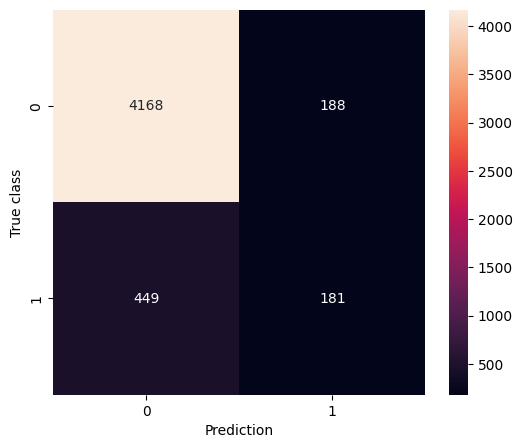

In [133]:
cm = confusion_matrix(message_val['ragequit_t+12'], classifier.predict(validate_tf))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [134]:
def create_embedding(product_name, word_embeddings, vector_size = 300):
    embeddings = list()
    for token in product_name:
        if token in word_embeddings:
            embeddings.append(word_embeddings[token])
    if embeddings:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(vector_size)

model = Word2Vec(sentences = message_data.lemmas.to_list(), vector_size = 300, min_count = 50, sg = 1)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model.wv))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model.wv))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+12'])

classification_report(message_val['ragequit_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.88      0.99      0.93      4356\n        True       0.52      0.09      0.15       630\n\n    accuracy                           0.87      4986\n   macro avg       0.70      0.54      0.54      4986\nweighted avg       0.84      0.87      0.83      4986\n'

Text(45.722222222222214, 0.5, 'True class')

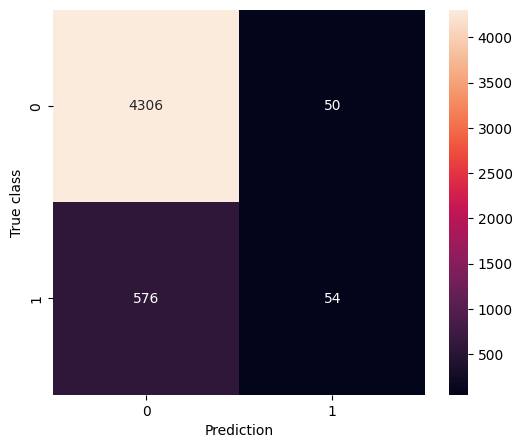

In [135]:
cm = confusion_matrix(message_val['ragequit_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

In [136]:
model = KeyedVectors.load_word2vec_format("SO_vectors_200.bin", binary=True)

message_train['doc_embeddings'] = message_train.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

message_val['doc_embeddings'] = message_val.lemmas.apply(lambda x: create_embedding(x, model, vector_size=200))

classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(np.array(message_train['doc_embeddings'].tolist()), message_train['ragequit_t+12'])

classification_report(message_val['ragequit_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))

'              precision    recall  f1-score   support\n\n       False       0.88      0.98      0.93      4356\n        True       0.42      0.08      0.13       630\n\n    accuracy                           0.87      4986\n   macro avg       0.65      0.53      0.53      4986\nweighted avg       0.82      0.87      0.83      4986\n'

Text(45.722222222222214, 0.5, 'True class')

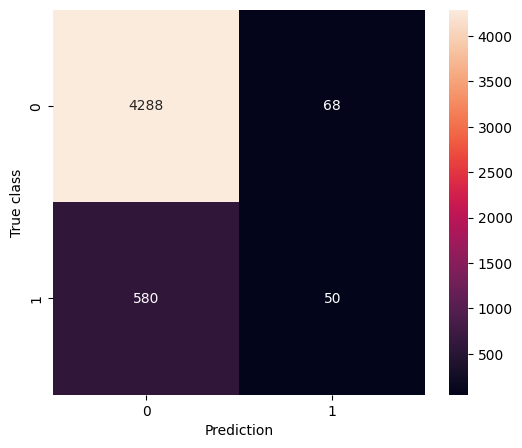

In [137]:
cm = confusion_matrix(message_val['ragequit_t+12'], classifier.predict(np.array(message_val['doc_embeddings'].tolist()),))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

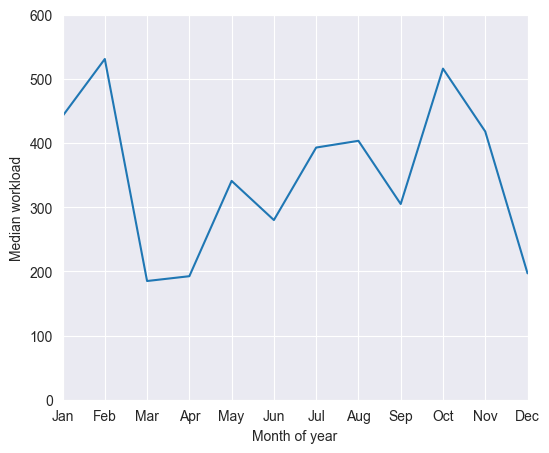

In [69]:
from matplotlib import dates as md
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
ax.set_xlim(1,12)
logistic_data.groupby(logistic_data.From.dt.month).Workload.median().plot(ax = ax)
ax.set_xticks(np.arange(1,13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
ax.set_ylim(0,600)
ax.set_xlabel('Month of year')
ax.set_ylabel('Median workload');
plt.savefig('Workload_pMonth_alldata.png')

100%|██████████| 78593/78593 [21:28<00:00, 60.98it/s]  


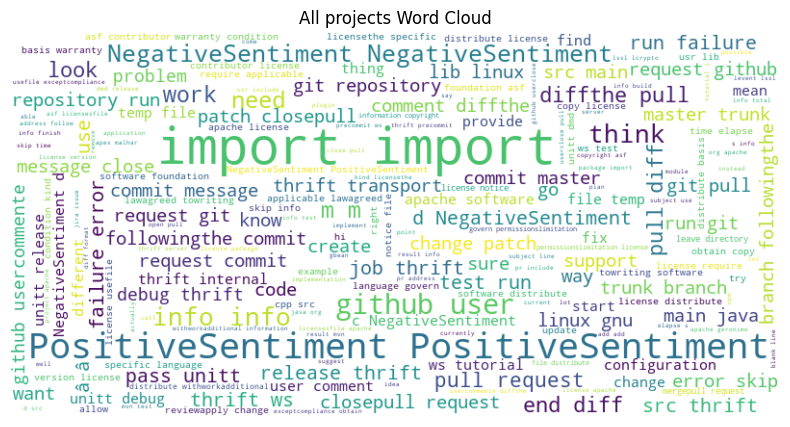

In [14]:
nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

all_test =  pd.read_csv('Test/data/all_communication_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)

all_text = ' '.join(all_test.dropna(subset = 'reply_body').reply_body.progress_apply(lambda x: ' '.join([token.lemma_ for token in nlp(x) if not token.is_stop and token.is_alpha])).tolist())
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.title("All projects Word Cloud")
plt.show()

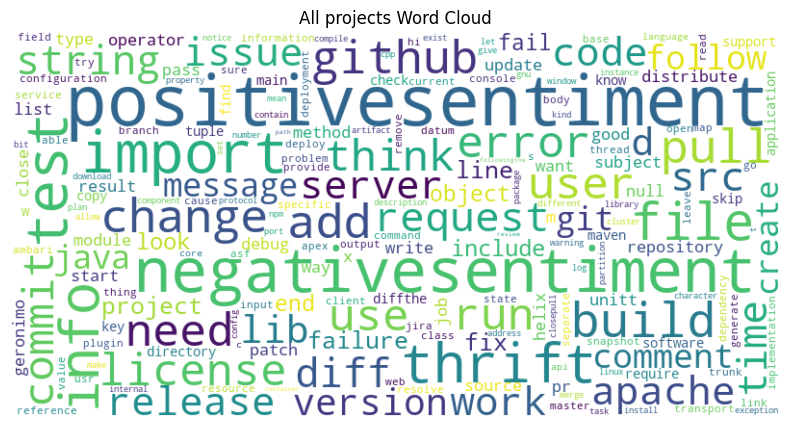

In [25]:
all_text = re.sub('\s+', ' ', all_text)
all_text = re.sub(r'[^A-Za-z\s]', '', all_text)
wordcloud = WordCloud(width=800, height=400, background_color='white', collocations = False).generate(all_text.lower())

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.title("All projects Word Cloud")
plt.savefig('All_WC.png')
plt.show()

100%|██████████| 3669/3669 [00:53<00:00, 68.66it/s] 


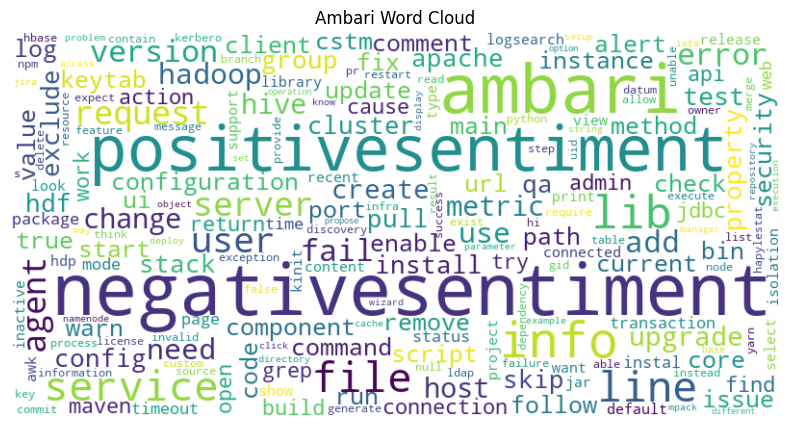

In [26]:
nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

all_test =  pd.read_csv('Test/data/ambari_all_message_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)

all_text = ' '.join(all_test.dropna(subset = 'reply_body').reply_body.progress_apply(lambda x: ' '.join([token.lemma_ for token in nlp(x) if not token.is_stop and token.is_alpha])).tolist())
all_text = re.sub('\s+', ' ', all_text)
all_text = re.sub(r'[^A-Za-z\s]', '', all_text)
wordcloud = WordCloud(width=800, height=400, background_color='white', collocations = False).generate(all_text.lower())

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.title("Ambari Word Cloud")
plt.savefig('Ambari_WC.png')
plt.show()


100%|██████████| 15694/15694 [04:54<00:00, 53.22it/s] 


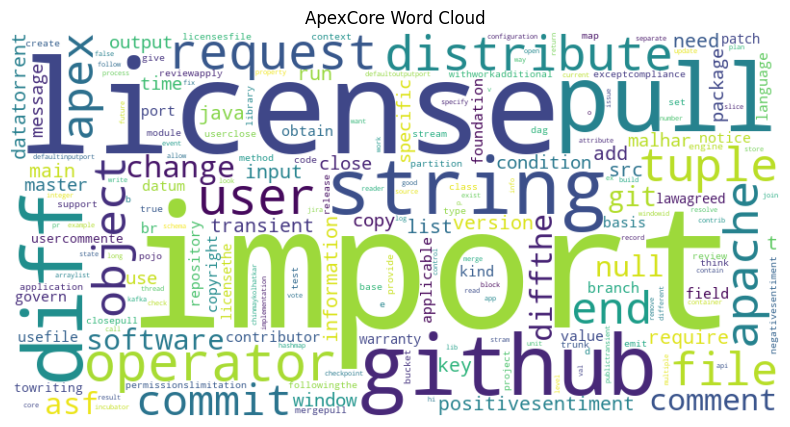

In [27]:
nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

all_test =  pd.read_csv('Test/data/apexcore_all_message_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)

all_text = ' '.join(all_test.dropna(subset = 'reply_body').reply_body.progress_apply(lambda x: ' '.join([token.lemma_ for token in nlp(x) if not token.is_stop and token.is_alpha])).tolist())
all_text = re.sub('\s+', ' ', all_text)
all_text = re.sub(r'[^A-Za-z\s]', '', all_text)
wordcloud = WordCloud(width=800, height=400, background_color='white', collocations = False).generate(all_text.lower())

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')   
plt.title("ApexCore Word Cloud")
plt.savefig('Apex_WC.png')
plt.show()

100%|██████████| 755/755 [00:06<00:00, 107.98it/s]


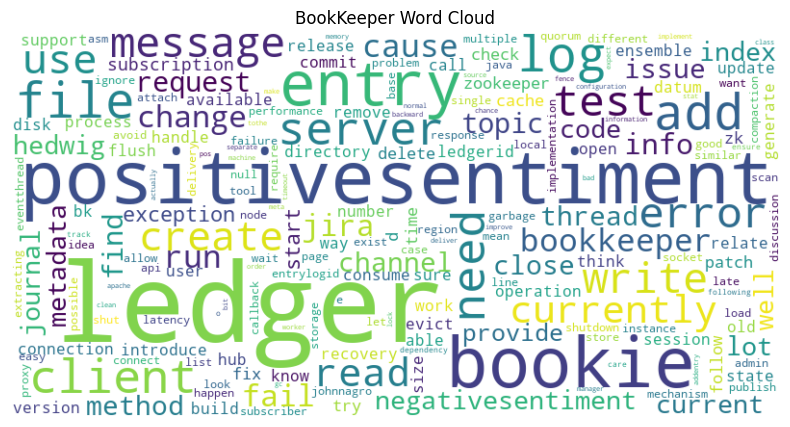

In [28]:
nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

all_test =  pd.read_csv('Test/data/bookkeeper_all_message_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)

all_text = ' '.join(all_test.dropna(subset = 'reply_body').reply_body.progress_apply(lambda x: ' '.join([token.lemma_ for token in nlp(x) if not token.is_stop and token.is_alpha])).tolist())
all_text = re.sub('\s+', ' ', all_text)
all_text = re.sub(r'[^A-Za-z\s]', '', all_text)
wordcloud = WordCloud(width=800, height=400, background_color='white', collocations = False).generate(all_text.lower())

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')   
plt.title("BookKeeper Word Cloud")
plt.savefig('BookKeeper_WC.png')
plt.show()

100%|██████████| 7306/7306 [02:26<00:00, 50.02it/s] 


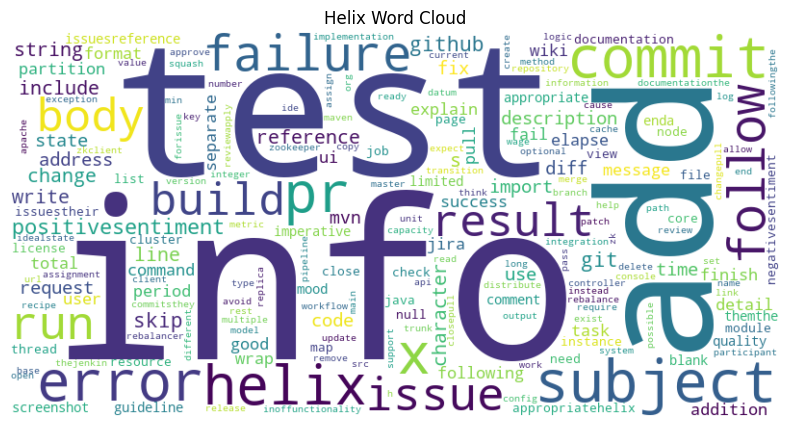

In [29]:
nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

all_test =  pd.read_csv('Test/data/helix_all_message_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)

all_text = ' '.join(all_test.dropna(subset = 'reply_body').reply_body.progress_apply(lambda x: ' '.join([token.lemma_ for token in nlp(x) if not token.is_stop and token.is_alpha])).tolist())
all_text = re.sub('\s+', ' ', all_text)
all_text = re.sub(r'[^A-Za-z\s]', '', all_text)
wordcloud = WordCloud(width=800, height=400, background_color='white', collocations = False).generate(all_text.lower())

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.title("Helix Word Cloud")
plt.savefig('Helix_WC.png')
plt.show()

C:\Users\woute\AppData\Local\Temp\ipykernel_23048\2123245941.py:4: DtypeWarning: Columns (14,16,17,20,22,23,24,25,26,27,28,29,30,31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  all_test =  pd.read_csv('Test/data/geronimo_all_message_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)
100%|██████████| 40886/40886 [09:21<00:00, 72.77it/s] 


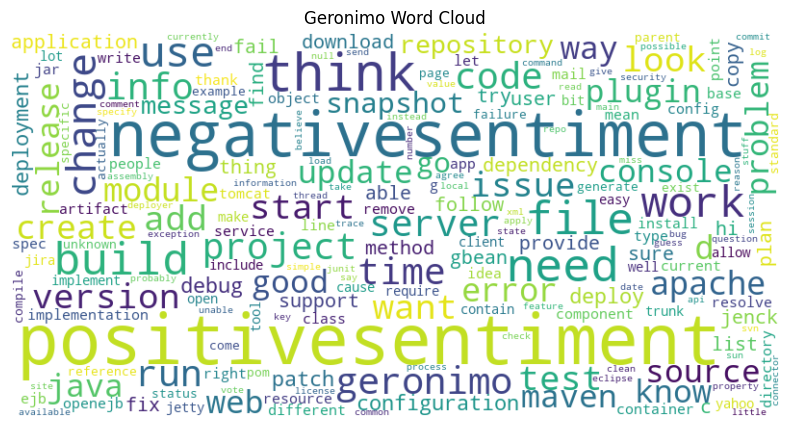

In [30]:
nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

all_test =  pd.read_csv('Test/data/geronimo_all_message_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)
all_text = ' '.join(all_test.dropna(subset = 'reply_body').reply_body.progress_apply(lambda x: ' '.join([token.lemma_ for token in nlp(x) if not token.is_stop and token.is_alpha])).tolist())
all_text = re.sub('\s+', ' ', all_text)
all_text = re.sub(r'[^A-Za-z\s]', '', all_text)
wordcloud = WordCloud(width=800, height=400, background_color='white', collocations = False).generate(all_text.lower())

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.title("Geronimo Word Cloud")
plt.savefig('Geronimo_WC.png')
plt.show()

100%|██████████| 10283/10283 [03:32<00:00, 48.30it/s]


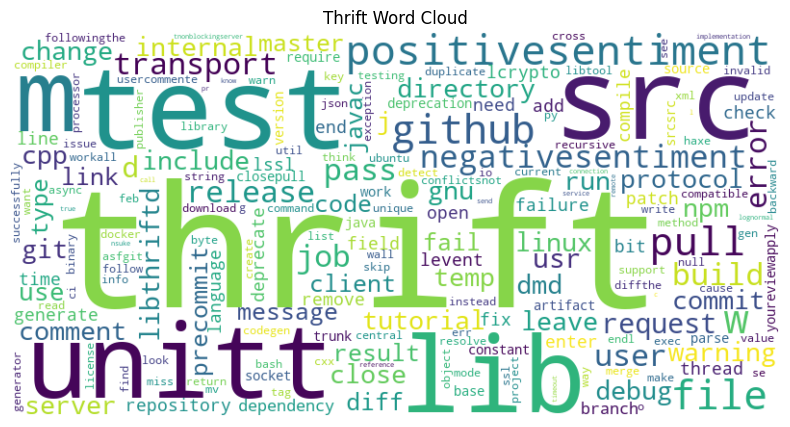

In [31]:
nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

all_test =  pd.read_csv('Test/data/thrift_all_message_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)

all_text = ' '.join(all_test.dropna(subset = 'reply_body').reply_body.progress_apply(lambda x: ' '.join([token.lemma_ for token in nlp(x) if not token.is_stop and token.is_alpha])).tolist())
all_text = re.sub('\s+', ' ', all_text)
all_text = re.sub(r'[^A-Za-z\s]', '', all_text)
wordcloud = WordCloud(width=800, height=400, background_color='white', collocations = False).generate(all_text.lower())

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.title("Thrift Word Cloud")
plt.savefig('Thrift_WC.png')
plt.show()

In [37]:
data = pd.read_csv('Test/data/ambari_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

print('Ambari devs:')
print(data[data['ragequit_t+1']].Alias)

data = pd.read_csv('Test/data/apexcore_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

print('Apex devs:')
print(data[data['ragequit_t+1']].Alias)

data = pd.read_csv('Test/data/bookkeeper_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

print('Book devs:')
print(data[data['ragequit_t+1']].Alias)

data = pd.read_csv('Test/data/helix_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

print('Helix devs:')
print(data[data['ragequit_t+1']].Alias)

data = pd.read_csv('Test/data/geronimo_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

print('Geronimo devs:')
print(data[data['ragequit_t+1']].Alias)

data = pd.read_csv('Test/data/thrift_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

print('Thrift devs:')
print(data[data['ragequit_t+1']].Alias)


Ambari devs:
54     Alexander Antonenko <hiveww@gmail.com> | hivew...
55     Aman Poonia <aman.poonia.29@gmail.com> | Aman ...
82     Andrii Tkach <atkach@apache.org> | Andrii Tkac...
150    Doroszlai, Attila <adoroszlai@hortonworks.com>...
168    Ishan Bhatt <ishanbhatt.1989@gmail.com> | Isha...
226    Madhuvanthi Radhakrishnan <mradhakrishnan@hort...
289              Sandor Molnar <smolnar@hortonworks.com>
296    Siddharth Wagle <swagle@hortonworks.com> | Sid...
410    smolnar82 <34065904+smolnar82@users.noreply.gi...
424    vishalsuvagia <vishalsuvagia@users.noreply.git...
Name: Alias, dtype: object
Apex devs:
29     Chetan Narsude <chetan@datatorrent.com> | Chet...
60     Gaurav Gupta <gauravgopi123@apache.org> | Gaur...
61     Hitesh-Scorpio <forhiteshjob@gmail.com> | Hite...
132    Sergey Golovko <sergey@datatorrent.com> | Serg...
146    Tushar R. Gosavi <tushar@apache.org> | Tushar ...
223    sandeshh <sandesh.hegde@gmail.com> | Sandesh H...
Name: Alias, dtype: object
Book devs:

In [1]:
import math

tn = 4360
tp = 58
fp = 16
fn = 554

print(f'f1-score: {(2*tp)/(2*tp+fp+fn)}')
print(f'MCC: {(tp*tn-fp*fn)/math.sqrt((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))}')
print(f'PLR: {(tp/(tp+fn))/(fp/(fp+tn))}')

f1-score: 0.16909620991253643
MCC: 0.24726947119124307
PLR: 25.919934640522875


In [4]:
message_data = pd.read_csv('Test/data/geronimo_all_message_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)
message_data = message_data[['reply_body', 'burnout']].dropna()

nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

message_data['lemmas'] = message_data.reply_body.progress_apply(lambda x: [token.lemma_ for token in nlp(handle_negation(x)) if not token.is_stop and token.is_alpha])
message_data['burnout'] = message_data['burnout'].astype(bool)
message_data

C:\Users\woute\AppData\Local\Temp\ipykernel_12252\471331601.py:1: DtypeWarning: Columns (14,16,17,20,22,23,24,25,26,27,28,29,30,31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  message_data = pd.read_csv('Test/data/geronimo_all_message_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)
100%|██████████| 7607/7607 [02:47<00:00, 45.36it/s]


,reply_body,burnout,lemmas
255,"jetty, openejb, servicemix are all using it as...",True,"[jetty, openejb, servicemix, configuration, wa..."
257,+1 good,True,[good]
259,we were first voting to seethe servicemix wer...,True,"[vote, seethe, servicemix, willing, accept, gi..."
265,we kinda voted already on but changes so to c...,True,"[kinda, vote, change, clear, thing, open, arri..."
268,i have just applied 2 trivial bug fixes to the...,True,"[apply, trivial, bug, fix, xbean, spring, modu..."
...,...,...,...
22812,welcome you see a jira that you are it is not ...,True,"[welcome, jira, email, list, let, know, like, ..."
22813,i should have all of the necessary paperwork s...,True,"[necessary, paperwork, email, let, know, join,..."
22814,"hi all, i was wondering - is it possible to ha...",True,"[hi, wonder, possible, plugin, need, example, ..."
22815,"sorry joe, i just got back to my am glad it ch...",True,"[sorry, joe, get, glad, change, change, cause,..."


In [5]:
message_data = message_data[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 0]

message_train, message_test = train_test_split(message_data, test_size=0.15, random_state=404, stratify = message_data['burnout'])
message_train, message_val = train_test_split(message_train, test_size=(0.15/0.85), random_state=404, stratify = message_train['burnout'])

print(f'length of train set: {len(message_train)}\nlength of validation set: {len(message_val)}\nlength of test set: {len(message_test)}')
message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages

# Oversample on the True cases in the train set
if 2*message_train["burnout"].sum()<len(message_train):
   # True is the minority class
    if 3*message_train["burnout"].sum()<len(message_train):
        # We need to over- and undersample to create balance
        message_train = pd.concat([message_train.loc[message_train[message_train['burnout']==1].index], message_train])
        print(f'Positive cases: {message_train["burnout"].sum()}')

        if 3*message_train["burnout"].sum()<len(message_train):
            # Check for massive imbalance
            message_train = pd.concat([message_train.loc[message_train[message_train['burnout']==1].index], message_train])
            print(f'Positive cases: {message_train["burnout"].sum()}')

        nMax = message_train["burnout"].sum()
        message_train = message_train.groupby('burnout').apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')
    else:
        nMax = message_train["burnout"].sum()
        # Only undersampling will do
        print(f'Positive cases: {message_train["burnout"].sum()}')
        message_train = message_train.groupby('burnout').apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')


else:
    if message_train["burnout"].sum()>0.67*len(message_train):
        # False is the minority class and we need to over- and undersample
        message_train = pd.concat([message_train.loc[message_train[message_train['burnout']==0].index], message_train])
        print(f'Positive cases: {message_train["burnout"].sum()}')

        if message_train["burnout"].sum()>0.67*len(message_train):
            # Check for massive imbalance (mainly ragequit case)
            message_train = pd.concat([message_train.loc[message_train[message_train['burnout']==0].index], message_train])
            print(f'Positive cases: {message_train["burnout"].sum()}')

        nMax = len(message_train) - message_train["burnout"].sum()
        message_train = message_train.groupby('burnout').apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

    else:
        nMax = len(message_train) - message_train["burnout"].sum()
        print(f'Positive cases: {message_train["burnout"].sum()}')
        message_train = message_train.groupby('burnout').apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

length of train set: 5151
length of validation set: 1104
length of test set: 1104


C:\Users\woute\AppData\Local\Temp\ipykernel_12252\2541841497.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages


Positive cases: 2372
New length of train set: 4744


C:\Users\woute\AppData\Local\Temp\ipykernel_12252\2541841497.py:23: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  message_train = message_train.groupby('burnout').apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)


In [6]:
def identity_tokenizer(text):
    return [token.lemma_ for token in nlp(handle_negation(text)) if not token.is_stop and token.is_alpha]

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['reply_body'])
validate_tf = tfidf.transform(message_val['reply_body'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(train_tf, message_train['burnout'])

classification_report(message_val['burnout'], classifier.predict(validate_tf))

C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


'              precision    recall  f1-score   support\n\n       False       0.74      0.78      0.76       791\n        True       0.34      0.29      0.32       313\n\n    accuracy                           0.64      1104\n   macro avg       0.54      0.54      0.54      1104\nweighted avg       0.62      0.64      0.63      1104\n'

In [7]:
%matplotlib inline
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
c = make_pipeline(tfidf, classifier)
explainer = LimeTextExplainer(class_names = ["No Burnout", "Burnt Out"])

exp = explainer.explain_instance(message_test.iloc[0,0], c.predict_proba, num_features=6)
exp.show_in_notebook(text=True)                 

In [8]:
exp = explainer.explain_instance(message_test.iloc[6,0], c.predict_proba, num_features=6)
exp.show_in_notebook(text=True)    

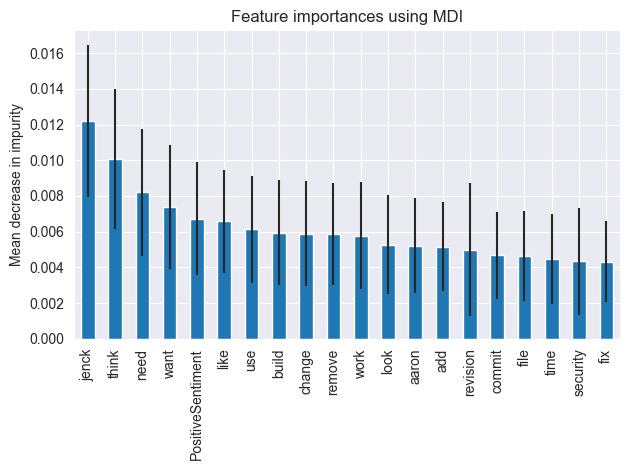

In [9]:
importances = pd.Series(classifier.feature_importances_)
best_values = importances.sort_values(ascending = False)[:20].index
std = np.std([tree.feature_importances_ for tree in classifier.estimators_], axis=0)
importances.index = vocab

fig, ax = plt.subplots()
importances.sort_values(ascending = False)[:20].plot.bar(yerr=std[best_values], ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

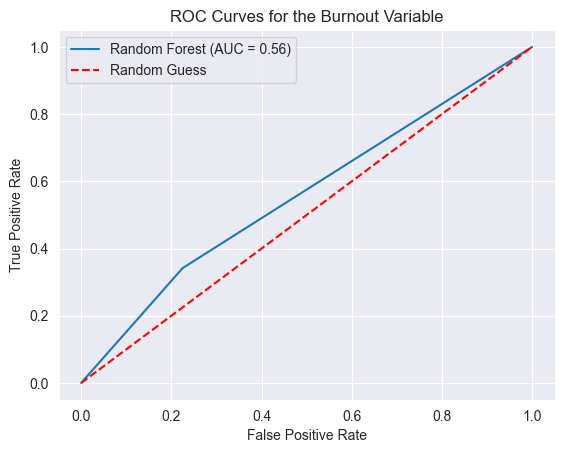

In [10]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, _ = roc_curve(message_test['burnout'], classifier.predict(tfidf.transform(message_test['reply_body'])))
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label=f'Random Forest (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'r--', label='Random Guess')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for the Burnout Variable')
plt.legend()
plt.show()

f1-score: 0.35785953177257523
MCC: 0.1203146594624539
PLR: 1.5191334314534948


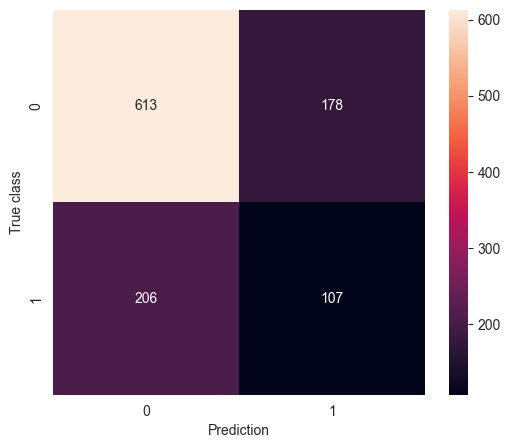

In [11]:
import math

cm = confusion_matrix(message_test['burnout'], classifier.predict(tfidf.transform(message_test['reply_body'])))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

tn = cm[0,0]
tp = cm[1,1]
fp = cm[0,1]
fn = cm[1,0]

print(f'f1-score: {(2*tp)/(2*tp+fp+fn)}')
print(f'MCC: {(tp*tn-fp*fn)/math.sqrt((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))}')
print(f'PLR: {(tp/(tp+fn))/(fp/(fp+tn))}')

In [3]:
message_data = pd.read_csv('Test/data/geronimo_all_message_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)
message_data = message_data[['reply_body', 'ragequit_t+1']].dropna()

nlp = spacy.load('en_core_web_sm')
tqdm.pandas()

message_data['lemmas'] = message_data.reply_body.progress_apply(lambda x: [token.lemma_ for token in nlp(handle_negation(x)) if not token.is_stop and token.is_alpha])
message_data['ragequit_t+1'] = message_data['ragequit_t+1'].astype(bool)

message_data = message_data[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 0]

message_train, message_test = train_test_split(message_data, test_size=0.15, random_state=404, stratify = message_data['ragequit_t+1'])
message_train, message_val = train_test_split(message_train, test_size=(0.15/0.85), random_state=404, stratify = message_train['ragequit_t+1'])

print(f'length of train set: {len(message_train)}\nlength of validation set: {len(message_val)}\nlength of test set: {len(message_test)}')
message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages

# Oversample on the True cases in the train set
if 2*message_train["ragequit_t+1"].sum()<len(message_train):
   # True is the minority class
    if 3*message_train["ragequit_t+1"].sum()<len(message_train):
        # We need to over- and undersample to create balance
        message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+1"]==1].index], message_train])
        print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')

        if 3*message_train["ragequit_t+1"].sum()<len(message_train):
            # Check for massive imbalance
            message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+1"]==1].index], message_train])
            print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')

        nMax = message_train["ragequit_t+1"].sum()
        message_train = message_train.groupby("ragequit_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')
    else:
        nMax = message_train["ragequit_t+1"].sum()
        # Only undersampling will do
        print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')
        message_train = message_train.groupby("ragequit_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')


else:
    if message_train["ragequit_t+1"].sum()>0.67*len(message_train):
        # False is the minority class and we need to over- and undersample
        message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+1"]==0].index], message_train])
        print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')

        if message_train["ragequit_t+1"].sum()>0.67*len(message_train):
            # Check for massive imbalance (mainly ragequit case)
            message_train = pd.concat([message_train.loc[message_train[message_train["ragequit_t+1"]==0].index], message_train])
            print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')

        nMax = len(message_train) - message_train["ragequit_t+1"].sum()
        message_train = message_train.groupby("ragequit_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

    else:
        nMax = len(message_train) - message_train["ragequit_t+1"].sum()
        print(f'Positive cases: {message_train["ragequit_t+1"].sum()}')
        message_train = message_train.groupby("ragequit_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)

        print(f'New length of train set: {len(message_train)}')

def identity_tokenizer(text):
    return [token.lemma_ for token in nlp(handle_negation(text)) if not token.is_stop and token.is_alpha]

tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, lowercase=False, sublinear_tf = True, min_df = round(len(message_train)/1000), max_df = 0.6)

train_tf = tfidf.fit_transform(message_train['reply_body'])
validate_tf = tfidf.transform(message_val['reply_body'])

vocab = tfidf.get_feature_names_out()

# Train Naive Bayes classifier


classifier = RandomForestClassifier(n_estimators = 500, random_state = 404)
classifier.fit(train_tf, message_train['ragequit_t+1'])

classification_report(message_val['ragequit_t+1'], classifier.predict(validate_tf))

C:\Users\woute\AppData\Local\Temp\ipykernel_568\49779376.py:1: DtypeWarning: Columns (14,16,17,20,22,23,24,25,26,27,28,29,30,31,32) have mixed types. Specify dtype option on import or set low_memory=False.
  message_data = pd.read_csv('Test/data/geronimo_all_message_data.csv', parse_dates = ['reply_datetimetz', 'start_month', 'To', 'start_datetime', 'end_datetime']).drop('Unnamed: 0', axis = 1)
100%|██████████| 20241/20241 [04:34<00:00, 73.84it/s] 


length of train set: 13617
length of validation set: 2918
length of test set: 2918
Positive cases: 432
Positive cases: 1296
New length of train set: 2592


C:\Users\woute\AppData\Local\Temp\ipykernel_568\49779376.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  message_train = message_train[message_data.apply(lambda x: len(x.lemmas), axis = 1) > 3] # remove shorter messages
C:\Users\woute\AppData\Local\Temp\ipykernel_568\49779376.py:32: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  message_train = message_train.groupby("ragequit_t+1").apply(lambda x: x.sample(n=min(nMax, len(x)))).reset_index(drop = True).sample(frac=1)
C:\Users\woute\OneDrive\Documenten\JADS\Thesis\venv_Thesis\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is

'              precision    recall  f1-score   support\n\n       False       1.00      0.99      0.99      2864\n        True       0.61      0.80      0.69        54\n\n    accuracy                           0.99      2918\n   macro avg       0.81      0.89      0.84      2918\nweighted avg       0.99      0.99      0.99      2918\n'

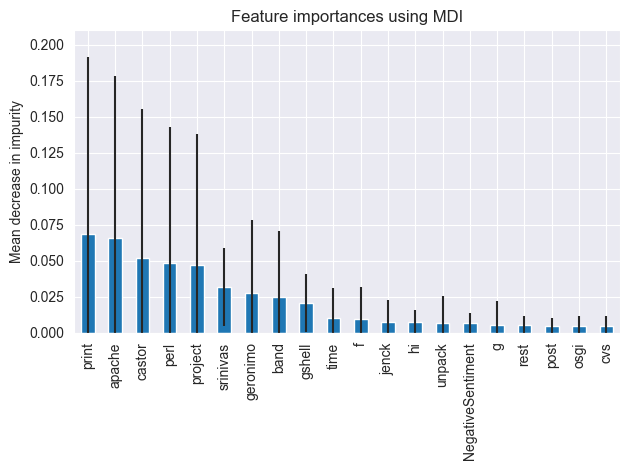

In [13]:
importances = pd.Series(classifier.feature_importances_)
best_values = importances.sort_values(ascending = False)[:20].index
std = np.std([tree.feature_importances_ for tree in classifier.estimators_], axis=0)
importances.index = vocab

fig, ax = plt.subplots()
importances.sort_values(ascending = False)[:20].plot.bar(yerr = std[best_values], ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
ax.set_ylim(0,0.21)
fig.tight_layout()

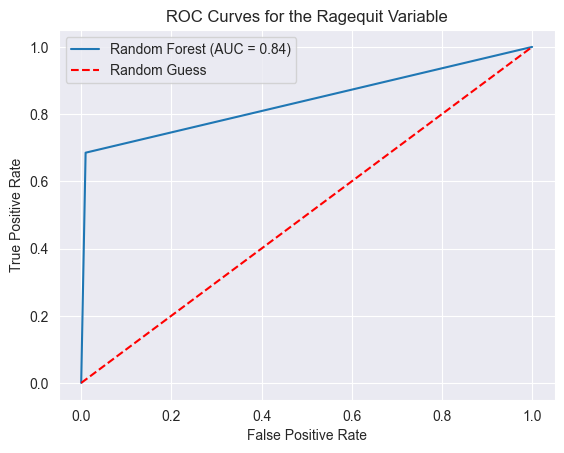

In [14]:
from sklearn.metrics import roc_curve, auc
fpr, tpr, _ = roc_curve(message_test['ragequit_t+1'], classifier.predict(tfidf.transform(message_test['reply_body'])))
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label=f'Random Forest (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'r--', label='Random Guess')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for the Ragequit Variable')
plt.legend()
plt.show()

f1-score: 0.6218487394957983
MCC: 0.6167972663138666
PLR: 70.08465608465609


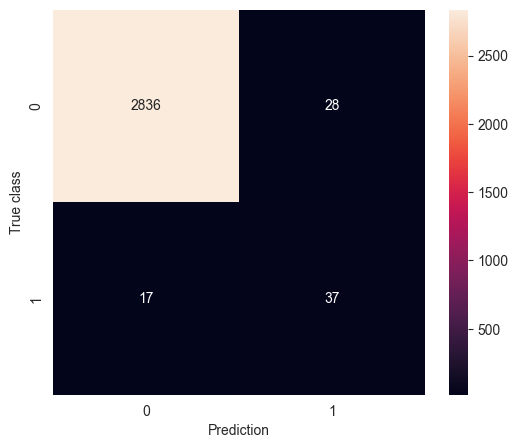

In [15]:
import math

cm = confusion_matrix(message_test['ragequit_t+1'], classifier.predict(tfidf.transform(message_test['reply_body'])))
fig = plt.figure(figsize=(6,5))
ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt = 'g');
ax.set_xlabel('Prediction')
ax.set_ylabel('True class')

tn = cm[0,0]
tp = cm[1,1]
fp = cm[0,1]
fn = cm[1,0]

print(f'f1-score: {(2*tp)/(2*tp+fp+fn)}')
print(f'MCC: {(tp*tn-fp*fn)/math.sqrt((tp+fp)*(tp+fn)*(tn+fp)*(tn+fn))}')
print(f'PLR: {(tp/(tp+fn))/(fp/(fp+tn))}')

In [4]:
%matplotlib inline
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
c = make_pipeline(tfidf, classifier)
explainer = LimeTextExplainer(class_names = ["No Ragequit", "Ragequit"])

exp = explainer.explain_instance(message_test.iloc[1060,0], c.predict_proba, num_features=6)
exp.show_in_notebook(text=True)                 

In [5]:
exp = explainer.explain_instance(message_test.iloc[1088,0], c.predict_proba, num_features=6)
exp.show_in_notebook(text=True)       

In [17]:
np.where(classifier.predict(tfidf.transform(message_test['reply_body']))==1)

(array([  17,   83,  132,  141,  143,  196,  262,  312,  323,  360,  434,
         487,  491,  528,  539,  563,  578,  636,  720,  726,  752,  775,
         778,  832,  852,  888,  890,  999, 1006, 1060, 1088, 1150, 1258,
        1281, 1284, 1338, 1342, 1356, 1384, 1398, 1417, 1475, 1485, 1495,
        1561, 1581, 1616, 1705, 1729, 1751, 1830, 1888, 1925, 2022, 2237,
        2333, 2390, 2398, 2447, 2458, 2466, 2628, 2642, 2645, 2667, 2674,
        2710, 2714, 2718, 2762, 2792], dtype=int64),)

In [17]:
data = pd.read_csv('Test/data/ambari_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

data.describe(include = 'all')

,Alias,From,Avg. distance,Lone Wolf,Messages Sent,Organisational Silo,Radio Silence,To,Workload,burnout,...,end_datetime,st_congruence,reply_degree,reply_close,reply_between,git_degree,git_close,git_between,reply_density,git_density
count,429,429,203.000000,429,429.000000,429,429,429,429.000000,429,...,429,429.000000,429.000000,0.0,429.000000,423.000000,0.0,421.000000,429.000000,423.000000
unique,95,NaN,NaN,2,NaN,2,2,NaN,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Andrii Tkach <atkach@apache.org> | Andrii Tkac...,NaN,NaN,True,NaN,True,True,NaN,NaN,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,14,NaN,NaN,328,NaN,302,222,NaN,NaN,354,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2018-07-03 09:00:26.825174784+00:00,2.722788,NaN,3.589744,NaN,NaN,2018-08-02 09:00:26.825174784+00:00,8588.762238,NaN,...,2018-08-02 09:00:26.825174784+00:00,0.062357,0.089066,NaN,0.003886,0.444356,NaN,0.274975,0.010997,0.130793
min,NaN,2018-01-02 10:00:52+00:00,1.000000,NaN,0.000000,NaN,NaN,2018-02-01 10:00:52+00:00,1.000000,NaN,...,2018-02-01 10:00:52+00:00,0.000000,0.000000,NaN,0.000000,0.000000,NaN,0.000000,0.000000,0.000000
25%,NaN,2018-03-03 10:00:52+00:00,2.000000,NaN,0.000000,NaN,NaN,2018-04-02 10:00:52+00:00,35.000000,NaN,...,2018-04-02 10:00:52+00:00,0.000000,0.030258,NaN,0.000000,0.247312,NaN,0.170068,0.001488,0.086022
50%,NaN,2018-06-01 10:00:52+00:00,2.846154,NaN,1.000000,NaN,NaN,2018-07-01 10:00:52+00:00,344.000000,NaN,...,2018-07-01 10:00:52+00:00,0.017857,0.102725,NaN,0.001545,0.388889,NaN,0.282732,0.010796,0.137931
75%,NaN,2018-09-29 10:00:52+00:00,3.000000,NaN,5.000000,NaN,NaN,2018-10-29 10:00:52+00:00,1251.000000,NaN,...,2018-10-29 10:00:52+00:00,0.059701,0.120982,NaN,0.007188,0.611538,NaN,0.379418,0.015647,0.177778
max,NaN,2020-06-20 10:00:52+00:00,4.000000,NaN,31.000000,NaN,NaN,2020-07-20 10:00:52+00:00,684201.000000,NaN,...,2020-07-20 10:00:52+00:00,1.000000,0.184211,NaN,0.025526,0.671922,NaN,0.559953,0.078947,0.189189


In [18]:
data = pd.read_csv('Test/data/apexcore_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

data.describe(include = 'all')

,Alias,From,Avg. distance,Lone Wolf,Messages Sent,Organisational Silo,Radio Silence,To,Workload,burnout,...,end_datetime,st_congruence,reply_degree,reply_close,reply_between,git_degree,git_close,git_between,reply_density,git_density
count,255,255,175.000000,255,255.000000,255,255,255,255.000000,255,...,255,255.000000,242.000000,0.0,242.000000,254.000000,59.000000,250.000000,242.000000,254.000000
unique,50,NaN,NaN,2,NaN,2,2,NaN,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Vlad <v.rozov@datatorrent.com> | Vlad Rozov <v...,NaN,NaN,True,NaN,False,True,NaN,NaN,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,27,NaN,NaN,182,NaN,156,146,NaN,NaN,213,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2016-06-12 23:53:17.705882112+00:00,2.210151,NaN,18.674510,NaN,NaN,2016-07-12 23:53:17.705882112+00:00,483.592157,NaN,...,2016-07-12 23:53:17.705882112+00:00,0.458048,0.366531,NaN,0.108597,0.324273,0.505738,0.238301,0.234343,0.352419
min,NaN,2015-07-06 21:03:53+00:00,1.000000,NaN,0.000000,NaN,NaN,2015-08-05 21:03:53+00:00,1.000000,NaN,...,2015-08-05 21:03:53+00:00,0.000000,0.259740,NaN,0.036511,0.000000,0.267310,0.000000,0.085990,0.000000
25%,NaN,2015-11-03 21:03:53+00:00,1.414286,NaN,3.000000,NaN,NaN,2015-12-03 21:03:53+00:00,37.500000,NaN,...,2015-12-03 21:03:53+00:00,0.333333,0.313589,NaN,0.084242,0.222222,0.300024,0.117284,0.162415,0.200000
50%,NaN,2016-05-01 21:03:53+00:00,2.000000,NaN,12.000000,NaN,NaN,2016-05-31 21:03:53+00:00,174.000000,NaN,...,2016-05-31 21:03:53+00:00,0.444444,0.374747,NaN,0.096191,0.336364,0.515146,0.184127,0.225306,0.365278
75%,NaN,2017-01-26 21:03:53+00:00,2.666667,NaN,29.000000,NaN,NaN,2017-02-25 21:03:53+00:00,500.500000,NaN,...,2017-02-25 21:03:53+00:00,0.500000,0.427755,NaN,0.129434,0.389474,0.734435,0.314630,0.262458,0.500000
max,NaN,2017-11-22 21:03:53+00:00,6.000000,NaN,106.000000,NaN,NaN,2017-12-22 21:03:53+00:00,12338.000000,NaN,...,2017-12-22 21:03:53+00:00,1.000000,0.518182,NaN,0.521111,0.509091,0.888889,0.833333,0.464286,0.730769


In [19]:
data = pd.read_csv('Test/data/bookkeeper_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

data.describe(include = 'all')

,Alias,From,Avg. distance,Lone Wolf,Messages Sent,Organisational Silo,Radio Silence,To,Workload,burnout,...,end_datetime,st_congruence,reply_degree,reply_close,reply_between,git_degree,git_close,git_between,reply_density,git_density
count,95,95,66.000000,95,95.000000,95,95,95,95.000000,95,...,95,95.000000,93.000000,0.0,82.0,82.0,52.0,52.0,93.000000,82.000000
unique,4,NaN,NaN,2,NaN,2,2,NaN,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Sijie Guo <sijie@apache.org> | Sijie Guo,NaN,NaN,True,NaN,False,True,NaN,NaN,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,36,NaN,NaN,80,NaN,60,76,NaN,NaN,75,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2013-08-16 06:25:30.526315520+00:00,1.151515,NaN,4.284211,NaN,NaN,2013-09-15 06:25:30.526315520+00:00,2287.536842,NaN,...,2013-09-15 06:25:30.526315520+00:00,0.157895,0.015694,NaN,0.0,0.0,0.0,0.0,0.007424,0.975610
min,NaN,2012-01-02 11:28:40+00:00,1.000000,NaN,0.000000,NaN,NaN,2012-02-01 11:28:40+00:00,4.000000,NaN,...,2012-02-01 11:28:40+00:00,0.000000,0.000000,NaN,0.0,0.0,0.0,0.0,0.000000,0.000000
25%,NaN,2012-09-28 11:28:40+00:00,1.000000,NaN,1.000000,NaN,NaN,2012-10-28 11:28:40+00:00,170.500000,NaN,...,2012-10-28 11:28:40+00:00,0.000000,0.000000,NaN,0.0,0.0,0.0,0.0,0.000000,1.000000
50%,NaN,2013-06-25 11:28:40+00:00,1.000000,NaN,3.000000,NaN,NaN,2013-07-25 11:28:40+00:00,696.000000,NaN,...,2013-07-25 11:28:40+00:00,0.000000,0.000000,NaN,0.0,0.0,0.0,0.0,0.000000,1.000000
75%,NaN,2014-07-05 11:28:40+00:00,1.000000,NaN,6.000000,NaN,NaN,2014-08-04 11:28:40+00:00,1816.000000,NaN,...,2014-08-04 11:28:40+00:00,0.000000,0.000000,NaN,0.0,0.0,0.0,0.0,0.000000,1.000000
max,NaN,2015-10-13 11:28:40+00:00,2.000000,NaN,18.000000,NaN,NaN,2015-11-12 11:28:40+00:00,32647.000000,NaN,...,2015-11-12 11:28:40+00:00,1.000000,0.150000,NaN,0.0,0.0,0.0,0.0,0.100000,1.000000


In [20]:
data = pd.read_csv('Test/data/geronimo_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

data.describe(include = 'all')

,Alias,From,Avg. distance,Lone Wolf,Messages Sent,Organisational Silo,Radio Silence,To,Workload,burnout,...,end_datetime,st_congruence,reply_degree,reply_close,reply_between,git_degree,git_close,git_between,reply_density,git_density
count,682,682,455.000000,682,682.000000,682,682,682,682.000000,682,...,682,682.000000,682.000000,0.0,682.000000,682.000000,241.000000,682.000000,682.000000,682.000000
unique,44,NaN,NaN,2,NaN,2,2,NaN,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,David Jencks <djencks@apache.org> | David Jenc...,NaN,NaN,True,NaN,True,False,NaN,NaN,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,51,NaN,NaN,560,NaN,455,477,NaN,NaN,539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2006-01-17 05:19:30.926686592+00:00,2.259507,NaN,27.007331,NaN,NaN,2006-02-16 05:19:30.926686592+00:00,7957.130499,NaN,...,2006-02-16 05:19:30.926686592+00:00,0.404688,0.368874,NaN,0.106753,0.341789,0.454059,0.220354,0.166114,0.451024
min,NaN,2003-08-06 20:27:26+00:00,1.000000,NaN,0.000000,NaN,NaN,2003-09-05 20:27:26+00:00,1.000000,NaN,...,2003-09-05 20:27:26+00:00,0.161290,0.169683,NaN,0.048921,0.111111,0.187500,0.008818,0.040742,0.158333
25%,NaN,2005-01-27 20:27:26+00:00,1.527778,NaN,0.000000,NaN,NaN,2005-02-26 20:27:26+00:00,96.000000,NaN,...,2005-02-26 20:27:26+00:00,0.275694,0.334875,NaN,0.069373,0.285714,0.353504,0.133333,0.110119,0.333333
50%,NaN,2006-03-23 20:27:26+00:00,2.200000,NaN,13.000000,NaN,NaN,2006-04-22 20:27:26+00:00,852.000000,NaN,...,2006-04-22 20:27:26+00:00,0.363636,0.367255,NaN,0.090090,0.348810,0.458752,0.188209,0.164310,0.450980
75%,NaN,2007-01-17 20:27:26+00:00,2.800000,NaN,36.750000,NaN,NaN,2007-02-16 20:27:26+00:00,4716.750000,NaN,...,2007-02-16 20:27:26+00:00,0.518750,0.395967,NaN,0.133227,0.400000,0.494880,0.284444,0.199017,0.545455
max,NaN,2007-11-13 20:27:26+00:00,7.000000,NaN,364.000000,NaN,NaN,2007-12-13 20:27:26+00:00,763129.000000,NaN,...,2007-12-13 20:27:26+00:00,0.913043,0.545796,NaN,0.304234,0.584559,0.762037,0.585034,0.364692,0.888889


In [21]:
data = pd.read_csv('Test/data/helix_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

data.describe(include = 'all')

,Alias,From,Avg. distance,Lone Wolf,Messages Sent,Organisational Silo,Radio Silence,To,Workload,burnout,...,end_datetime,st_congruence,reply_degree,reply_close,reply_between,git_degree,git_close,git_between,reply_density,git_density
count,348,348,170.000000,348,348.000000,348,348,348,348.000000,348,...,348,348.000000,348.000000,0.0,343.000000,341.000000,85.000000,317.000000,348.000000,341.000000
unique,44,NaN,NaN,2,NaN,2,2,NaN,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Junkai Xue <jxue@linkedin.com> | Junkai Xue <j...,NaN,NaN,True,NaN,True,True,NaN,NaN,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,51,NaN,NaN,231,NaN,187,211,NaN,NaN,295,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2018-09-13 17:43:45.999999744+00:00,2.297157,NaN,10.123563,NaN,NaN,2018-10-13 17:43:45.999999744+00:00,3756.244253,NaN,...,2018-10-13 17:43:45.999999744+00:00,0.306334,0.254040,NaN,0.149137,0.260386,0.682524,0.271877,0.152671,0.362654
min,NaN,2015-01-05 05:43:46+00:00,1.000000,NaN,0.000000,NaN,NaN,2015-02-04 05:43:46+00:00,1.000000,NaN,...,2015-02-04 05:43:46+00:00,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,2017-07-23 05:43:46+00:00,1.666667,NaN,0.000000,NaN,NaN,2017-08-22 05:43:46+00:00,187.000000,NaN,...,2017-08-22 05:43:46+00:00,0.000000,0.162500,NaN,0.000000,0.166667,0.600000,0.020000,0.083333,0.194444
50%,NaN,2018-11-15 05:43:46+00:00,2.000000,NaN,3.000000,NaN,NaN,2018-12-15 05:43:46+00:00,658.500000,NaN,...,2018-12-15 05:43:46+00:00,0.250000,0.267316,NaN,0.133333,0.266667,0.750000,0.229025,0.161905,0.333333
75%,NaN,2020-02-08 05:43:46+00:00,3.000000,NaN,12.000000,NaN,NaN,2020-03-09 05:43:46+00:00,2038.500000,NaN,...,2020-03-09 05:43:46+00:00,0.407143,0.333333,NaN,0.260732,0.333333,0.864207,0.386161,0.205128,0.500000
max,NaN,2020-11-04 05:43:46+00:00,5.000000,NaN,166.000000,NaN,NaN,2020-12-04 05:43:46+00:00,480304.000000,NaN,...,2020-12-04 05:43:46+00:00,1.000000,0.560440,NaN,0.528600,0.611111,1.000000,1.000000,0.466667,1.000000


In [22]:
data = pd.read_csv('Test/data/thrift_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

data.describe(include = 'all')

,Alias,From,Avg. distance,Lone Wolf,Messages Sent,Organisational Silo,Radio Silence,To,Workload,burnout,...,end_datetime,st_congruence,reply_degree,reply_close,reply_between,git_degree,git_close,git_between,reply_density,git_density
count,375,375,140.000000,375,375.000000,375,375,375,375.000000,375,...,375,375.000000,375.000000,0.0,375.000000,375.000000,0.0,375.000000,375.000000,375.000000
unique,208,NaN,NaN,2,NaN,2,2,NaN,NaN,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Jens Geyer <jensg@apache.org> | Jens Geyer jen...,NaN,NaN,False,NaN,False,True,NaN,NaN,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,31,NaN,NaN,252,NaN,338,292,NaN,NaN,359,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2017-05-16 09:47:45.999999488+00:00,2.866111,NaN,10.202667,NaN,NaN,2017-06-15 09:47:45.999999488+00:00,600.373333,NaN,...,2017-06-15 09:47:45.999999488+00:00,0.431029,0.269457,NaN,0.124802,0.178918,NaN,0.085275,0.030404,0.066983
min,NaN,2016-01-01 01:09:22+00:00,1.000000,NaN,0.000000,NaN,NaN,2016-01-31 01:09:22+00:00,1.000000,NaN,...,2016-01-31 01:09:22+00:00,0.000000,0.046032,NaN,0.001633,0.000000,NaN,0.000000,0.008296,0.000000
25%,NaN,2016-07-14 01:09:22+00:00,1.383333,NaN,2.000000,NaN,NaN,2016-08-13 01:09:22+00:00,7.000000,NaN,...,2016-08-13 01:09:22+00:00,0.100000,0.172222,NaN,0.036404,0.071429,NaN,0.000000,0.021456,0.027778
50%,NaN,2017-05-25 01:09:22+00:00,2.500000,NaN,4.000000,NaN,NaN,2017-06-24 01:09:22+00:00,30.000000,NaN,...,2017-06-24 01:09:22+00:00,0.333333,0.236612,NaN,0.091429,0.183824,NaN,0.055556,0.027692,0.066176
75%,NaN,2018-02-19 01:09:22+00:00,4.000000,NaN,8.000000,NaN,NaN,2018-03-21 01:09:22+00:00,205.000000,NaN,...,2018-03-21 01:09:22+00:00,0.714286,0.348837,NaN,0.184955,0.244444,NaN,0.128540,0.038462,0.089744
max,NaN,2018-11-16 01:09:22+00:00,6.000000,NaN,210.000000,NaN,NaN,2018-12-16 01:09:22+00:00,20098.000000,NaN,...,2018-12-16 01:09:22+00:00,1.000000,0.551920,NaN,0.396318,0.500000,NaN,0.477237,0.072464,0.194444


In [23]:
data = pd.read_csv('Test/data/all_logistic_data.csv', parse_dates = ['From', 'To', 'start_datetime', 'end_datetime']).astype({'burnout':bool}).drop('Unnamed: 0', axis = 1)

data.describe()

,Avg. distance,Messages Sent,Workload,standardized_workload,st_congruence,reply_degree,reply_close,reply_between,git_degree,git_close,git_between,reply_density,git_density
count,1209.000000,2184.000000,2184.000000,2184.000000,2184.000000,2169.000000,0.0,2153.000000,2157.000000,437.000000,2097.000000,2169.000000,2157.000000
mean,2.345203,14.870421,5029.435440,1.000000,0.321791,0.262515,NaN,0.092293,0.305662,0.451445,0.211628,0.110622,0.315819
std,1.119814,28.287772,33467.015217,2.911007,0.292764,0.145756,NaN,0.096329,0.171184,0.253709,0.179987,0.101894,0.254625
min,1.000000,0.000000,1.000000,0.000069,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.500000,0.000000,41.750000,0.021089,0.055556,0.133333,NaN,0.008040,0.212121,0.300024,0.083333,0.019481,0.123123
50%,2.000000,5.000000,347.500000,0.142917,0.285714,0.296703,NaN,0.075911,0.321429,0.458752,0.178571,0.085990,0.227941
75%,3.000000,17.000000,1588.750000,0.676704,0.472588,0.379608,NaN,0.130089,0.388889,0.629464,0.306674,0.179021,0.487179
max,7.000000,364.000000,763129.000000,46.674683,1.000000,0.560440,NaN,0.528600,0.671922,1.000000,1.000000,0.466667,1.000000
